In [1]:
!pip install catboost
# if neceessary then uncomment it

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 7.5 MB/s eta 0:00:00


# Importing necessary libraries for data manipulation and visualization

In [2]:
# Importing necessary libraries for data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn import metrics
from scipy import stats
from math import sqrt

# Importing visualization libraries and setting inline display for plots
from matplotlib import pyplot as plt
%matplotlib inline
from matplotlib.colors import ListedColormap

# Ignoring warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

# Importing functions for train/test split and evaluation metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Importing functions for hyperparameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score

# Importing machine learning models
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.ensemble import StackingClassifier

# Importing additional metrics for model evaluation
from sklearn.metrics import confusion_matrix, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report

# Importing preprocessing functions
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap

# More metrics for regression evaluation
from sklearn.metrics import accuracy_score, r2_score, mean_absolute_error, mean_squared_error

# Importing XGBoost library
import os
# Setting path for MinGW compiler if necessary (commented out)
# mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-7.2.0-posix-seh-rt_v5-rev0\\mingw64\\bin'
# os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
from xgboost import XGBClassifier
from xgboost import plot_importance  # For plotting feature importance

# Importing joblib for model persistence
import joblib

# Setting Seaborn and Matplotlib styles for better visualization
sns.set()
plt.style.use('ggplot')
%matplotlib inline

# Importing additional preprocessing and pipeline utilities
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder

# Importing additional regression models and ensemble methods
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import lightgbm as lgb


**Upload Data Set**

In [3]:
train_df = pd.read_csv('/content/train.csv')
test_df = pd.read_csv('/content/test.csv')

In [4]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
#find the object,int,float value
t = (train_df.dtypes == 'object')
object_cols = list(t[t].index)
print("Categorical variables:")
print(object_cols)
print('-'*50)

t = (train_df.dtypes == 'int')
num_cols = list(t[t].index)
print("Integer variables:")
print(num_cols)
print('-'*50)

t = (train_df.dtypes == 'float')
num_cols = list(t[t].index)
print("Float variables:")
print('-'*50)

Categorical variables:
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']
--------------------------------------------------
Integer variables:
['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCa

In [7]:
train_df.dtypes[train_df.dtypes != 'object']

Id                 int64
MSSubClass         int64
LotFrontage      float64
LotArea            int64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1         int64
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
1stFlrSF           int64
2ndFlrSF           int64
LowQualFinSF       int64
GrLivArea          int64
BsmtFullBath       int64
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt      float64
GarageCars         int64
GarageArea         int64
WoodDeckSF         int64
OpenPorchSF        int64
EnclosedPorch      int64
3SsnPorch          int64
ScreenPorch        int64
PoolArea           int64
MiscVal            int64
MoSold             int64
YrSold             int64
SalePrice          int64
dtype: object

In [8]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
#find the missing value
print(train_df.isnull().sum())

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64


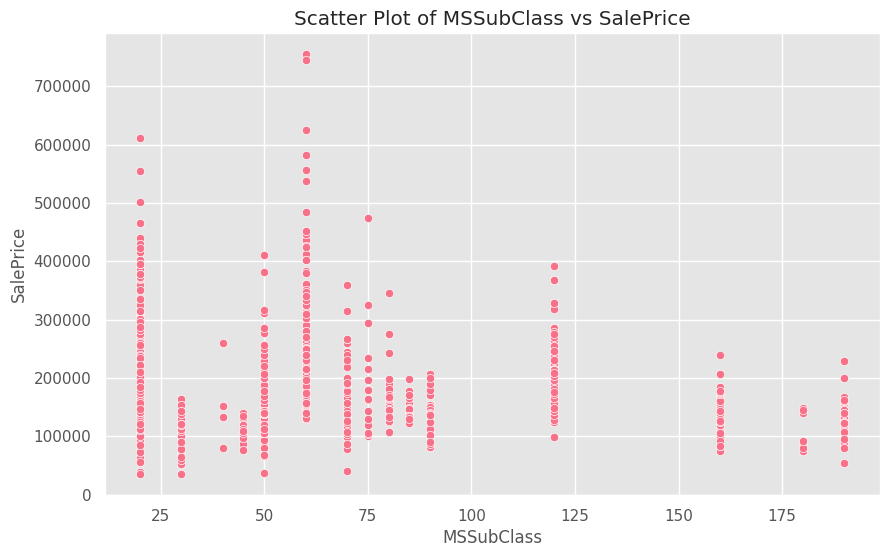

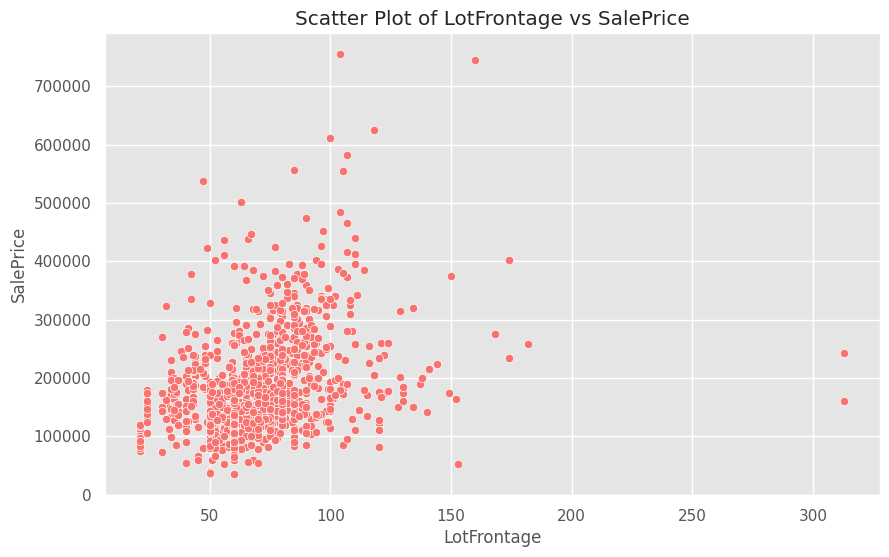

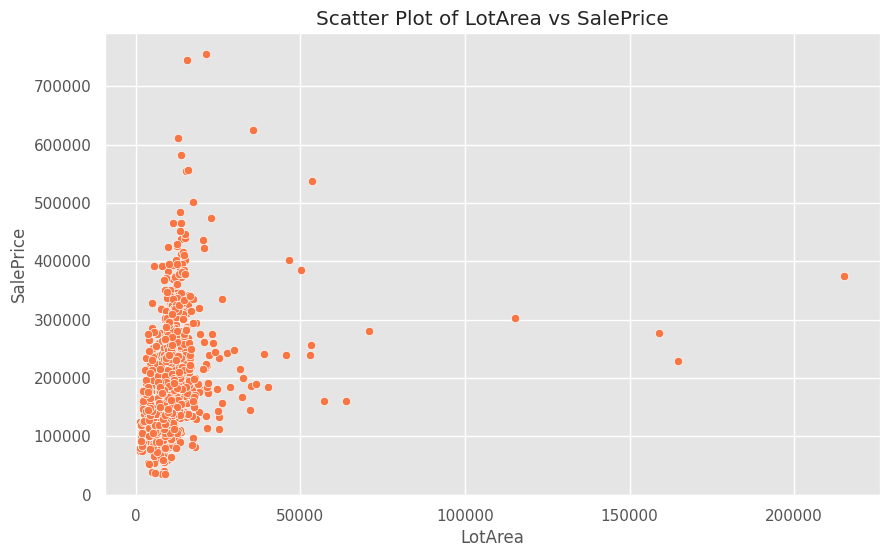

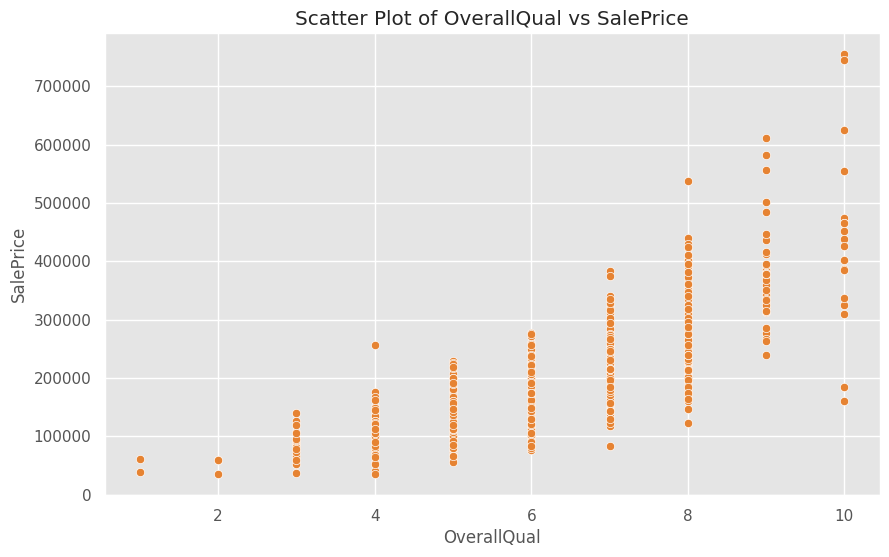

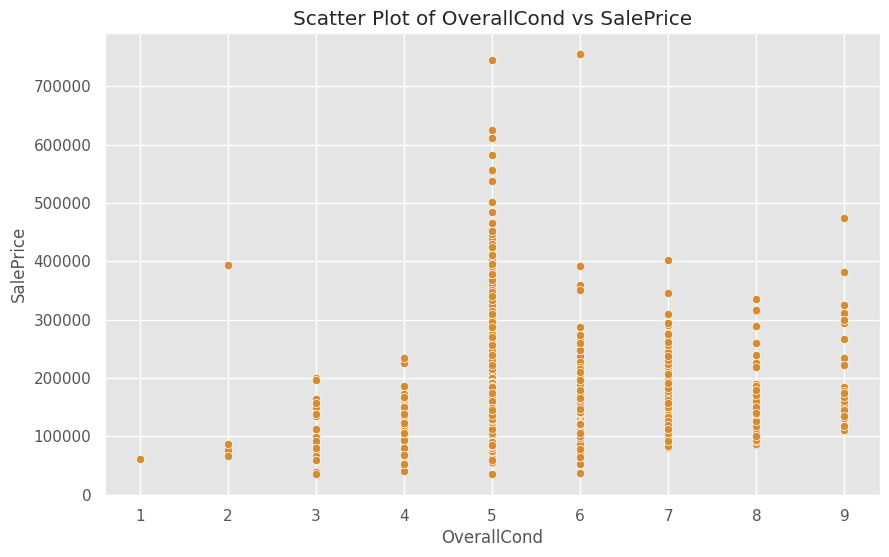

...

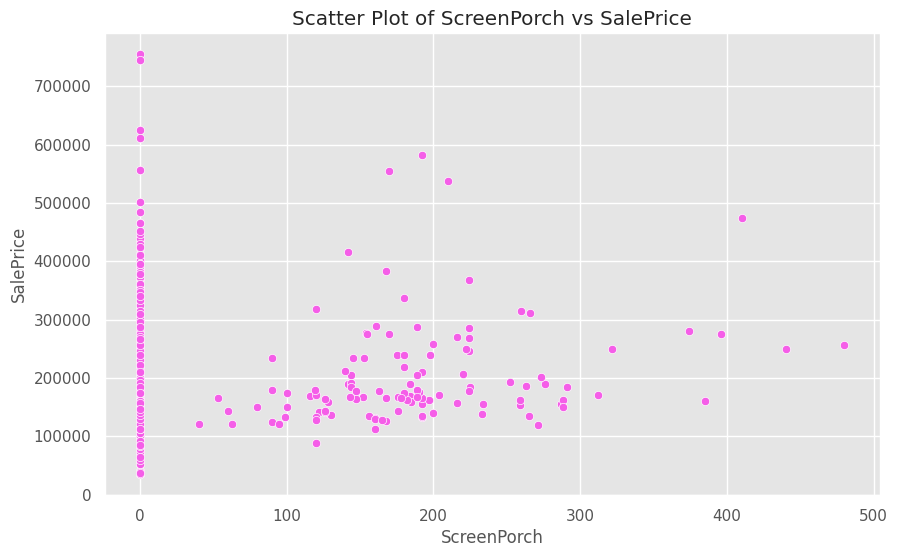

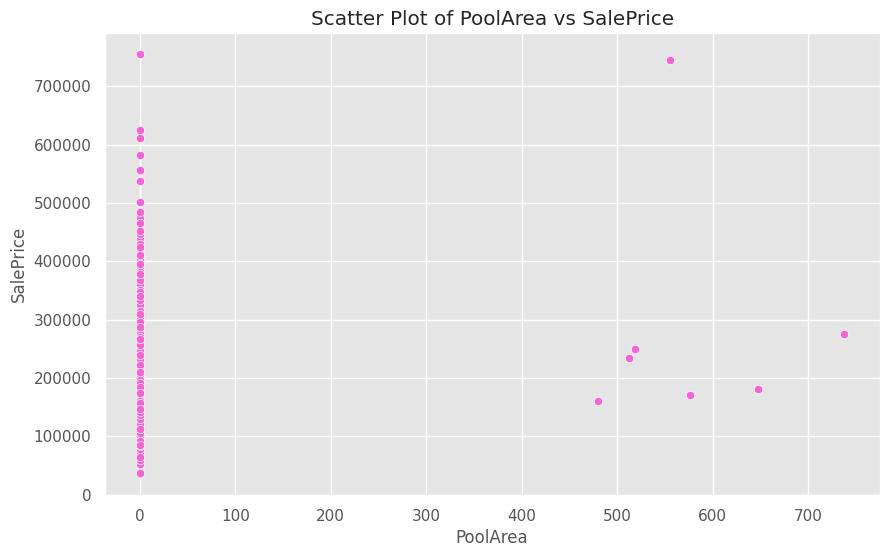

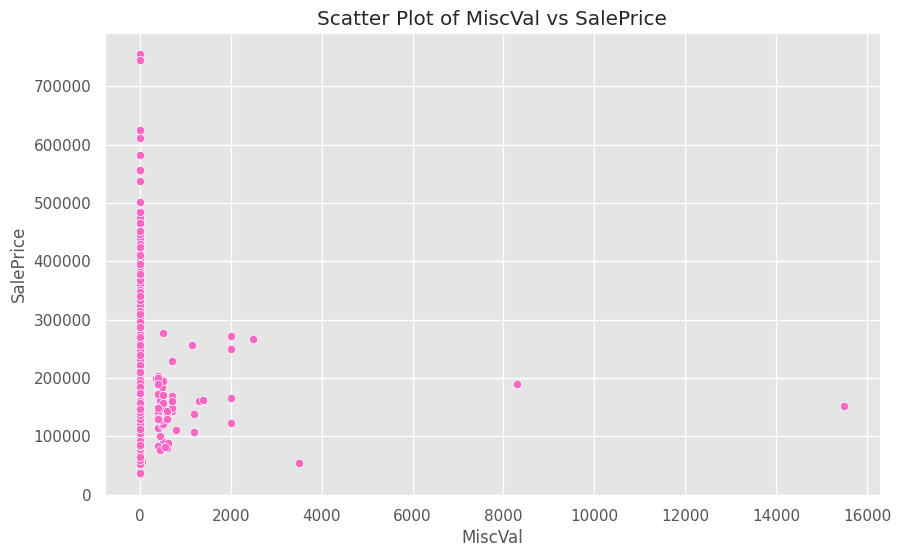

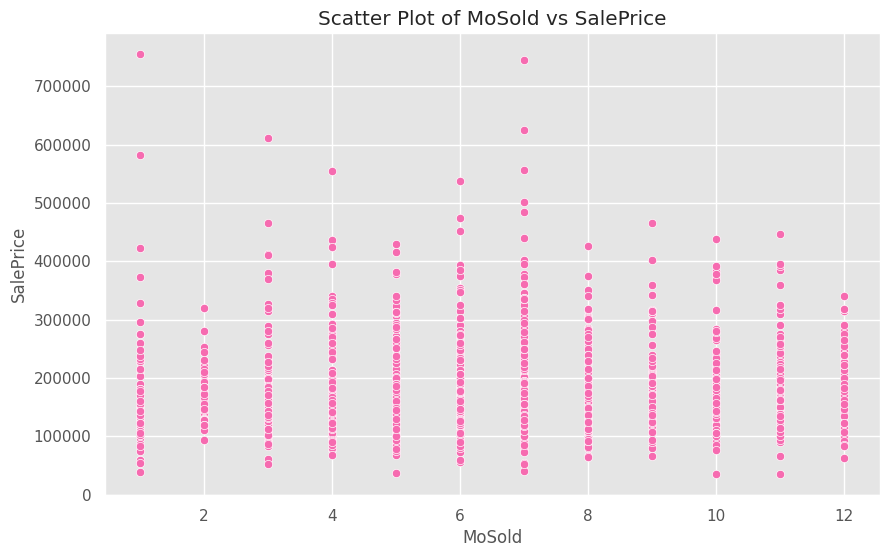

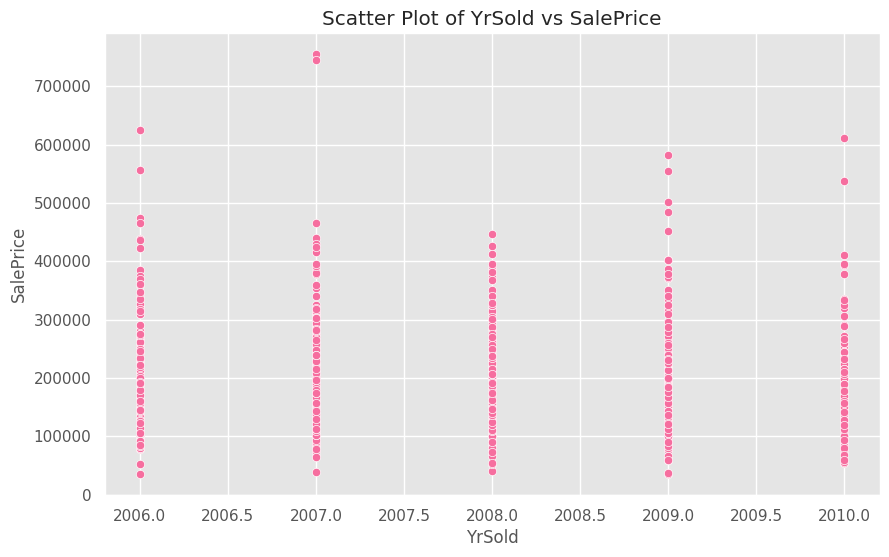

In [10]:
# List of features to plot against SalePrice
features = [
    'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
    'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
    'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
    'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
    'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
    'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
    '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'
]

# List of colors for different features
colors = sns.color_palette('husl', len(features))

# Create scatter plots
for feature, color in zip(features, colors):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=train_df, x=feature, y='SalePrice', color=color)
    plt.title(f'Scatter Plot of {feature} vs SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.show()


Missing Values Count:
Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64


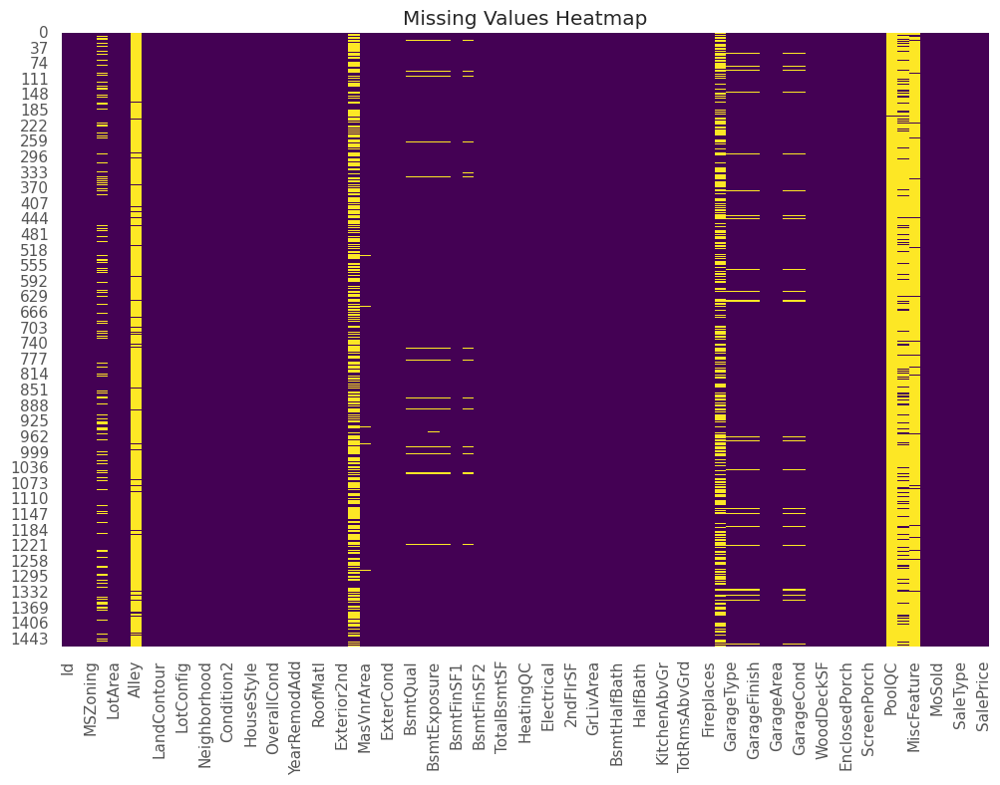

In [11]:
# Check for missing values
print("Missing Values Count:")
print(train_df.isnull().sum())

# Visualize missing values (if needed)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(train_df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


<Axes: >

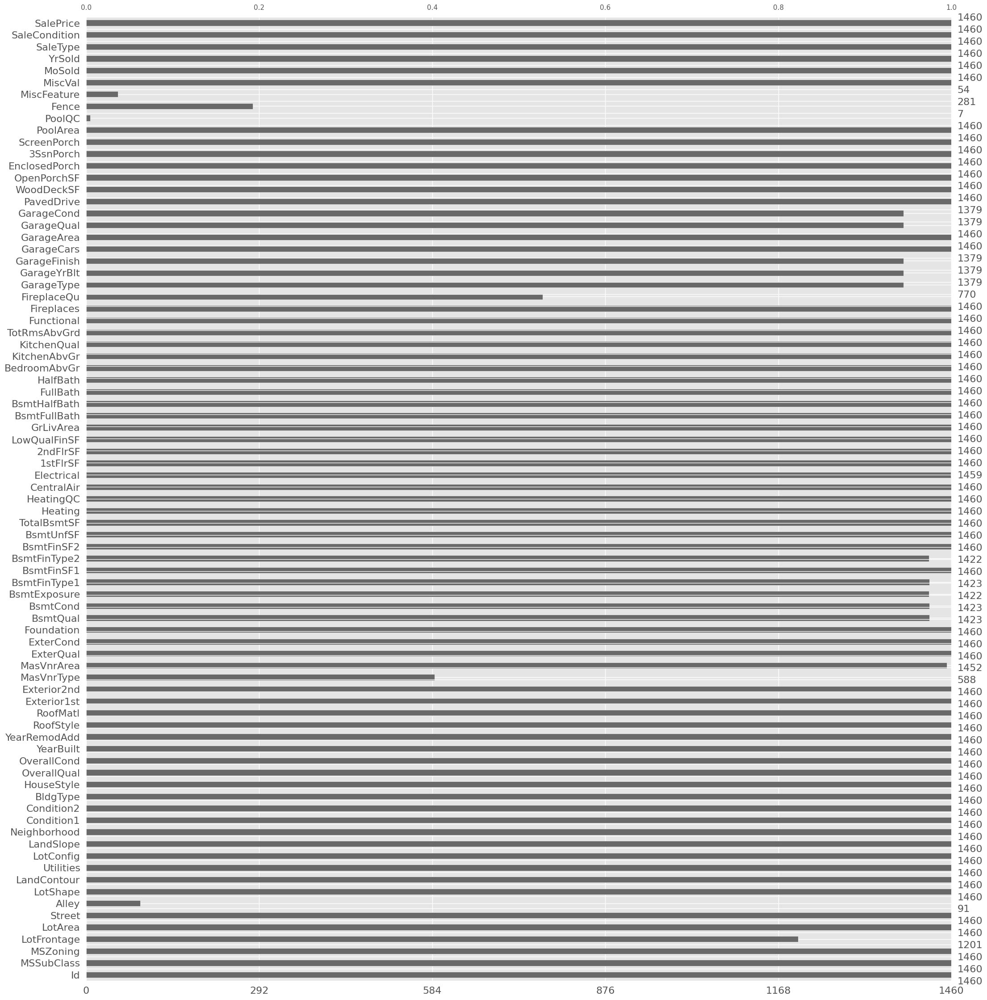

In [12]:
import missingno as msno
msno.bar(train_df)

<Axes: >

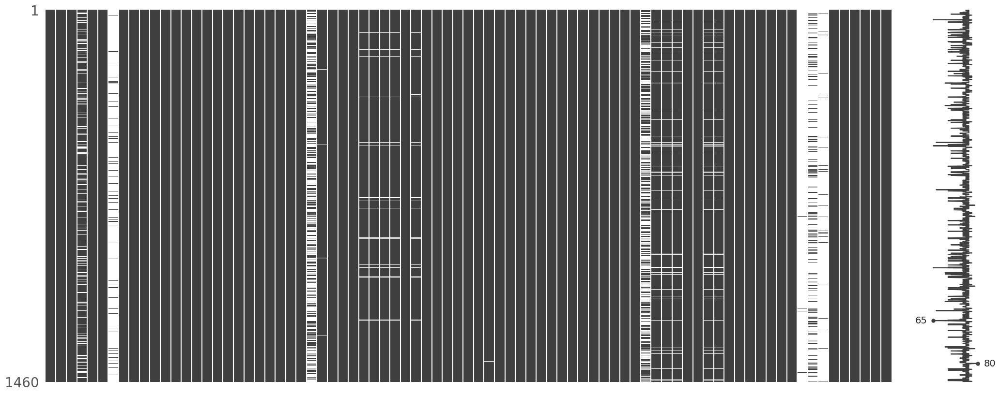

In [13]:
msno.matrix(train_df)

<Axes: >

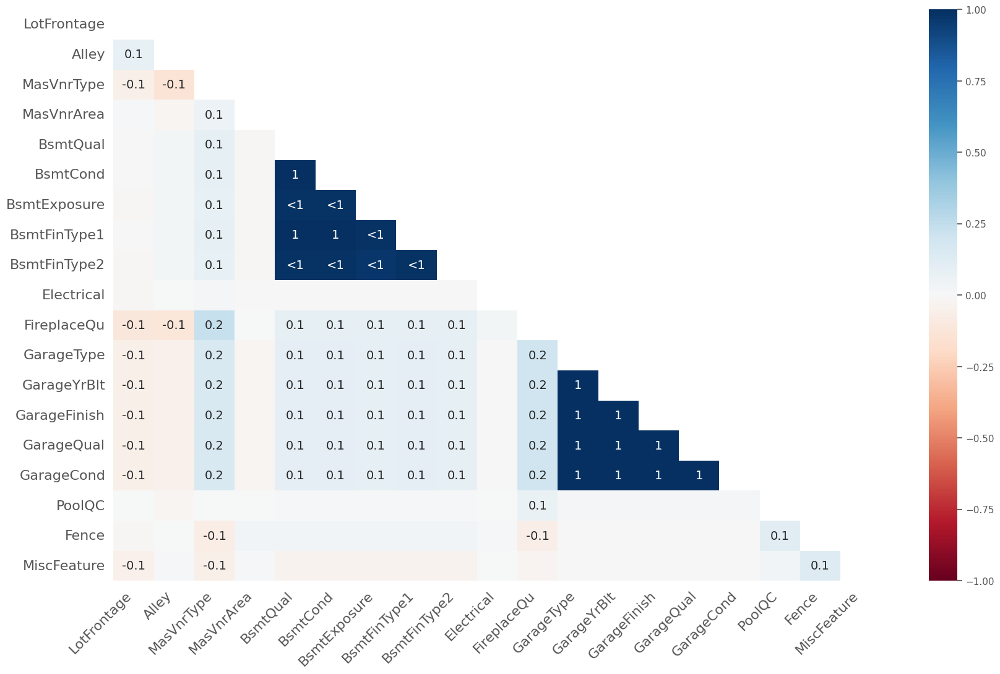

In [14]:
msno.heatmap(train_df)

array([[<Axes: title={'center': 'Id'}>,
        <Axes: title={'center': 'MSSubClass'}>,
        <Axes: title={'center': 'LotFrontage'}>,
        <Axes: title={'center': 'LotArea'}>,
        <Axes: title={'center': 'OverallQual'}>,
        <Axes: title={'center': 'OverallCond'}>],
       [<Axes: title={'center': 'YearBuilt'}>,
        <Axes: title={'center': 'YearRemodAdd'}>,
        <Axes: title={'center': 'MasVnrArea'}>,
        <Axes: title={'center': 'BsmtFinSF1'}>,
        <Axes: title={'center': 'BsmtFinSF2'}>,
        <Axes: title={'center': 'BsmtUnfSF'}>],
       [<Axes: title={'center': 'TotalBsmtSF'}>,
        <Axes: title={'center': '1stFlrSF'}>,
        <Axes: title={'center': '2ndFlrSF'}>,
        <Axes: title={'center': 'LowQualFinSF'}>,
        <Axes: title={'center': 'GrLivArea'}>,
        <Axes: title={'center': 'BsmtFullBath'}>],
       [<Axes: title={'center': 'BsmtHalfBath'}>,
        <Axes: title={'center': 'FullBath'}>,
        <Axes: title={'center': 'HalfBath'}>,

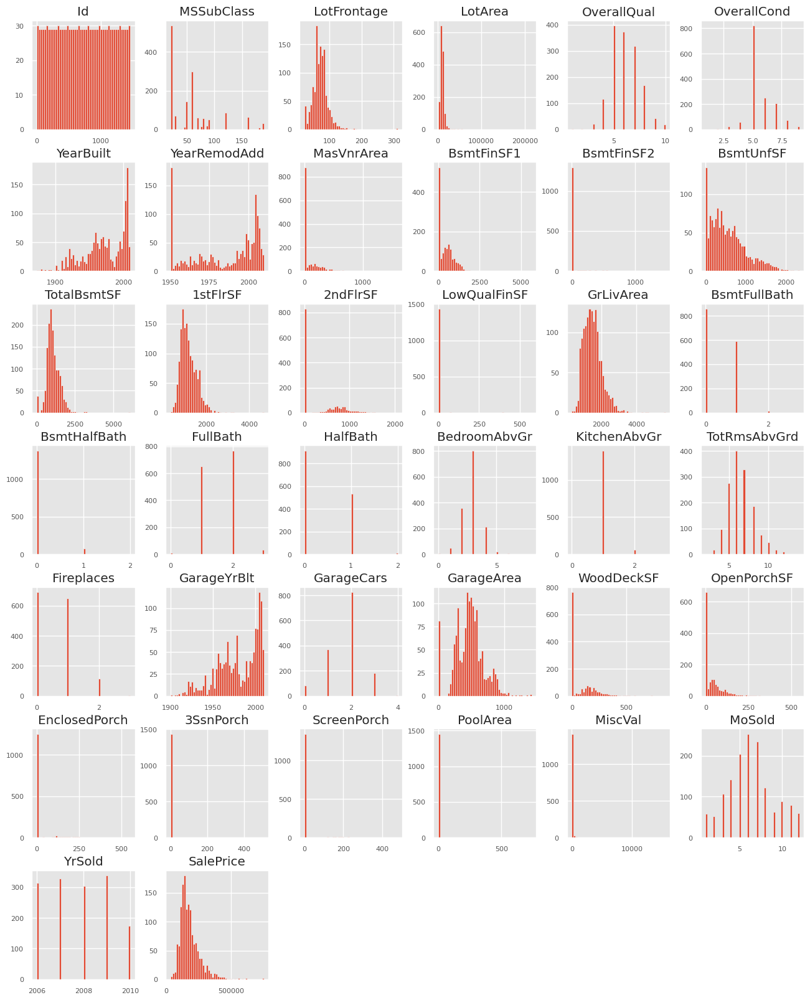

In [15]:
df_num = train_df.select_dtypes(include = ['float64', 'int64'])
df_num.head()
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

# Detailed EDA
*CAPTURE OF CATEGORICAL AND NUMERICAL VARIABLES*
This function identifies the names of categorical, numerical, and categorical but cardinal variables in the dataset.
Note: Numeric-looking categorical variables are also included in categorical variables.

In [16]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtype == 'O']  # Categorical columns
    num_but_cat = [col for col in dataframe.columns if
                   dataframe[col].nunique() < cat_th and dataframe[col].dtype != 'O']  # Numeric but categorical
    cat_but_car = [col for col in dataframe.columns if
                   dataframe[col].nunique() > car_th and dataframe[col].dtype == 'O']  # Categorical but cardinal
    cat_cols += num_but_cat  # Combine categorical columns
    cat_cols = [col for col in cat_cols if col not in cat_but_car]  # Exclude cardinal columns from categorical columns

    num_cols = [col for col in dataframe.columns if dataframe[col].dtype != 'O']  # Numerical columns
    num_cols = [col for col in num_cols if col not in num_but_cat]  # Exclude numeric-looking categories

    print(f'Observations: {dataframe.shape[0]}')
    print(f'Variables: {dataframe.shape[1]}')
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car

In [17]:
def identify_check(dataframe):
    print('-' * 80)
    print(f'Categorical : {cat_cols}')
    print('-' * 80)
    print(f'Numerical : {num_cols}')
    print('-' * 80)
    print(f'Categorical but Cardinal : {cat_but_car}')

cat_cols, num_cols, cat_but_car = grab_col_names(train_df, car_th=25)
identify_check(train_df)

Observations: 1460
Variables: 81
cat_cols: 54
num_cols: 27
cat_but_car: 0
num_but_cat: 11
--------------------------------------------------------------------------------
Categorical : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'PoolArea', 'YrSold']
--------------------------------------------------------------------------------
N

# CATEGORICAL VARIABLES ANALYSIS
*Function to summarize and optionally plot categorical variables.*

In [18]:
def to_analysis_cat(dataframe, c_cols, ratio=False, plot=False):
    print('-' * 80)
    if dataframe[c_cols].dtype == 'bool':
        dataframe[c_cols] = dataframe[c_cols].astype(int)

    if ratio:
        print(pd.DataFrame({c_cols: dataframe[c_cols].value_counts(),
                            'Ratio (%)': 100 * dataframe[c_cols].value_counts() / len(dataframe)}))
    print('-' * 80)
    if plot:
        values = dataframe[c_cols].value_counts()
        fig, axes = plt.subplots(1, len(values), figsize=(len(values) * 8, 9))

        for i, (index, value) in enumerate(values.items()):
            ax = axes[i]
            ax.pie([value, len(dataframe) - value], labels=[f'{index} ({value})', f'Others ({len(dataframe) - value})'],
                   colors=['#94bcfb', '#bad6fc', '#fffacd'], autopct='%1.1f%%', startangle=90)
            ax.set_title(f'{c_cols} - {index}')
            ax.axis('equal')

        plt.suptitle(f'RATIO by {c_cols}', y=1.05, fontsize=20)
        plt.tight_layout()
        plt.show()

--------------------------------------------------------------------------------
          MSZoning  Ratio (%)
MSZoning                     
RL            1151  78.835616
RM             218  14.931507
FV              65   4.452055
RH              16   1.095890
C (all)         10   0.684932
--------------------------------------------------------------------------------


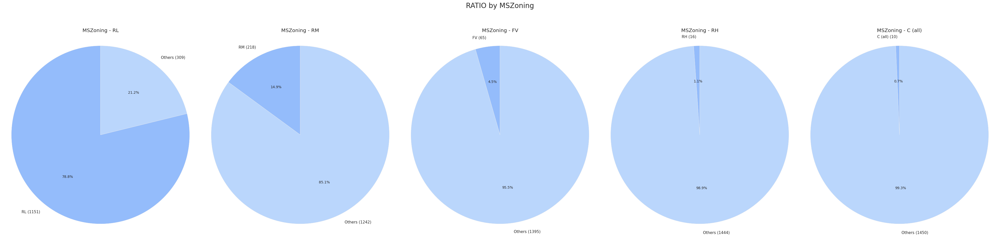

--------------------------------------------------------------------------------
        Street  Ratio (%)
Street                   
Pave      1454  99.589041
Grvl         6   0.410959
--------------------------------------------------------------------------------


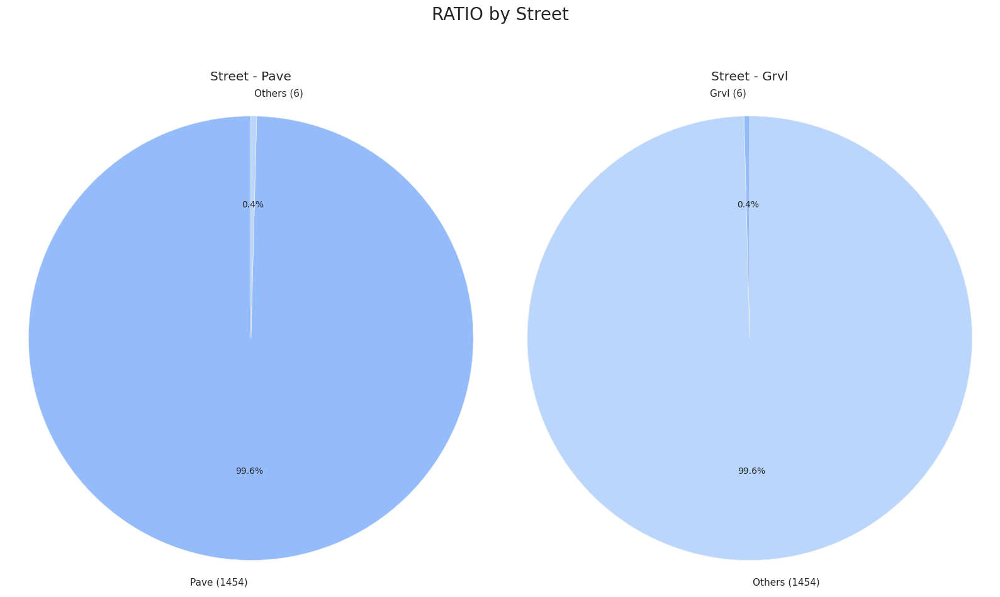

--------------------------------------------------------------------------------
       Alley  Ratio (%)
Alley                  
Grvl      50   3.424658
Pave      41   2.808219
--------------------------------------------------------------------------------


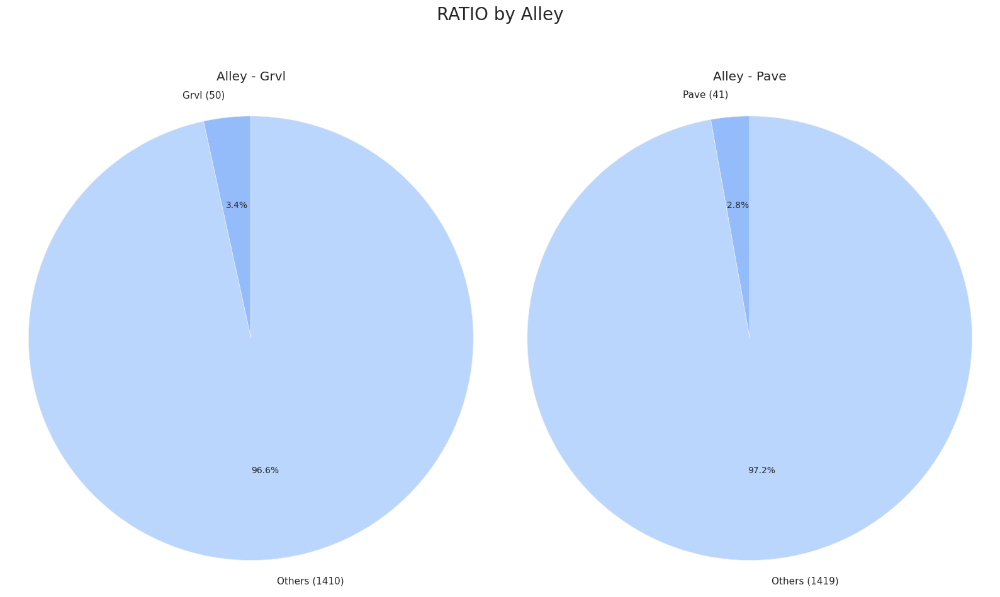

--------------------------------------------------------------------------------
          LotShape  Ratio (%)
LotShape                     
Reg            925  63.356164
IR1            484  33.150685
IR2             41   2.808219
IR3             10   0.684932
--------------------------------------------------------------------------------


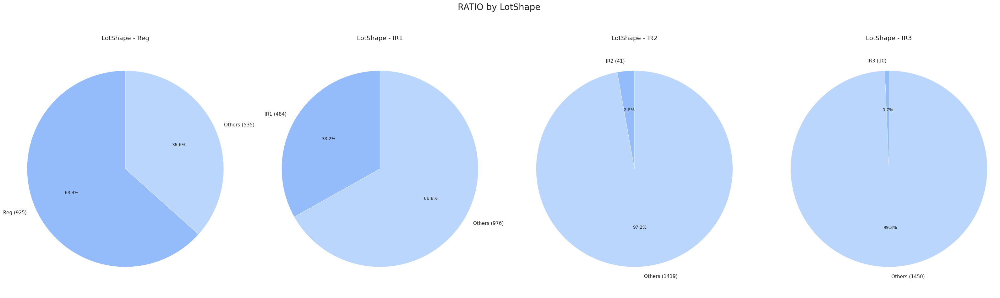

--------------------------------------------------------------------------------
             LandContour  Ratio (%)
LandContour                        
Lvl                 1311  89.794521
Bnk                   63   4.315068
HLS                   50   3.424658
Low                   36   2.465753
--------------------------------------------------------------------------------


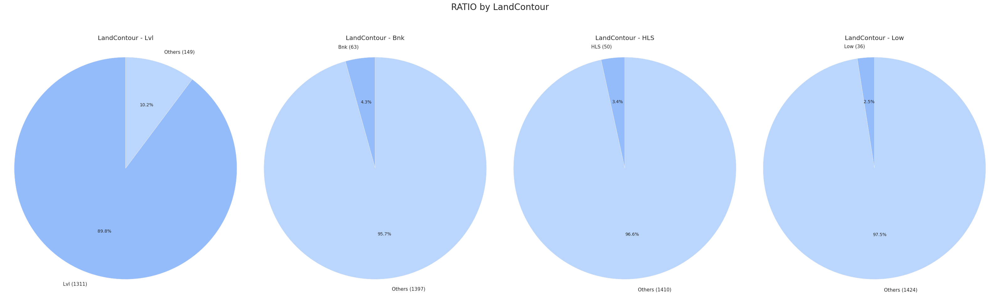

--------------------------------------------------------------------------------
           Utilities  Ratio (%)
Utilities                      
AllPub          1459  99.931507
NoSeWa             1   0.068493
--------------------------------------------------------------------------------


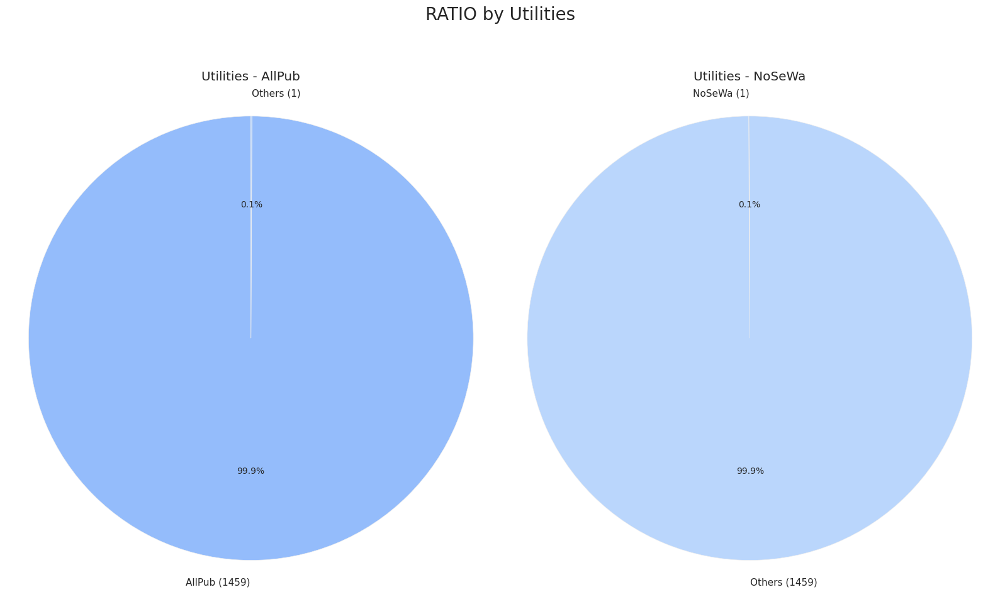

--------------------------------------------------------------------------------
           LotConfig  Ratio (%)
LotConfig                      
Inside          1052  72.054795
Corner           263  18.013699
CulDSac           94   6.438356
FR2               47   3.219178
FR3                4   0.273973
--------------------------------------------------------------------------------


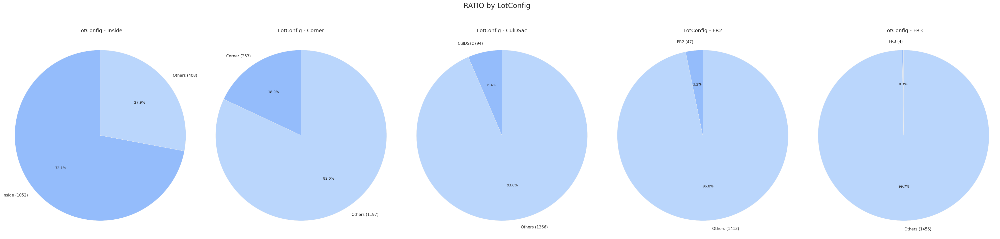

--------------------------------------------------------------------------------
           LandSlope  Ratio (%)
LandSlope                      
Gtl             1382  94.657534
Mod               65   4.452055
Sev               13   0.890411
--------------------------------------------------------------------------------


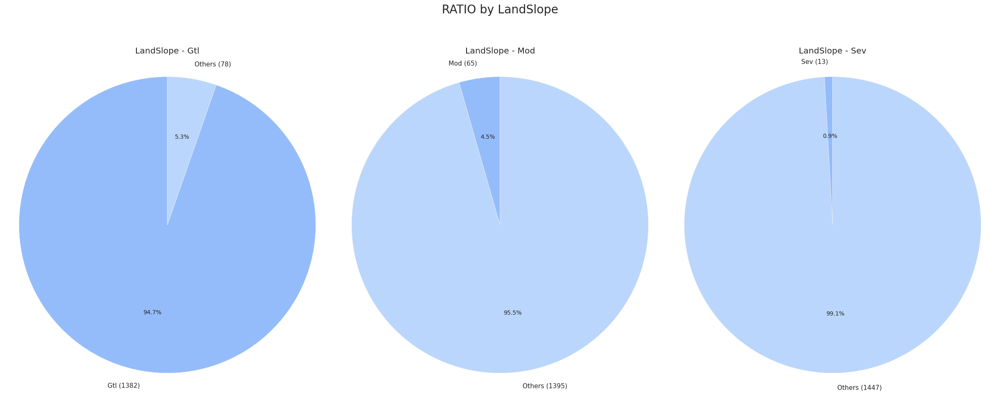

--------------------------------------------------------------------------------
              Neighborhood  Ratio (%)
Neighborhood                         
NAmes                  225  15.410959
CollgCr                150  10.273973
OldTown                113   7.739726
Edwards                100   6.849315
Somerst                 86   5.890411
Gilbert                 79   5.410959
NridgHt                 77   5.273973
Sawyer                  74   5.068493
NWAmes                  73   5.000000
SawyerW                 59   4.041096
BrkSide                 58   3.972603
Crawfor                 51   3.493151
Mitchel                 49   3.356164
NoRidge                 41   2.808219
Timber                  38   2.602740
IDOTRR                  37   2.534247
ClearCr                 28   1.917808
SWISU                   25   1.712329
StoneBr                 25   1.712329
Blmngtn                 17   1.164384
MeadowV                 17   1.164384
BrDale                  16   1.095890
Veenker

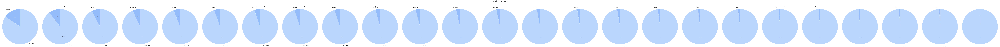

--------------------------------------------------------------------------------
            Condition1  Ratio (%)
Condition1                       
Norm              1260  86.301370
Feedr               81   5.547945
Artery              48   3.287671
RRAn                26   1.780822
PosN                19   1.301370
RRAe                11   0.753425
PosA                 8   0.547945
RRNn                 5   0.342466
RRNe                 2   0.136986
--------------------------------------------------------------------------------


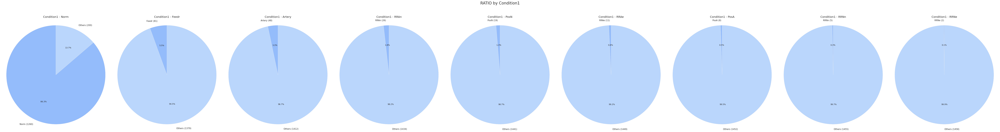

--------------------------------------------------------------------------------
            Condition2  Ratio (%)
Condition2                       
Norm              1445  98.972603
Feedr                6   0.410959
Artery               2   0.136986
RRNn                 2   0.136986
PosN                 2   0.136986
PosA                 1   0.068493
RRAn                 1   0.068493
RRAe                 1   0.068493
--------------------------------------------------------------------------------


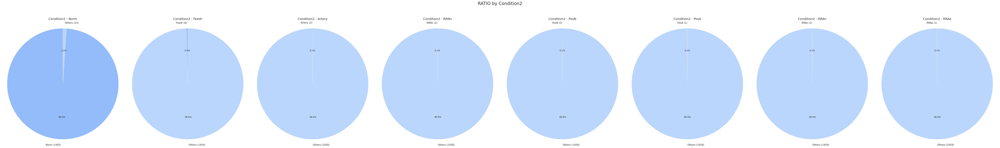

--------------------------------------------------------------------------------
          BldgType  Ratio (%)
BldgType                     
1Fam          1220  83.561644
TwnhsE         114   7.808219
Duplex          52   3.561644
Twnhs           43   2.945205
2fmCon          31   2.123288
--------------------------------------------------------------------------------


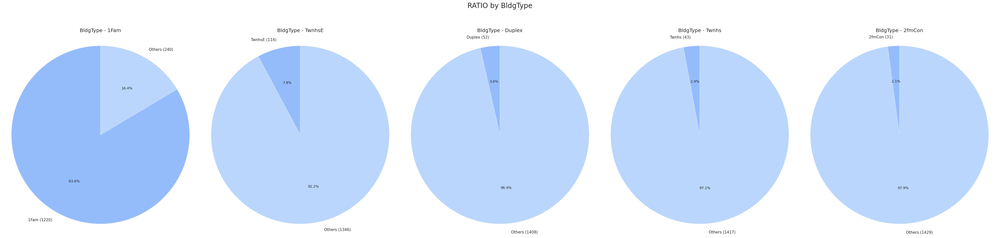

--------------------------------------------------------------------------------
            HouseStyle  Ratio (%)
HouseStyle                       
1Story             726  49.726027
2Story             445  30.479452
1.5Fin             154  10.547945
SLvl                65   4.452055
SFoyer              37   2.534247
1.5Unf              14   0.958904
2.5Unf              11   0.753425
2.5Fin               8   0.547945
--------------------------------------------------------------------------------


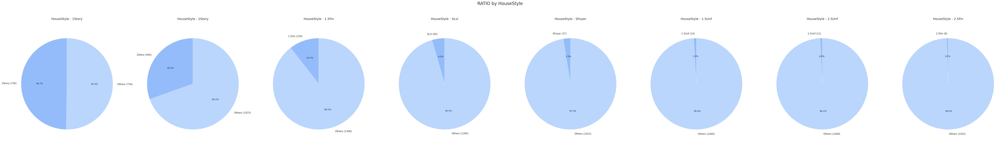

--------------------------------------------------------------------------------
           RoofStyle  Ratio (%)
RoofStyle                      
Gable           1141  78.150685
Hip              286  19.589041
Flat              13   0.890411
Gambrel           11   0.753425
Mansard            7   0.479452
Shed               2   0.136986
--------------------------------------------------------------------------------


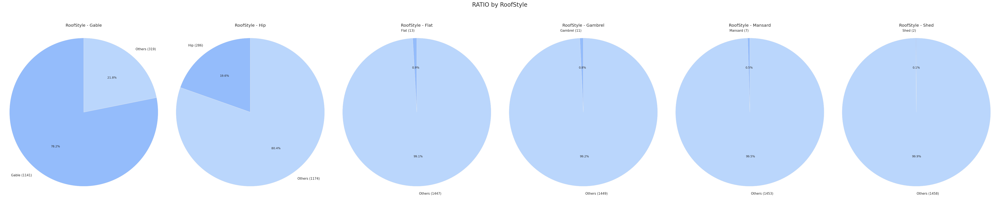

--------------------------------------------------------------------------------
          RoofMatl  Ratio (%)
RoofMatl                     
CompShg       1434  98.219178
Tar&Grv         11   0.753425
WdShngl          6   0.410959
WdShake          5   0.342466
Metal            1   0.068493
Membran          1   0.068493
Roll             1   0.068493
ClyTile          1   0.068493
--------------------------------------------------------------------------------


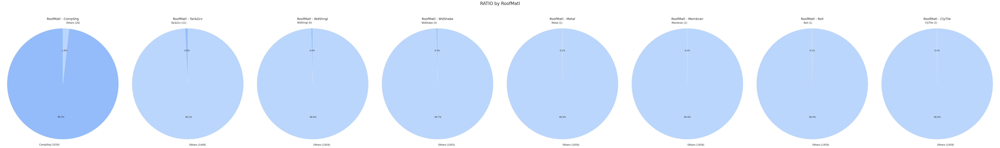

--------------------------------------------------------------------------------
             Exterior1st  Ratio (%)
Exterior1st                        
VinylSd              515  35.273973
HdBoard              222  15.205479
MetalSd              220  15.068493
Wd Sdng              206  14.109589
Plywood              108   7.397260
CemntBd               61   4.178082
BrkFace               50   3.424658
WdShing               26   1.780822
Stucco                25   1.712329
AsbShng               20   1.369863
BrkComm                2   0.136986
Stone                  2   0.136986
AsphShn                1   0.068493
ImStucc                1   0.068493
CBlock                 1   0.068493
--------------------------------------------------------------------------------


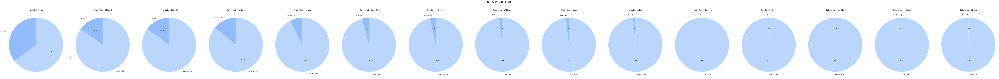

--------------------------------------------------------------------------------
             Exterior2nd  Ratio (%)
Exterior2nd                        
VinylSd              504  34.520548
MetalSd              214  14.657534
HdBoard              207  14.178082
Wd Sdng              197  13.493151
Plywood              142   9.726027
CmentBd               60   4.109589
Wd Shng               38   2.602740
Stucco                26   1.780822
BrkFace               25   1.712329
AsbShng               20   1.369863
ImStucc               10   0.684932
Brk Cmn                7   0.479452
Stone                  5   0.342466
AsphShn                3   0.205479
Other                  1   0.068493
CBlock                 1   0.068493
--------------------------------------------------------------------------------


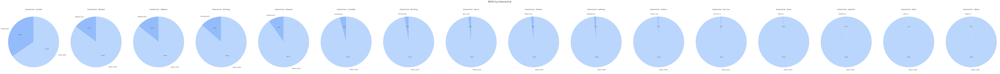

--------------------------------------------------------------------------------
            MasVnrType  Ratio (%)
MasVnrType                       
BrkFace            445  30.479452
Stone              128   8.767123
BrkCmn              15   1.027397
--------------------------------------------------------------------------------


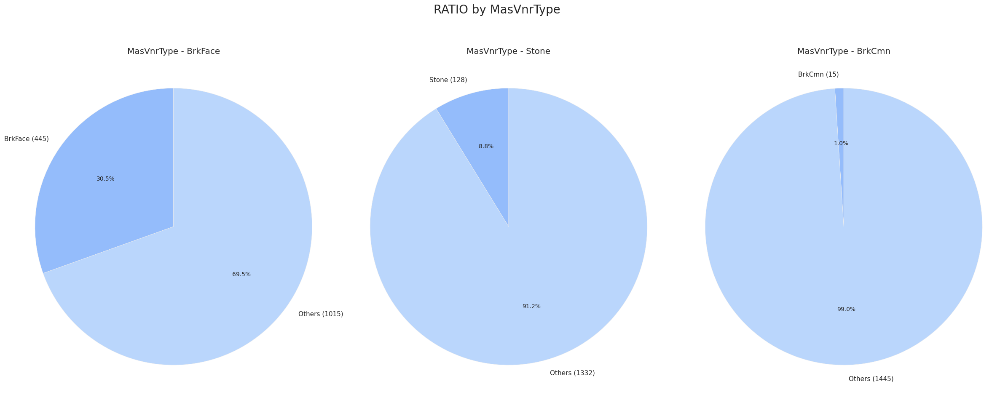

--------------------------------------------------------------------------------
           ExterQual  Ratio (%)
ExterQual                      
TA               906  62.054795
Gd               488  33.424658
Ex                52   3.561644
Fa                14   0.958904
--------------------------------------------------------------------------------


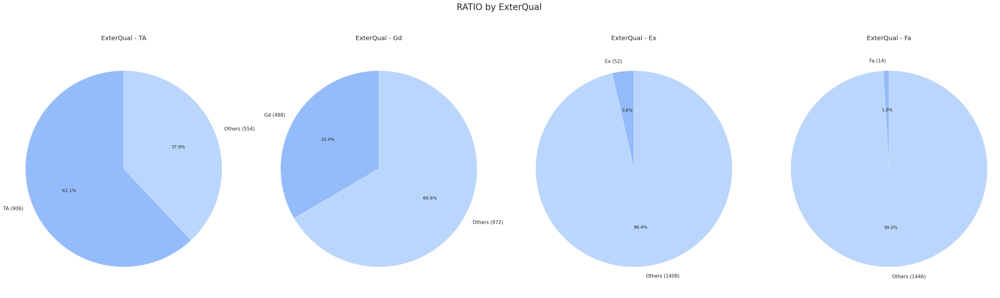

--------------------------------------------------------------------------------
           ExterCond  Ratio (%)
ExterCond                      
TA              1282  87.808219
Gd               146  10.000000
Fa                28   1.917808
Ex                 3   0.205479
Po                 1   0.068493
--------------------------------------------------------------------------------


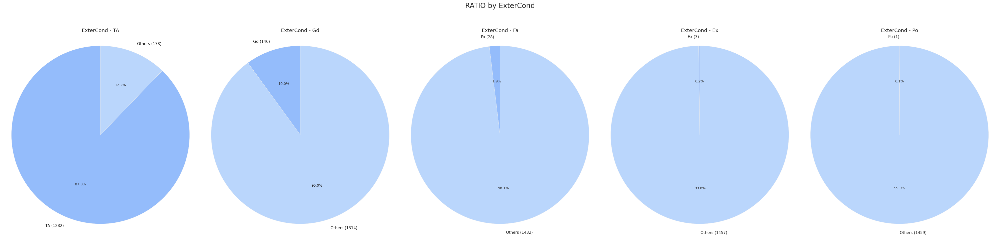

--------------------------------------------------------------------------------
            Foundation  Ratio (%)
Foundation                       
PConc              647  44.315068
CBlock             634  43.424658
BrkTil             146  10.000000
Slab                24   1.643836
Stone                6   0.410959
Wood                 3   0.205479
--------------------------------------------------------------------------------


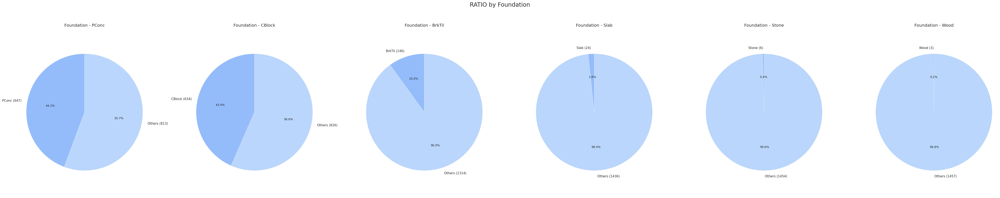

--------------------------------------------------------------------------------
          BsmtQual  Ratio (%)
BsmtQual                     
TA             649  44.452055
Gd             618  42.328767
Ex             121   8.287671
Fa              35   2.397260
--------------------------------------------------------------------------------


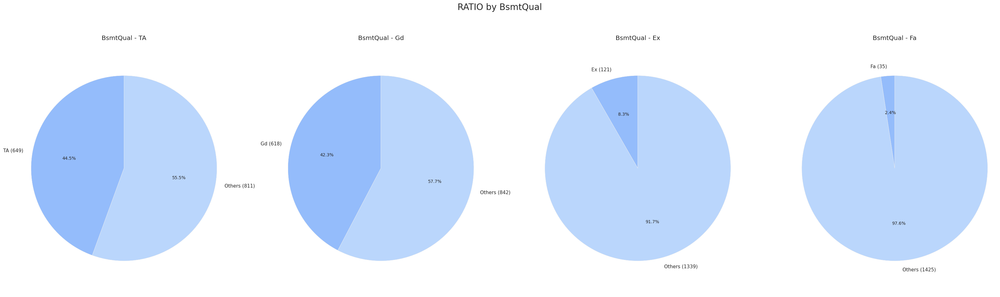

--------------------------------------------------------------------------------
          BsmtCond  Ratio (%)
BsmtCond                     
TA            1311  89.794521
Gd              65   4.452055
Fa              45   3.082192
Po               2   0.136986
--------------------------------------------------------------------------------


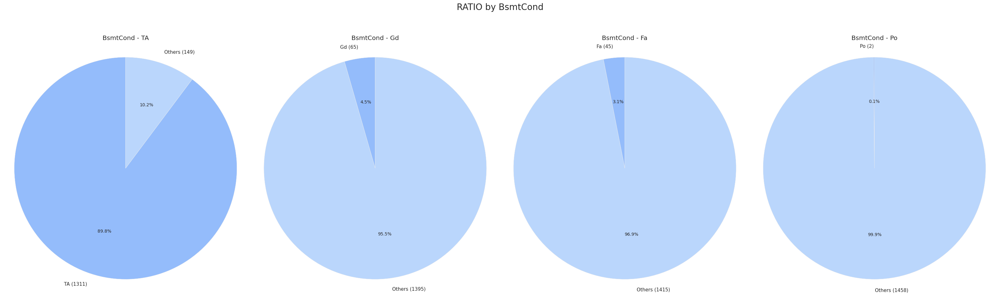

--------------------------------------------------------------------------------
              BsmtExposure  Ratio (%)
BsmtExposure                         
No                     953  65.273973
Av                     221  15.136986
Gd                     134   9.178082
Mn                     114   7.808219
--------------------------------------------------------------------------------


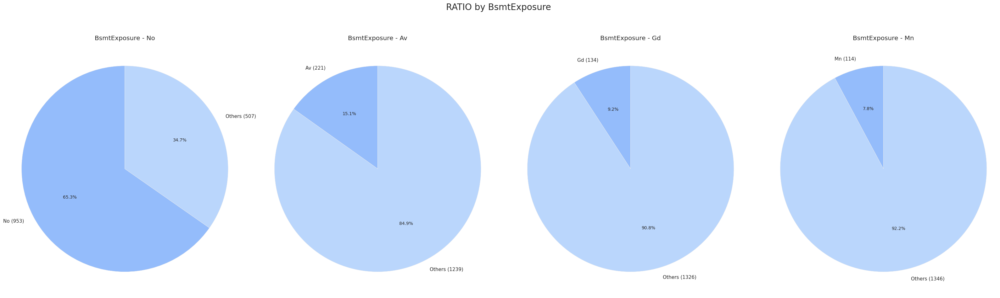

--------------------------------------------------------------------------------
              BsmtFinType1  Ratio (%)
BsmtFinType1                         
Unf                    430  29.452055
GLQ                    418  28.630137
ALQ                    220  15.068493
BLQ                    148  10.136986
Rec                    133   9.109589
LwQ                     74   5.068493
--------------------------------------------------------------------------------


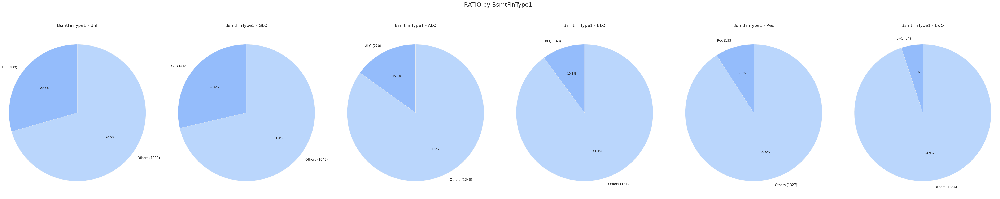

--------------------------------------------------------------------------------
              BsmtFinType2  Ratio (%)
BsmtFinType2                         
Unf                   1256  86.027397
Rec                     54   3.698630
LwQ                     46   3.150685
BLQ                     33   2.260274
ALQ                     19   1.301370
GLQ                     14   0.958904
--------------------------------------------------------------------------------


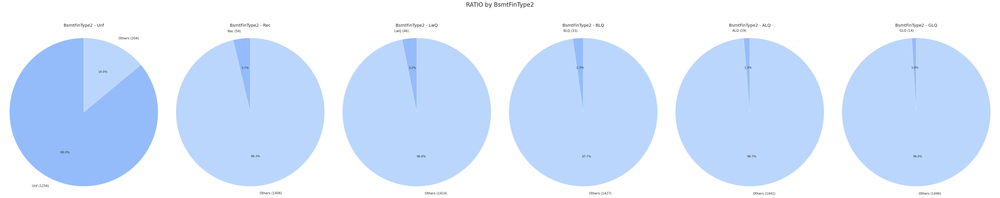

--------------------------------------------------------------------------------
         Heating  Ratio (%)
Heating                    
GasA        1428  97.808219
GasW          18   1.232877
Grav           7   0.479452
Wall           4   0.273973
OthW           2   0.136986
Floor          1   0.068493
--------------------------------------------------------------------------------


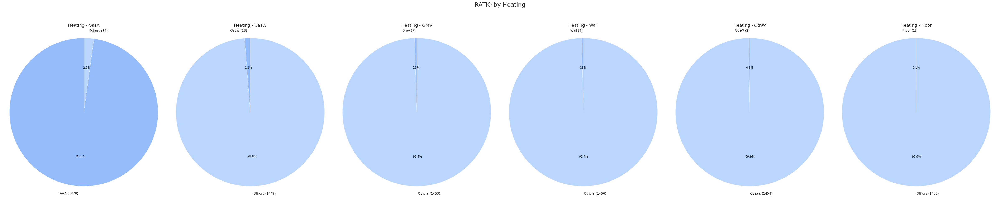

--------------------------------------------------------------------------------
           HeatingQC  Ratio (%)
HeatingQC                      
Ex               741  50.753425
TA               428  29.315068
Gd               241  16.506849
Fa                49   3.356164
Po                 1   0.068493
--------------------------------------------------------------------------------


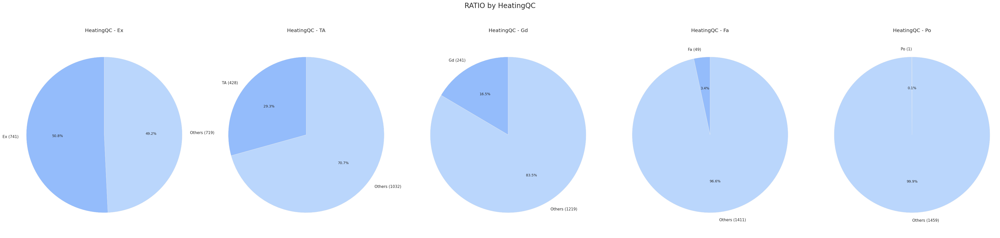

--------------------------------------------------------------------------------
            CentralAir  Ratio (%)
CentralAir                       
Y                 1365  93.493151
N                   95   6.506849
--------------------------------------------------------------------------------


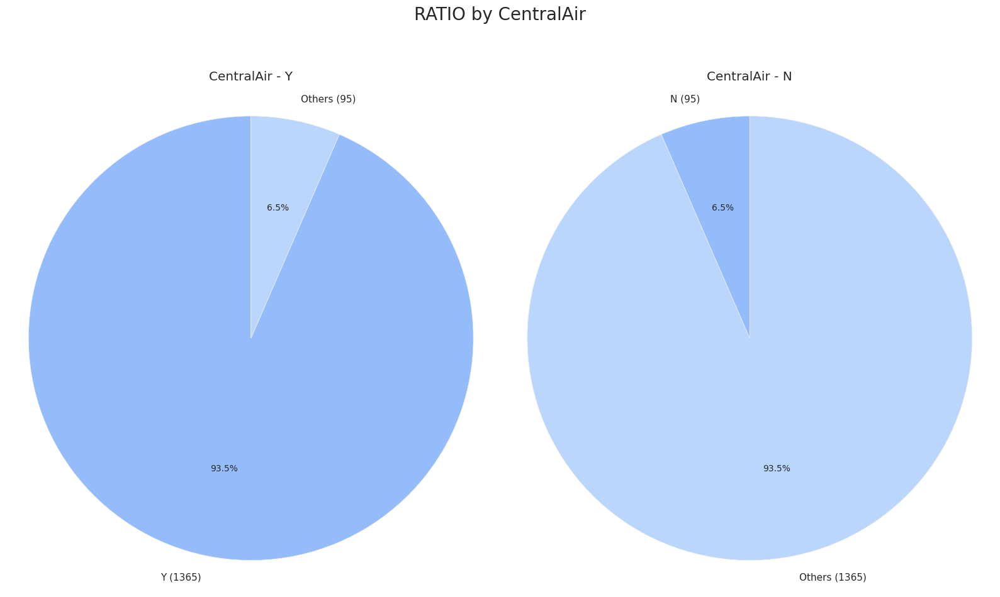

--------------------------------------------------------------------------------
            Electrical  Ratio (%)
Electrical                       
SBrkr             1334  91.369863
FuseA               94   6.438356
FuseF               27   1.849315
FuseP                3   0.205479
Mix                  1   0.068493
--------------------------------------------------------------------------------


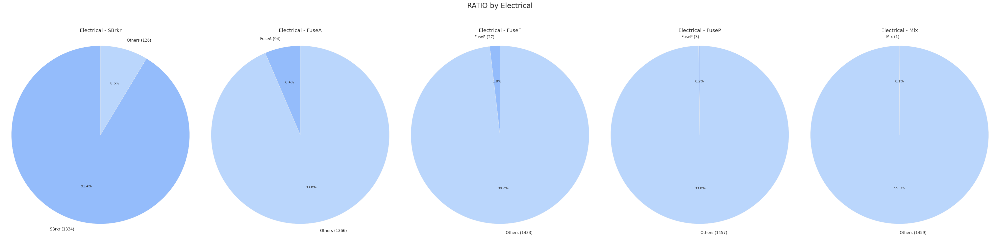

--------------------------------------------------------------------------------
             KitchenQual  Ratio (%)
KitchenQual                        
TA                   735  50.342466
Gd                   586  40.136986
Ex                   100   6.849315
Fa                    39   2.671233
--------------------------------------------------------------------------------


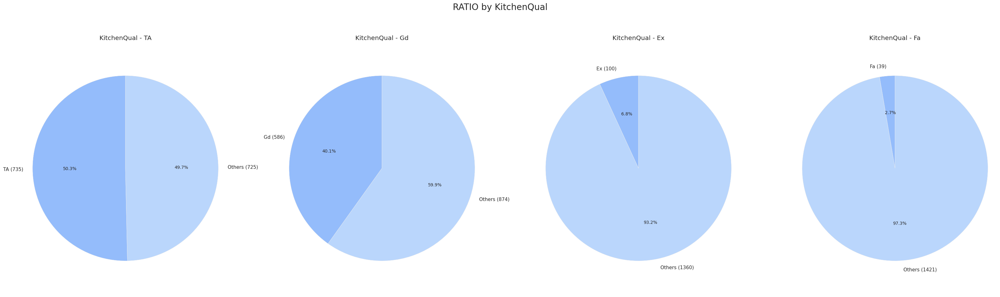

--------------------------------------------------------------------------------
            Functional  Ratio (%)
Functional                       
Typ               1360  93.150685
Min2                34   2.328767
Min1                31   2.123288
Mod                 15   1.027397
Maj1                14   0.958904
Maj2                 5   0.342466
Sev                  1   0.068493
--------------------------------------------------------------------------------


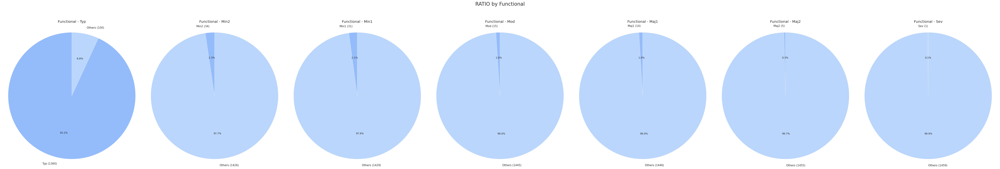

--------------------------------------------------------------------------------
             FireplaceQu  Ratio (%)
FireplaceQu                        
Gd                   380  26.027397
TA                   313  21.438356
Fa                    33   2.260274
Ex                    24   1.643836
Po                    20   1.369863
--------------------------------------------------------------------------------


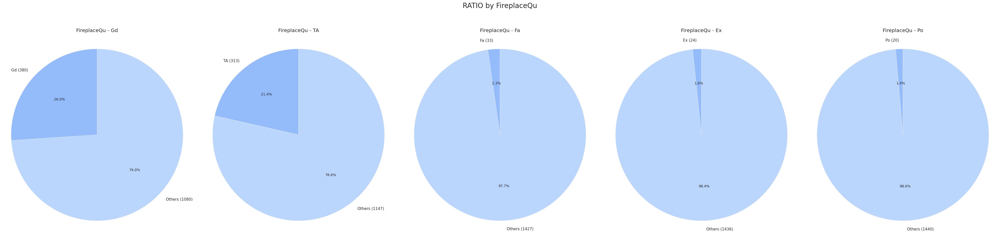

--------------------------------------------------------------------------------
            GarageType  Ratio (%)
GarageType                       
Attchd             870  59.589041
Detchd             387  26.506849
BuiltIn             88   6.027397
Basment             19   1.301370
CarPort              9   0.616438
2Types               6   0.410959
--------------------------------------------------------------------------------


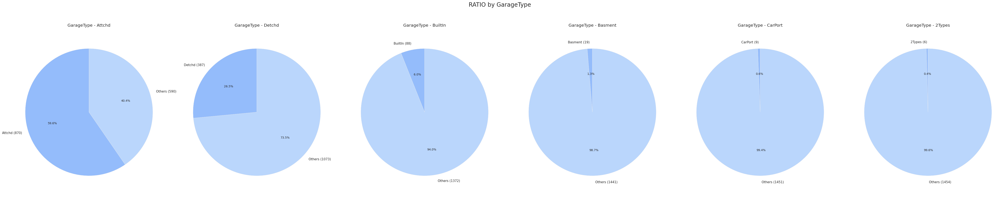

--------------------------------------------------------------------------------
              GarageFinish  Ratio (%)
GarageFinish                         
Unf                    605  41.438356
RFn                    422  28.904110
Fin                    352  24.109589
--------------------------------------------------------------------------------


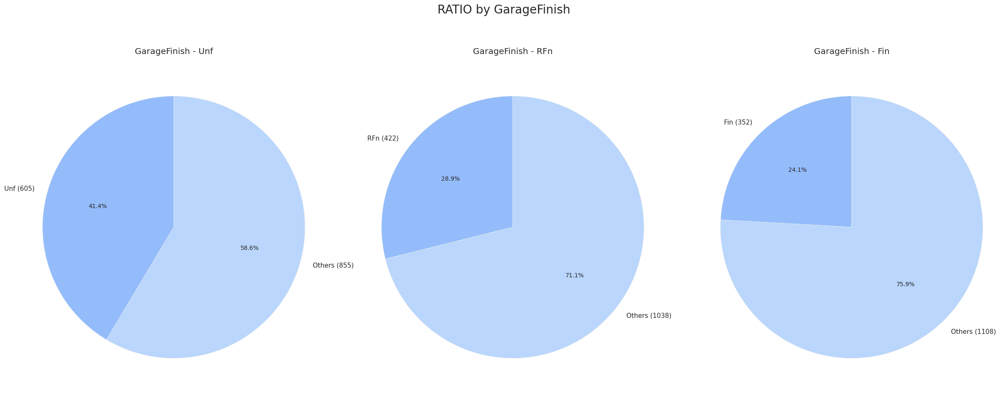

--------------------------------------------------------------------------------
            GarageQual  Ratio (%)
GarageQual                       
TA                1311  89.794521
Fa                  48   3.287671
Gd                  14   0.958904
Ex                   3   0.205479
Po                   3   0.205479
--------------------------------------------------------------------------------


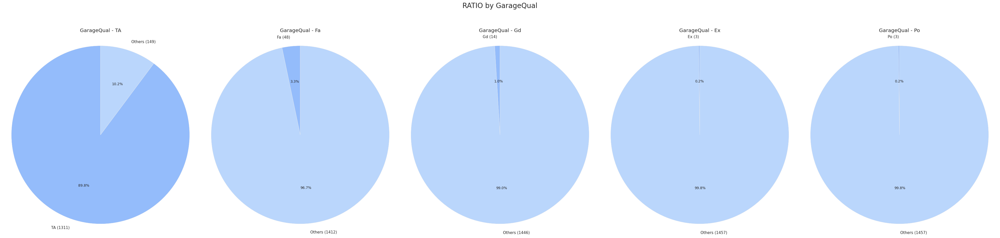

--------------------------------------------------------------------------------
            GarageCond  Ratio (%)
GarageCond                       
TA                1326  90.821918
Fa                  35   2.397260
Gd                   9   0.616438
Po                   7   0.479452
Ex                   2   0.136986
--------------------------------------------------------------------------------


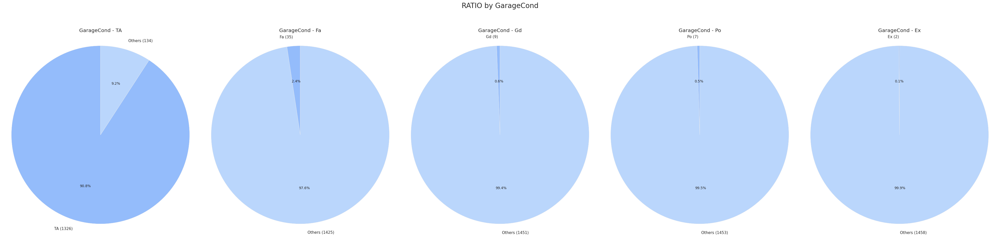

--------------------------------------------------------------------------------
            PavedDrive  Ratio (%)
PavedDrive                       
Y                 1340  91.780822
N                   90   6.164384
P                   30   2.054795
--------------------------------------------------------------------------------


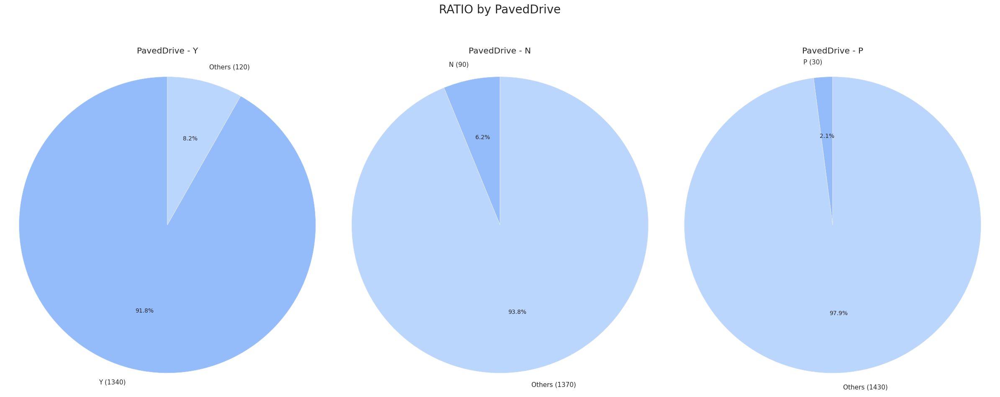

--------------------------------------------------------------------------------
        PoolQC  Ratio (%)
PoolQC                   
Gd           3   0.205479
Ex           2   0.136986
Fa           2   0.136986
--------------------------------------------------------------------------------


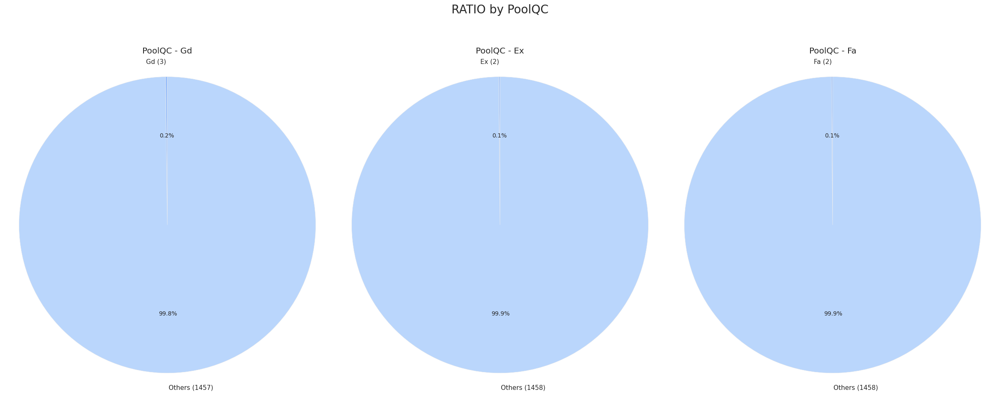

--------------------------------------------------------------------------------
       Fence  Ratio (%)
Fence                  
MnPrv    157  10.753425
GdPrv     59   4.041096
GdWo      54   3.698630
MnWw      11   0.753425
--------------------------------------------------------------------------------


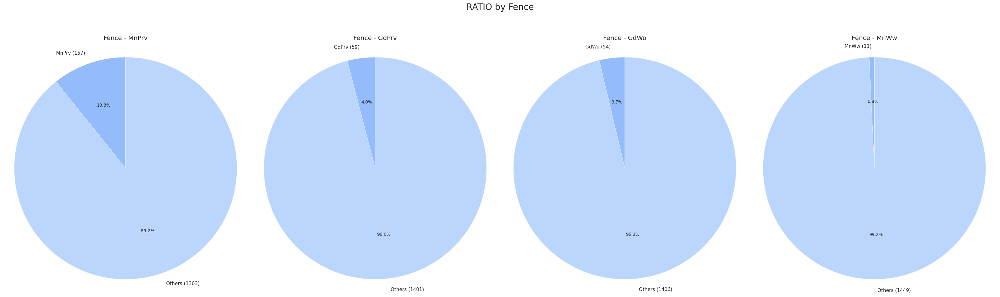

--------------------------------------------------------------------------------
             MiscFeature  Ratio (%)
MiscFeature                        
Shed                  49   3.356164
Gar2                   2   0.136986
Othr                   2   0.136986
TenC                   1   0.068493
--------------------------------------------------------------------------------


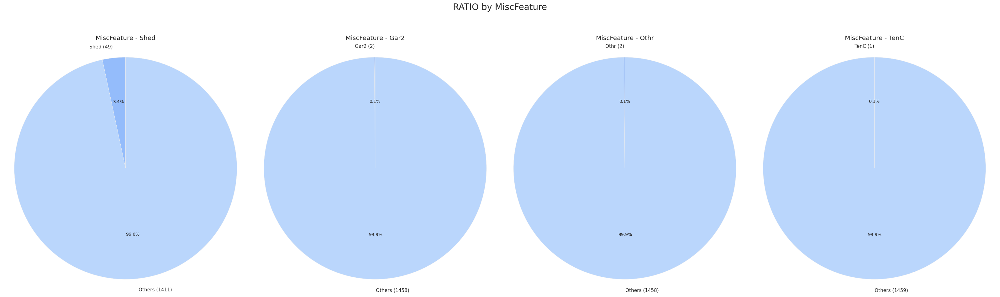

--------------------------------------------------------------------------------
          SaleType  Ratio (%)
SaleType                     
WD            1267  86.780822
New            122   8.356164
COD             43   2.945205
ConLD            9   0.616438
ConLI            5   0.342466
ConLw            5   0.342466
CWD              4   0.273973
Oth              3   0.205479
Con              2   0.136986
--------------------------------------------------------------------------------


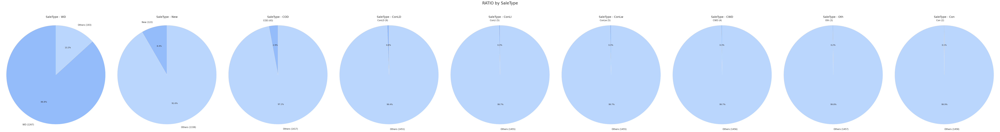

--------------------------------------------------------------------------------
               SaleCondition  Ratio (%)
SaleCondition                          
Normal                  1198  82.054795
Partial                  125   8.561644
Abnorml                  101   6.917808
Family                    20   1.369863
Alloca                    12   0.821918
AdjLand                    4   0.273973
--------------------------------------------------------------------------------


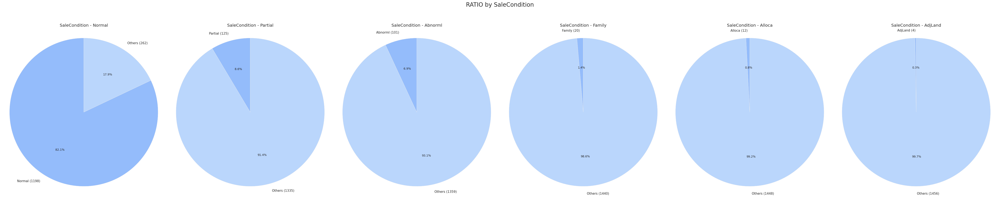

--------------------------------------------------------------------------------
             OverallCond  Ratio (%)
OverallCond                        
5                    821  56.232877
6                    252  17.260274
7                    205  14.041096
8                     72   4.931507
4                     57   3.904110
3                     25   1.712329
9                     22   1.506849
2                      5   0.342466
1                      1   0.068493
--------------------------------------------------------------------------------


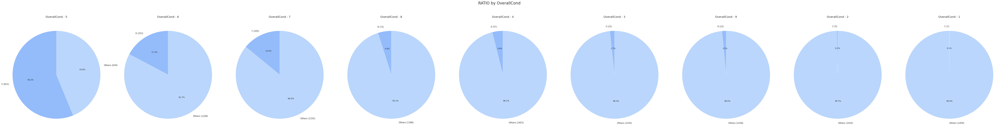

--------------------------------------------------------------------------------
              BsmtFullBath  Ratio (%)
BsmtFullBath                         
0                      856  58.630137
1                      588  40.273973
2                       15   1.027397
3                        1   0.068493
--------------------------------------------------------------------------------


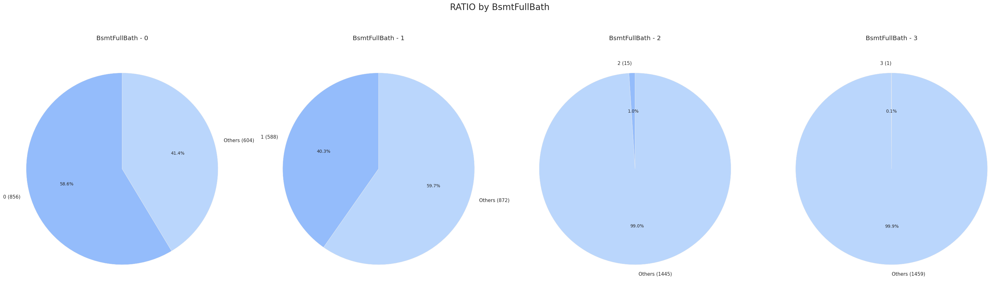

--------------------------------------------------------------------------------
              BsmtHalfBath  Ratio (%)
BsmtHalfBath                         
0                     1378  94.383562
1                       80   5.479452
2                        2   0.136986
--------------------------------------------------------------------------------


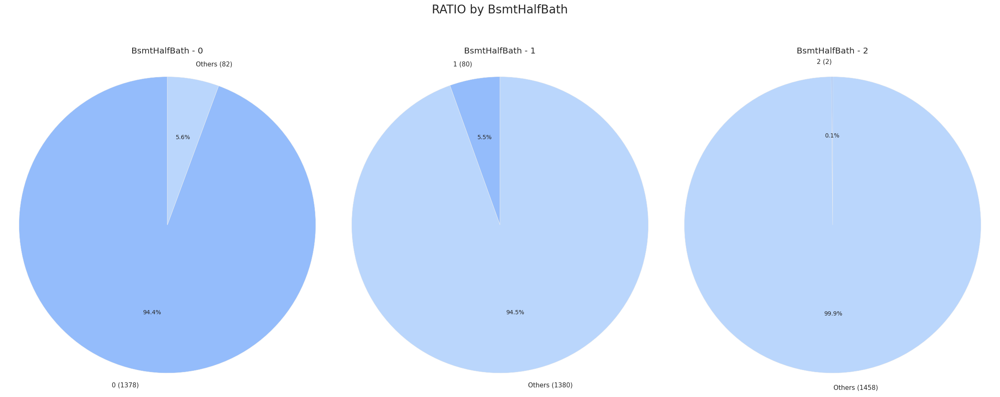

--------------------------------------------------------------------------------
          FullBath  Ratio (%)
FullBath                     
2              768  52.602740
1              650  44.520548
3               33   2.260274
0                9   0.616438
--------------------------------------------------------------------------------


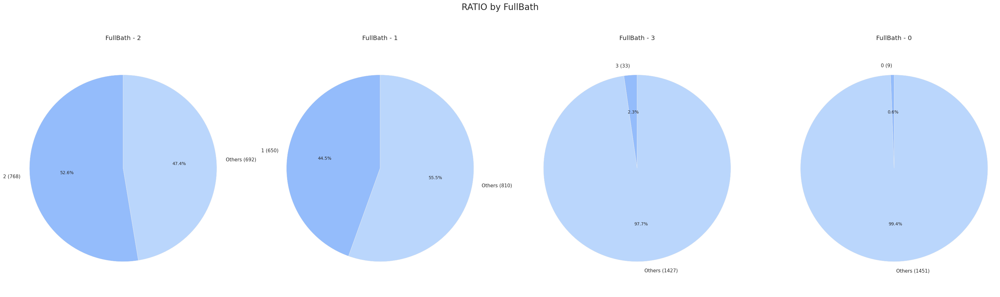

--------------------------------------------------------------------------------
          HalfBath  Ratio (%)
HalfBath                     
0              913  62.534247
1              535  36.643836
2               12   0.821918
--------------------------------------------------------------------------------


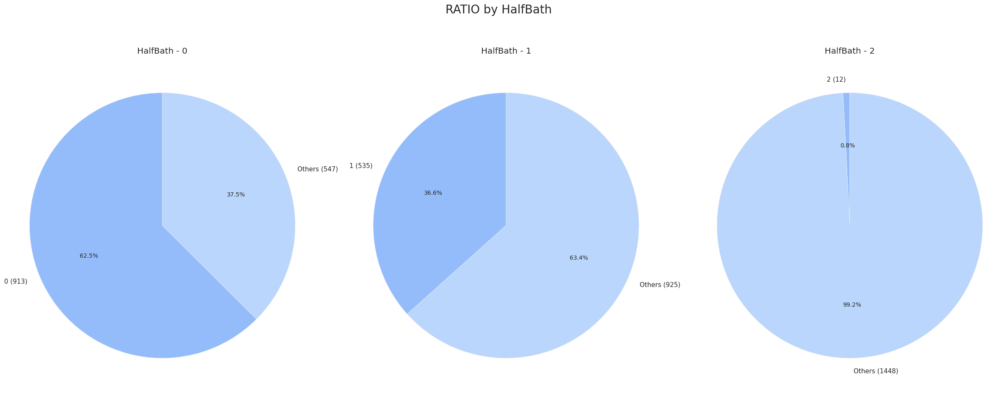

--------------------------------------------------------------------------------
              BedroomAbvGr  Ratio (%)
BedroomAbvGr                         
3                      804  55.068493
2                      358  24.520548
4                      213  14.589041
1                       50   3.424658
5                       21   1.438356
6                        7   0.479452
0                        6   0.410959
8                        1   0.068493
--------------------------------------------------------------------------------


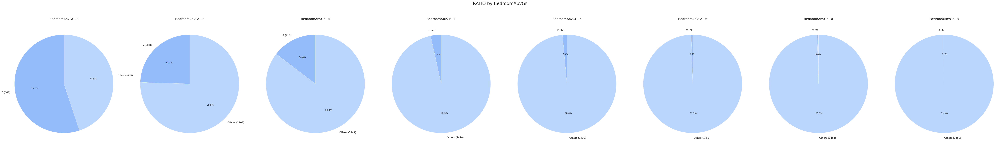

--------------------------------------------------------------------------------
              KitchenAbvGr  Ratio (%)
KitchenAbvGr                         
1                     1392  95.342466
2                       65   4.452055
3                        2   0.136986
0                        1   0.068493
--------------------------------------------------------------------------------


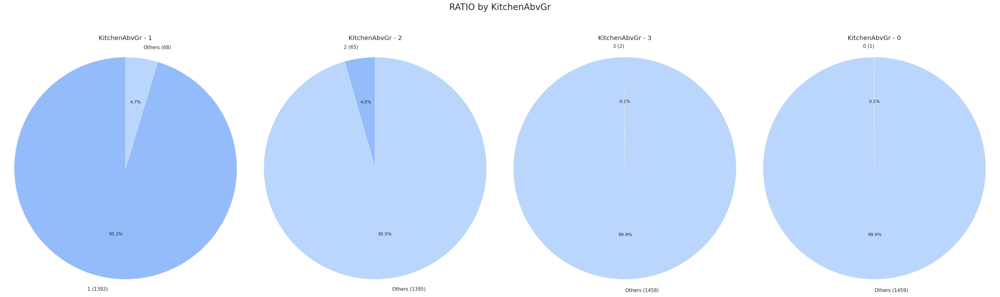

--------------------------------------------------------------------------------
            Fireplaces  Ratio (%)
Fireplaces                       
0                  690  47.260274
1                  650  44.520548
2                  115   7.876712
3                    5   0.342466
--------------------------------------------------------------------------------


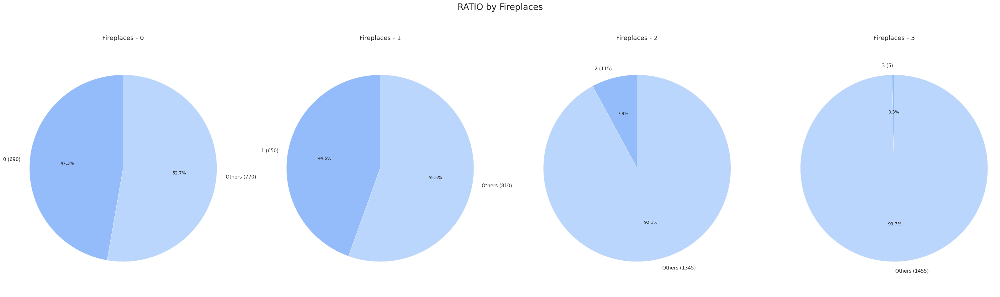

--------------------------------------------------------------------------------
            GarageCars  Ratio (%)
GarageCars                       
2                  824  56.438356
1                  369  25.273973
3                  181  12.397260
0                   81   5.547945
4                    5   0.342466
--------------------------------------------------------------------------------


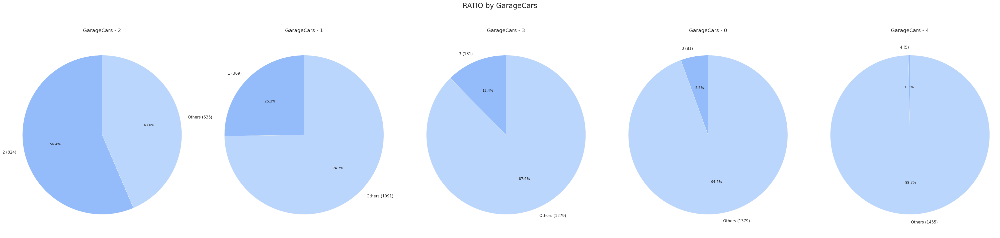

--------------------------------------------------------------------------------
          PoolArea  Ratio (%)
PoolArea                     
0             1453  99.520548
512              1   0.068493
648              1   0.068493
576              1   0.068493
555              1   0.068493
480              1   0.068493
519              1   0.068493
738              1   0.068493
--------------------------------------------------------------------------------


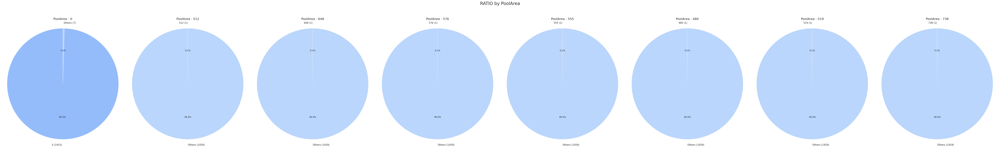

--------------------------------------------------------------------------------
        YrSold  Ratio (%)
YrSold                   
2009       338  23.150685
2007       329  22.534247
2006       314  21.506849
2008       304  20.821918
2010       175  11.986301
--------------------------------------------------------------------------------


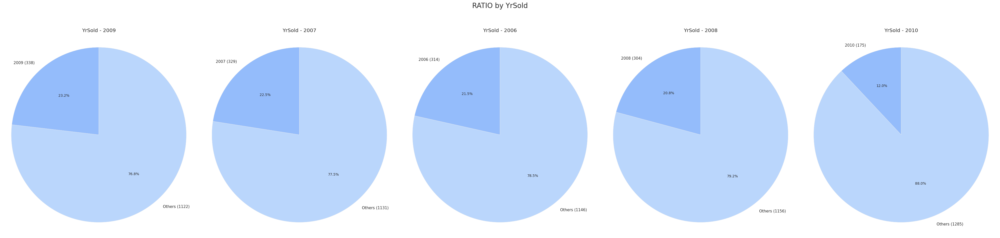

In [19]:
for col in cat_cols:
    to_analysis_cat(train_df, col, ratio=True, plot=True)

# NUMERICAL VARIABLES ANALYSIS

In [20]:
def to_analysis_num(dataframe, n_cols, bins=20, T=False, plot=False):
    if T:
        quantiles = [0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
        print(dataframe[n_cols].describe(percentiles=quantiles).T)

    if plot:
        num_cols = len(n_cols)
        fig, axs = plt.subplots(nrows=1, ncols=num_cols, figsize=(6 * num_cols, 6))

        if num_cols == 1:
            axs = [axs]  # Tek bir grafik için axs'i listeye dönüştür

        # Her bir sütun için grafik çizdir
        for i, col in enumerate(n_cols):
            # Histogram
            n, bins_hist, patches = axs[i].hist(dataframe[col],
                                                bins=bins, density=True,
                                                label=col, edgecolor='black',
                                                alpha=0.9, color='#bad6fc')
            #Density
            density = 1/(dataframe[col].std() * (2 * np.pi)**0.5) * \
                      np.exp(-(bins_hist - dataframe[col].mean())**2 / (2 * dataframe[col].std()**2))
            axs[i].plot(bins_hist, density, color='#b1cffc', linewidth=1, label='Density')

            axs[i].set_title(f'Distribution of {col} Variable')
            axs[i].set_xlabel(col)
            axs[i].set_ylabel('Frequency / Density')
            axs[i].legend(loc='upper right')
            axs[i].grid(axis='y')

        plt.tight_layout()
        plt.show()

                count          mean          std     min       5%      25%  \
Id             1460.0    730.500000   421.610009     1.0    73.95   365.75   
MSSubClass     1460.0     56.897260    42.300571    20.0    20.00    20.00   
LotFrontage    1201.0     70.049958    24.284752    21.0    34.00    59.00   
LotArea        1460.0  10516.828082  9981.264932  1300.0  3311.70  7553.50   
OverallQual    1460.0      6.099315     1.382997     1.0     4.00     5.00   
YearBuilt      1460.0   1971.267808    30.202904  1872.0  1916.00  1954.00   
YearRemodAdd   1460.0   1984.865753    20.645407  1950.0  1950.00  1967.00   
MasVnrArea     1452.0    103.685262   181.066207     0.0     0.00     0.00   
BsmtFinSF1     1460.0    443.639726   456.098091     0.0     0.00     0.00   
BsmtFinSF2     1460.0     46.549315   161.319273     0.0     0.00     0.00   
BsmtUnfSF      1460.0    567.240411   441.866955     0.0     0.00   223.00   
TotalBsmtSF    1460.0   1057.429452   438.705324     0.0   519.3

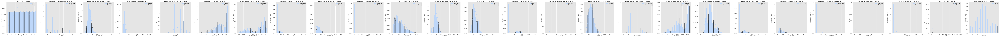

In [21]:
num_cols = [col for col in num_cols if 'SalePrice' not in col]
to_analysis_num(train_df, num_cols, bins=50, T=True, plot=True)

# TARGET VARIABLES ANALYSIS
Analysis of Categorical Variables by Target
Function to compare the means, ratio, count of categorical variables by the target variable.

In [22]:
def cat_by_target(dataframe, target, c_cols, plot=False):

    cat_tar = pd.DataFrame({'Target Mean': dataframe.groupby(c_cols)[target].mean(),
                            'Count': dataframe[c_cols].value_counts(),
                            'Ratio (%)': 100 * dataframe[c_cols].value_counts() / len(dataframe)})

    print('-' * 80)
    print(c_cols)
    print('-' * 80)
    print(cat_tar, end='\n\n\n')

    if plot:
        colors = ['#6c94dc','#b1cffc', '#94bcfb', '#c4dcfc']
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

        # Hedef Değişken Ortalaması için Bar Plot
        values = dataframe[c_cols].value_counts()
        sns.barplot(x=cat_tar.index, y=cat_tar['Target Mean'],palette=colors[:len(cat_tar)], ax=ax1)
        ax1.set_title(f'Target Mean by {c_cols}')
        ax1.set_ylabel('Target Mean')
        ax1.tick_params(axis='x', rotation=30)

        # Kategorik Değişken Dağılımı için Pie Chart
        ax2.pie(x=cat_tar['Count'], labels=cat_tar.index, startangle=90, colors=colors[:len(values)])
        ax2.set_title(f'Ratio by {c_cols}')
        ax2.legend(labels=[f'{index} - {row["Ratio (%)"]:.2f}%'for index, row in cat_tar.iterrows()],
                   loc='center left', bbox_to_anchor=(1, 0, 0.5, 1))

        plt.subplots_adjust(wspace=0.4, hspace=0.4)
        plt.tight_layout()
        plt.show()

In [23]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

# Analysis of Numerical Variables by Target
Function to compare the means of numerical columns by the target variable.

In [24]:
def num_by_target (dataframe, target):
    dataframe[target].hist(bins=100, alpha=0.7, color='#6c94dc')

    plt.title('Distribution of SalePrice')
    plt.xlabel('SalePrice')
    plt.ylabel('Frequency')
    plt.show()

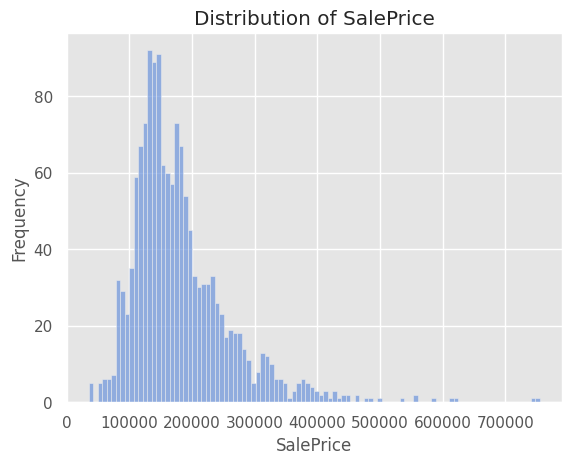

In [25]:
num_by_target(train_df, 'SalePrice')

# OUTLIER ANALYSIS AND REMOVAL
Function to calculate outlier thresholds.

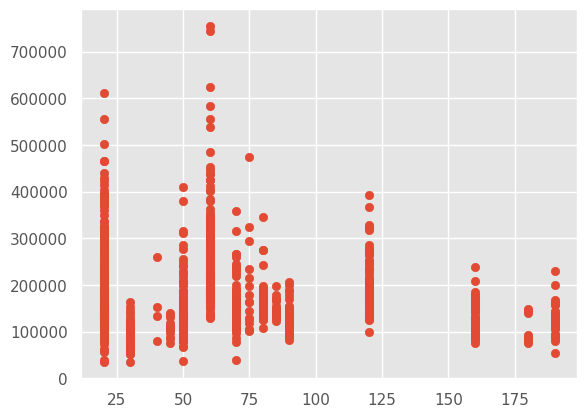

In [26]:
plt.scatter(x='MSSubClass', y='SalePrice', data=train_df)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
934,935,20,RL,313.0,27650,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,11,2008,WD,Normal,242000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


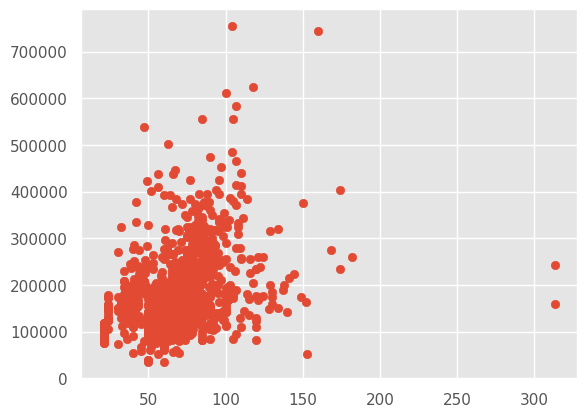

In [27]:
plt.scatter(x='LotFrontage', y='SalePrice', data=train_df)
train_df.query('LotFrontage > 300')
#Drop 935, 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
53,54,20,RL,68.0,50271,Pave,NaN,IR1,Low,AllPub,...,0,NaN,NaN,NaN,0,11,2006,WD,Normal,385000
249,250,50,RL,NaN,159000,Pave,NaN,IR2,Low,AllPub,...,0,NaN,NaN,Shed,500,6,2007,WD,Normal,277000
313,314,20,RL,150.0,215245,Pave,NaN,IR3,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,375000
335,336,190,RL,NaN,164660,Grvl,NaN,IR1,HLS,AllPub,...,0,NaN,NaN,Shed,700,8,2008,WD,Normal,228950
384,385,60,RL,NaN,53107,Pave,NaN,IR2,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,240000
451,452,20,RL,62.0,70761,Pave,NaN,IR1,Low,AllPub,...,0,NaN,NaN,NaN,0,12,2006,WD,Normal,280000
457,458,20,RL,NaN,53227,Pave,NaN,IR1,Low,AllPub,...,0,NaN,NaN,NaN,0,3,2008,WD,Normal,256000
706,707,20,RL,NaN,115149,Pave,NaN,IR2,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,302000
769,770,60,RL,47.0,53504,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


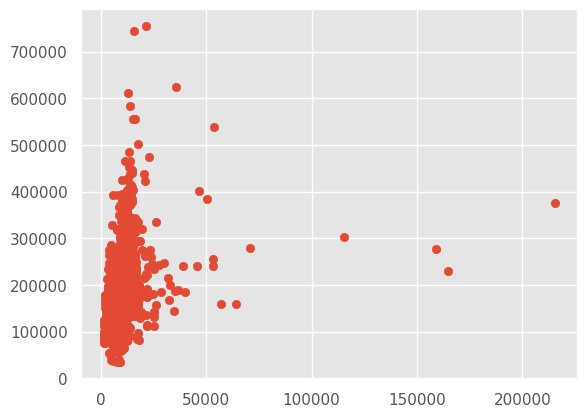

In [28]:
plt.scatter(x='LotArea', y='SalePrice', data=train_df)
train_df.query('LotArea > 50000')
# 250, 314, 336, 452,707
#maybe 1397,1299

In [29]:

stats.zscore(train_df['LotArea']).sort_values().tail(10)

384      4.268474
457      4.280500
769      4.308262
1396     4.678682
1298     5.348867
451      6.037793
706     10.486449
249     14.881285
335     15.448542
313     20.518273
Name: LotArea, dtype: float64

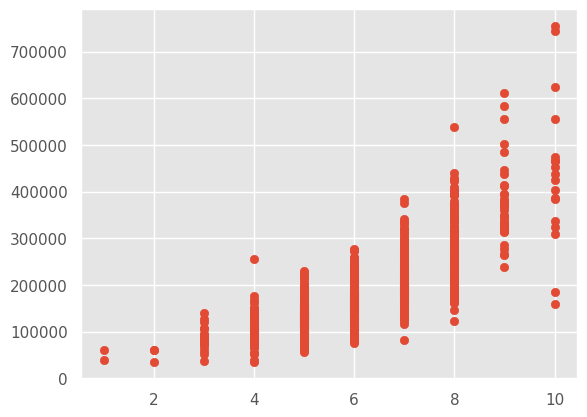

In [30]:
plt.scatter(x='OverallQual', y='SalePrice', data=train_df)

In [31]:
train_df.query('OverallQual == 10')
#maybe 524

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
58,59,60,RL,66.0,13682,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,10,2006,New,Partial,438780
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000
224,225,20,RL,103.0,13472,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,386250
389,390,60,RL,96.0,12474,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2008,New,Partial,426000
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000
515,516,20,RL,94.0,12220,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,New,Partial,402861
523,524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
583,584,75,RM,75.0,13500,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,325000
591,592,60,RL,97.0,13478,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,ConLI,Normal,451950
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000


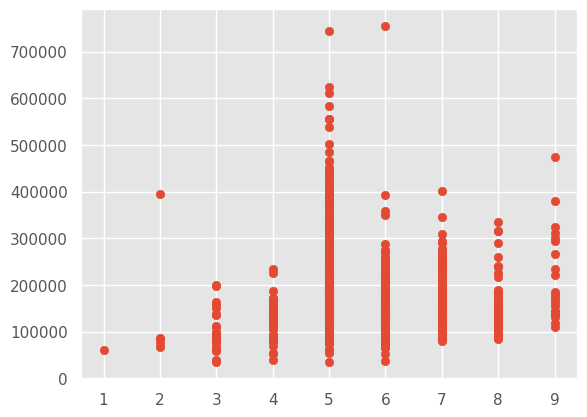

In [32]:
plt.scatter(x='OverallCond', y='SalePrice', data=train_df)

In [33]:
train_df.query('OverallCond == 2')
#379

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
88,89,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000
250,251,30,RL,55.0,5350,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,GdWo,Shed,450,5,2010,WD,Normal,76500
378,379,20,RL,88.0,11394,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,New,Partial,394432
398,399,30,RM,60.0,8967,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2007,WD,Abnorml,67000
676,677,70,RM,60.0,9600,Pave,Grvl,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,87000


In [34]:
train_df.query('OverallCond == 5 & SalePrice > 700000')
#1183

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


In [35]:
train_df.query('OverallCond == 6 & SalePrice > 700000')
#692

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000


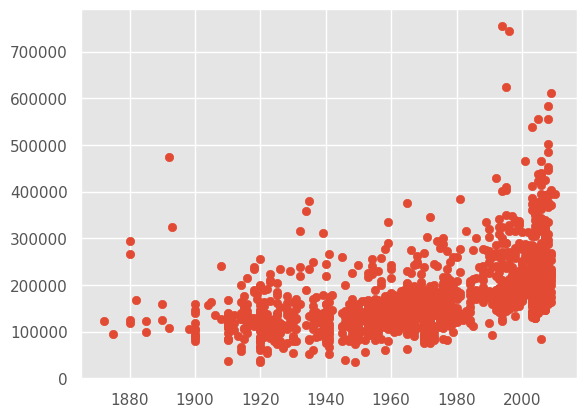

In [36]:
plt.scatter(x='YearBuilt', y='SalePrice', data=train_df)

In [37]:
train_df.query('YearBuilt < 1900 & SalePrice > 400000')
#186

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000


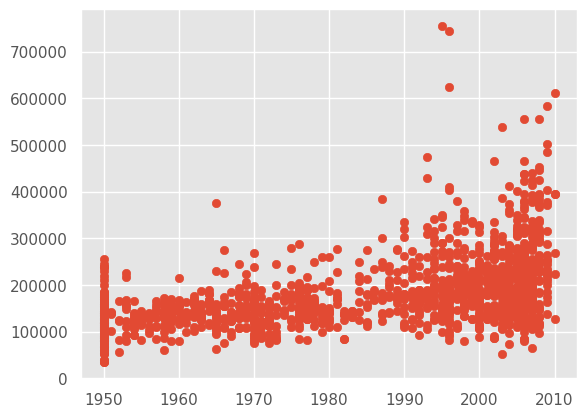

In [38]:
plt.scatter(x='YearRemodAdd', y='SalePrice', data=train_df)

In [39]:
train_df.query('YearRemodAdd < 1970 & SalePrice > 300000')
#314

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
313,314,20,RL,150.0,215245,Pave,NaN,IR3,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,375000


In [40]:
train_df.query('YearRemodAdd > 1990 & SalePrice > 600000')
#692,1183

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


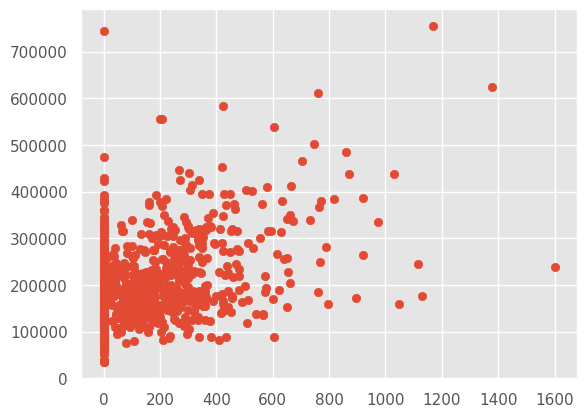

In [41]:
plt.scatter(x='MasVnrArea', y='SalePrice', data=train_df)

In [42]:
train_df.query('MasVnrArea > 1500 ')
#186
#298

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
297,298,60,FV,66.0,7399,Pave,Pave,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,239000


In [43]:
train_df.query('MasVnrArea < 1500 & SalePrice > 600000')
#186
#298

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


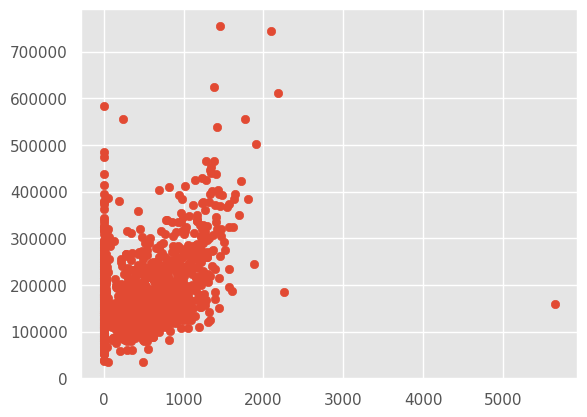

In [44]:
plt.scatter(x='BsmtFinSF1', y='SalePrice', data=train_df)

In [45]:
train_df.query('BsmtFinSF1 > 5000')
#1299


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


In [46]:
train_df.query('BsmtFinSF1 < 5000 & SalePrice > 600000')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


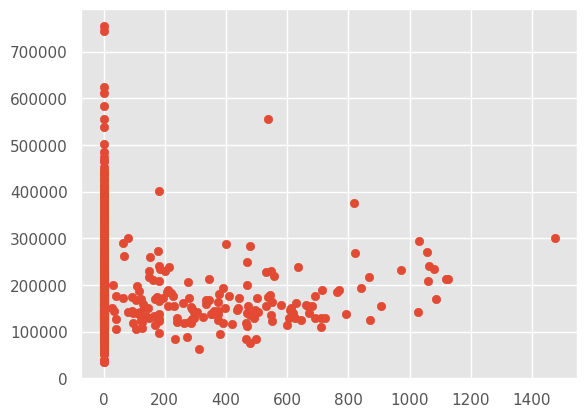

In [47]:
plt.scatter(x='BsmtFinSF2', y='SalePrice', data=train_df)

In [48]:
train_df.query('BsmtFinSF2 > 400 & SalePrice > 500000')
#441

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000


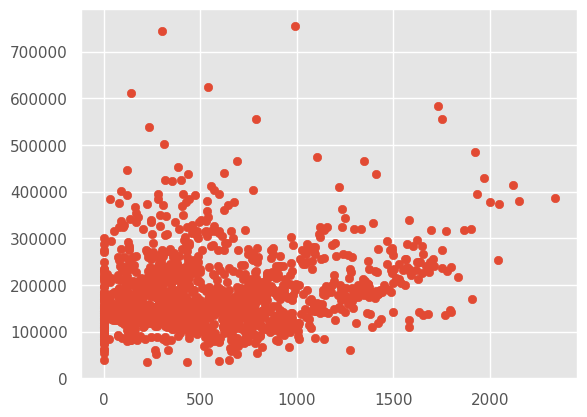

In [49]:
plt.scatter(x='BsmtUnfSF', y='SalePrice', data=train_df)

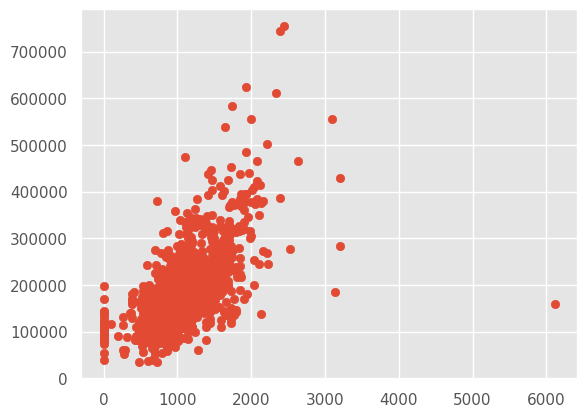

In [50]:
plt.scatter(x='TotalBsmtSF', y='SalePrice', data=train_df)

In [51]:
train_df.query('TotalBsmtSF > 5000')
#1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


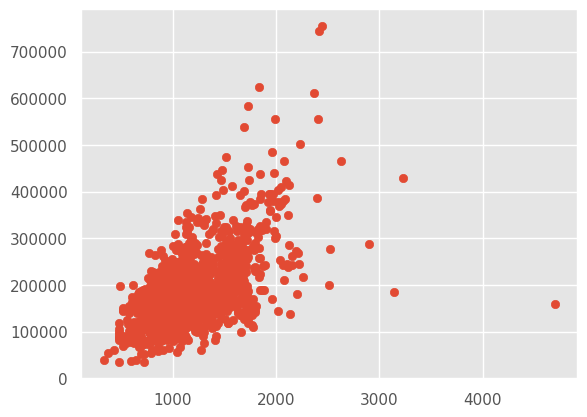

In [52]:
plt.scatter(x='1stFlrSF', y='SalePrice', data=train_df)

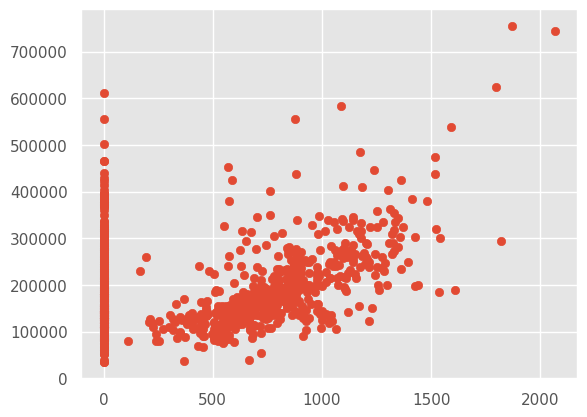

In [53]:
plt.scatter(x='2ndFlrSF', y='SalePrice', data=train_df)

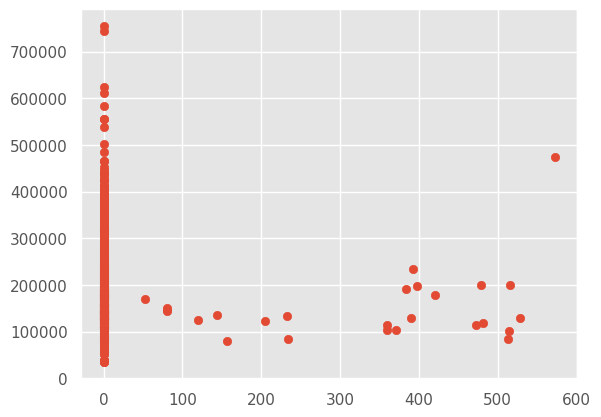

In [54]:
plt.scatter(x='LowQualFinSF', y='SalePrice', data=train_df)

In [55]:
train_df.query('LowQualFinSF > 500')
#186

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
88,89,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000
170,171,50,RM,NaN,12358,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,128500
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000
635,636,190,RH,60.0,10896,Pave,Pave,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Abnorml,200000
1009,1010,50,RL,60.0,6000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,102000


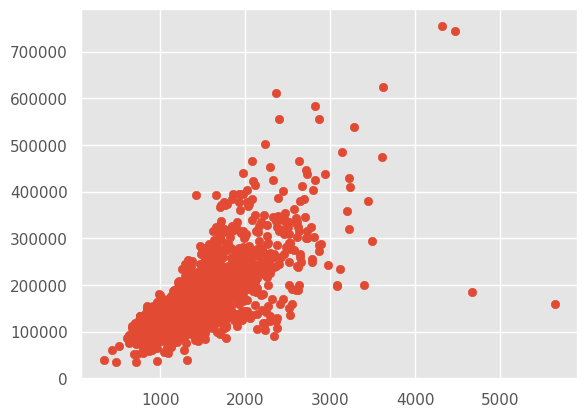

In [56]:
plt.scatter(x='GrLivArea', y='SalePrice', data=train_df)

In [57]:
train_df.query('GrLivArea > 4400')
#524, 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


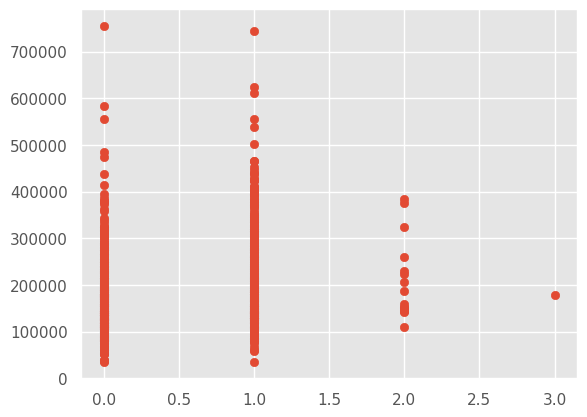

In [58]:
plt.scatter(x='BsmtFullBath', y='SalePrice', data=train_df)

In [59]:
train_df.query('BsmtFullBath == 3')
#739

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
738,739,90,RL,60.0,10800,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2009,WD,Alloca,179000


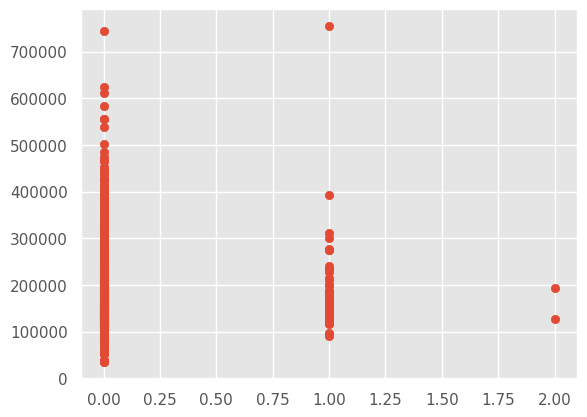

In [60]:
plt.scatter(x='BsmtHalfBath', y='SalePrice', data=train_df)

In [61]:
stats.zscore(train_df['BsmtHalfBath']).unique()

array([-0.24106104,  3.94880935,  8.13867973])

In [62]:
train_df.query('BsmtHalfBath == 2')
#598, 955

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
597,598,120,RL,53.0,3922,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,New,Partial,194201
954,955,90,RL,35.0,9400,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2006,WD,AdjLand,127500


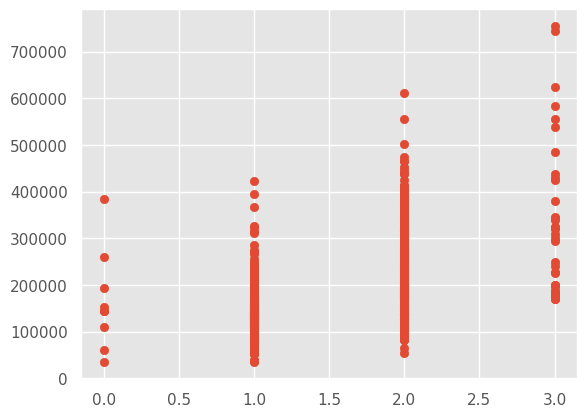

In [63]:
plt.scatter(x='FullBath', y='SalePrice', data=train_df)

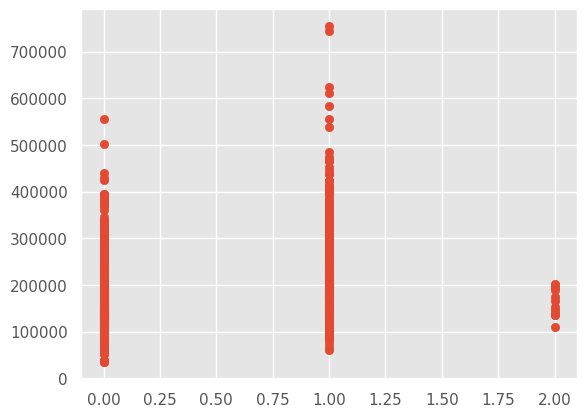

In [64]:
plt.scatter(x='HalfBath', y='SalePrice', data=train_df)

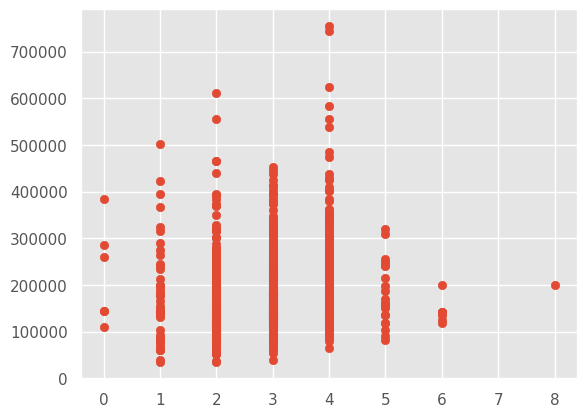

In [65]:
plt.scatter(x='BedroomAbvGr', y='SalePrice', data=train_df)

In [66]:
train_df.query('BedroomAbvGr == 8')
#636

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
635,636,190,RH,60.0,10896,Pave,Pave,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Abnorml,200000


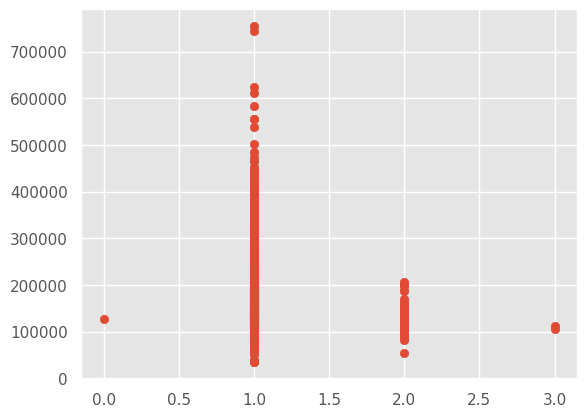

In [67]:
plt.scatter(x='KitchenAbvGr', y='SalePrice', data=train_df)

In [68]:
train_df.query('KitchenAbvGr == 3')
#49, 810

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
48,49,190,RM,33.0,4456,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,New,Partial,113000
809,810,75,RM,90.0,8100,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,11,2009,WD,Normal,106000


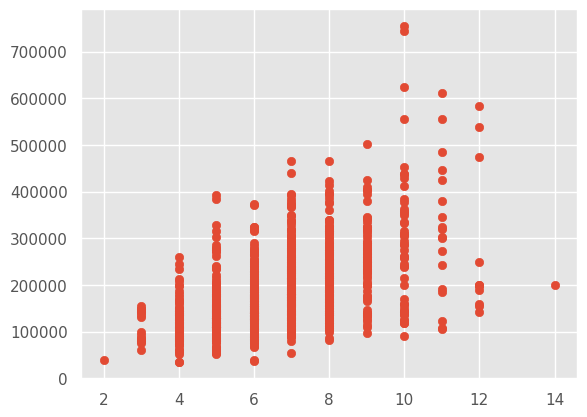

In [69]:
plt.scatter(x='TotRmsAbvGrd', y='SalePrice', data=train_df)

In [70]:
train_df.query('TotRmsAbvGrd == 14')
#636

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
635,636,190,RH,60.0,10896,Pave,Pave,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Abnorml,200000


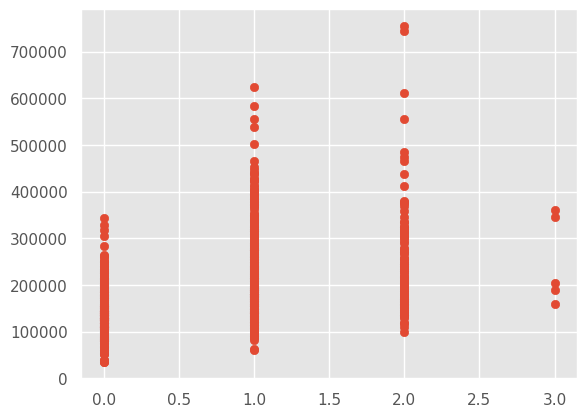

In [71]:
plt.scatter(x='Fireplaces', y='SalePrice', data=train_df)


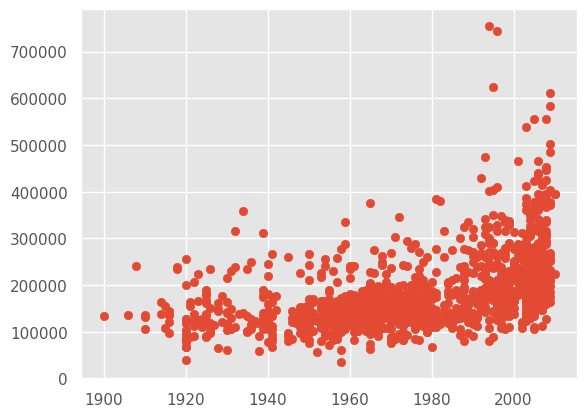

In [72]:
plt.scatter(x='GarageYrBlt', y='SalePrice', data=train_df)

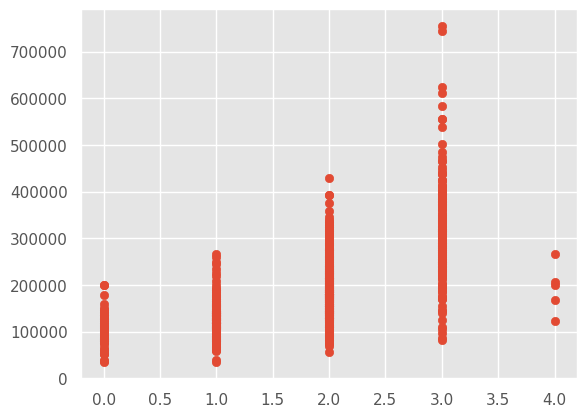

In [73]:
plt.scatter(x='GarageCars', y='SalePrice', data=train_df)

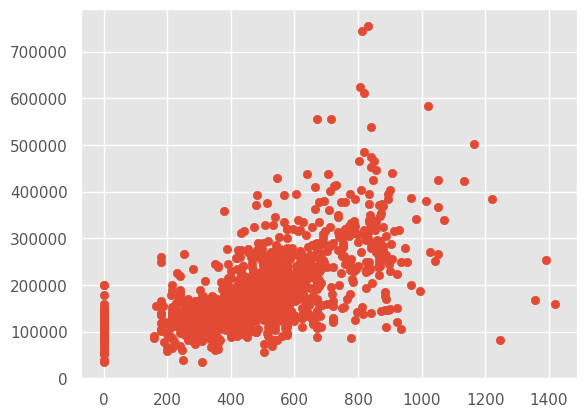

In [74]:
plt.scatter(x='GarageArea', y='SalePrice', data=train_df)

In [75]:
train_df.query('GarageArea > 1200')
#1062, 1191

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
581,582,20,RL,98.0,12704,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2009,New,Partial,253293
825,826,20,RL,114.0,14803,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,New,Partial,385000
1061,1062,30,C (all),120.0,18000,Grvl,NaN,Reg,Low,AllPub,...,0,NaN,NaN,Shed,560,8,2008,ConLD,Normal,81000
1190,1191,190,RL,NaN,32463,Pave,NaN,Reg,Low,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,168000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


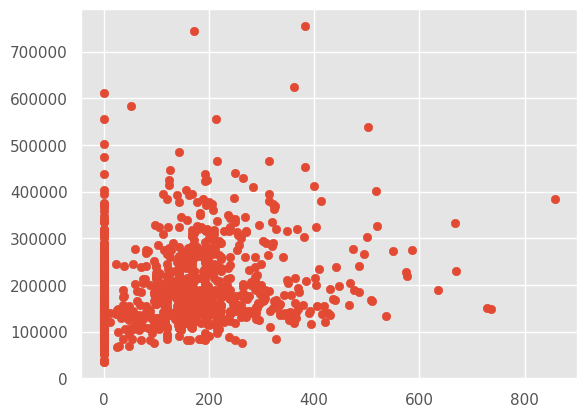

In [76]:
plt.scatter(x='WoodDeckSF', y='SalePrice', data=train_df)

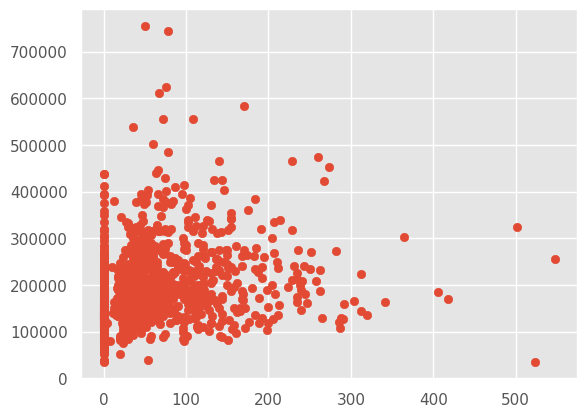

In [77]:
plt.scatter(x='OpenPorchSF', y='SalePrice', data=train_df)

In [78]:
train_df.query('OpenPorchSF > 500')
#496

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
495,496,30,C (all),60.0,7879,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdWo,NaN,0,11,2009,WD,Abnorml,34900
583,584,75,RM,75.0,13500,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,325000
1328,1329,50,RM,60.0,10440,Pave,Grvl,Reg,Lvl,AllPub,...,0,NaN,MnPrv,Shed,1150,6,2008,WD,Normal,256000


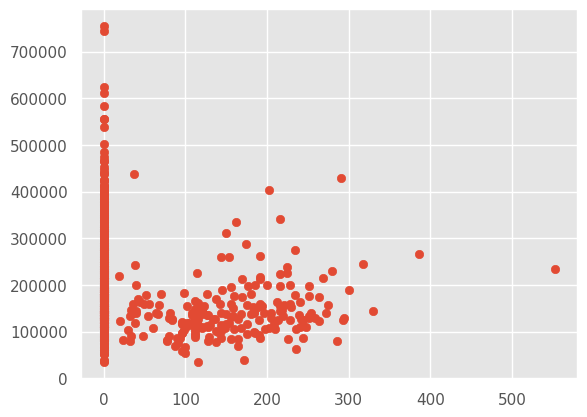

In [79]:
plt.scatter(x='EnclosedPorch', y='SalePrice', data=train_df)

In [80]:
train_df.query('EnclosedPorch > 500')
#198

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
197,198,75,RL,174.0,25419,Pave,NaN,Reg,Lvl,AllPub,...,512,Ex,GdPrv,NaN,0,3,2006,WD,Abnorml,235000


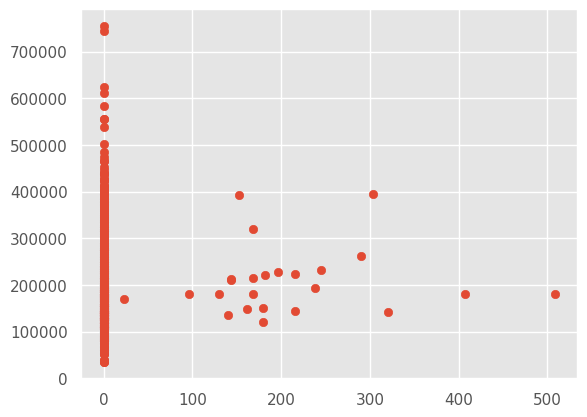

In [81]:
plt.scatter(x='3SsnPorch', y='SalePrice', data=train_df)

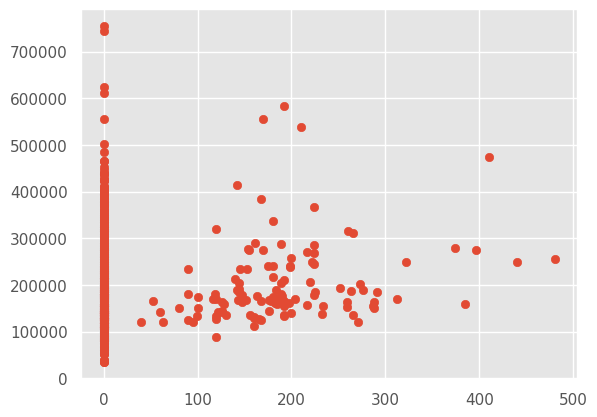

In [82]:
plt.scatter(x='ScreenPorch', y='SalePrice', data=train_df)

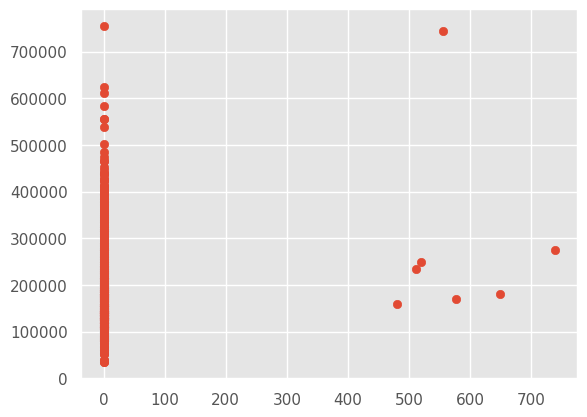

In [83]:
plt.scatter(x='PoolArea', y='SalePrice', data=train_df)

Removal of Outlier AND replaces the NULL values with a specified value

In [84]:
values = [598, 955, 935, 1299, 250, 314, 336, 707, 379, 1183, 692, 186, 441, 186, 524, 739, 598, 955, 636, 692,1183,452,1062, 1191, 496, 198, 1338]

In [85]:
#Remove the values which has seen in scatter plot
train_df = train_df[train_df.Id.isin(values) == False]

In [86]:
#sorting the null values
pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False)).head(20)

,0
PoolQC,1434
MiscFeature,1387
Alley,1349
Fence,1161
MasVnrType,860
FireplaceQu,684
LotFrontage,255
GarageQual,76
GarageFinish,76
GarageYrBlt,76


In [87]:
train_df['MiscFeature'].unique()

array([nan, 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

 any missing (NaN) values are being replaced with the string 'No'

In [88]:
train_df['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [89]:
# any missing (NaN) values are being replaced with the string 'No'
train_df['Alley'].fillna('No', inplace=True)
test_df['Alley'].fillna('No', inplace=True)

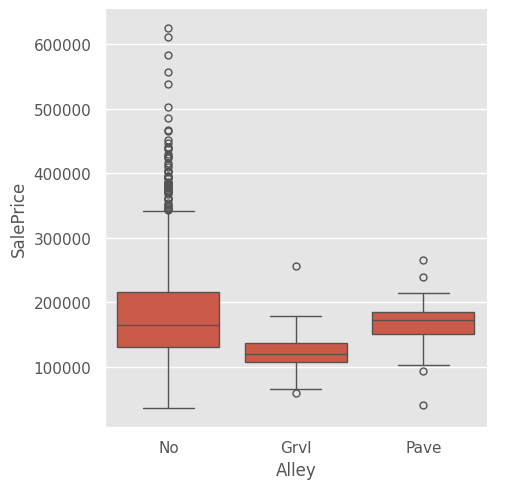

In [90]:
sns.catplot(data=train_df, x="Alley", y="SalePrice", kind="box")

In [91]:
train_df['Fence'].unique()

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [92]:
train_df['Fence'].fillna('No', inplace=True)
test_df['Fence'].fillna('No', inplace=True)

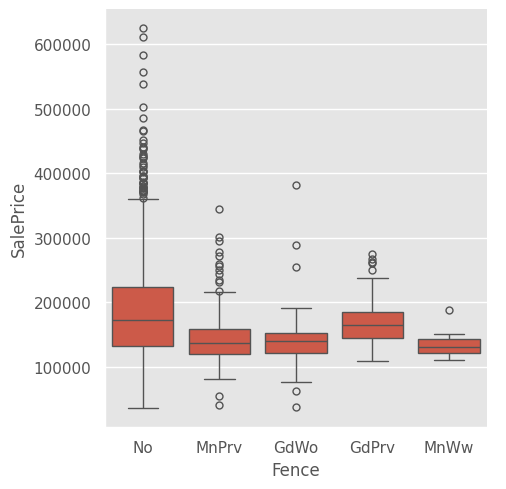

In [93]:
sns.catplot(data=train_df, x="Fence", y="SalePrice", kind="box")

In [94]:
train_df['MasVnrType'].unique()

array(['BrkFace', nan, 'Stone', 'BrkCmn'], dtype=object)

In [95]:
train_df['MasVnrType'].fillna('No', inplace=True)
test_df['MasVnrType'].fillna('No', inplace=True)

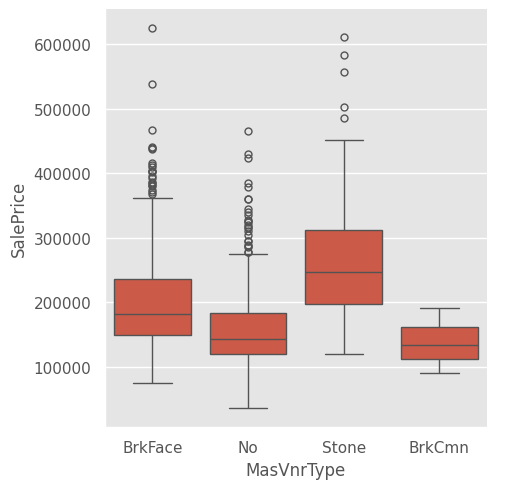

In [96]:
sns.catplot(data=train_df, x="MasVnrType", y="SalePrice", kind="box")

In [97]:
train_df['MasVnrArea'].fillna(0, inplace=True)
test_df['MasVnrArea'].fillna(0, inplace=True)

In [98]:
train_df['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [99]:
train_df['FireplaceQu'].fillna('No', inplace=True)
test_df['FireplaceQu'].fillna('No', inplace=True)

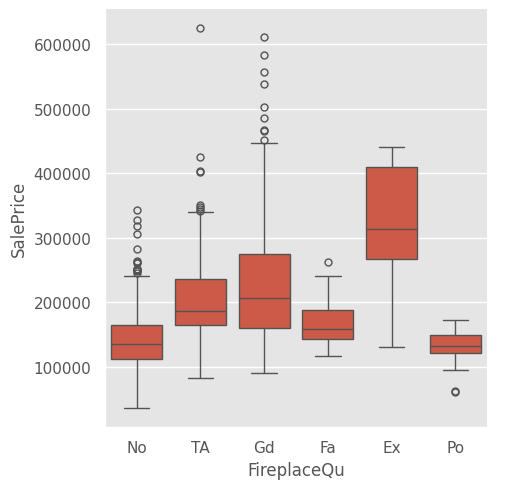

In [100]:
sns.catplot(data=train_df, x="FireplaceQu", y="SalePrice", kind="box")

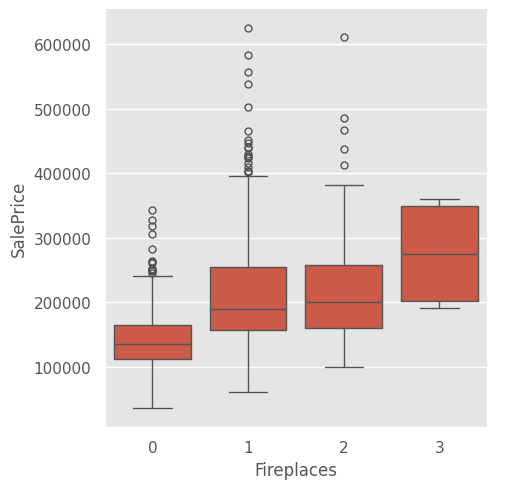

In [101]:
sns.catplot(data=train_df, x="Fireplaces", y="SalePrice", kind="box")

In [102]:
train_df['LotFrontage'].fillna(0, inplace=True)
test_df['LotFrontage'].fillna(0, inplace=True)

In [103]:
train_df['GarageYrBlt'].corr(train_df['YearBuilt'])

0.8289973061945678

In [104]:
train_df['GarageCond'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Po', 'Ex'], dtype=object)

In [105]:
train_df['GarageCond'].fillna('No', inplace=True)
test_df['GarageCond'].fillna('No', inplace=True)

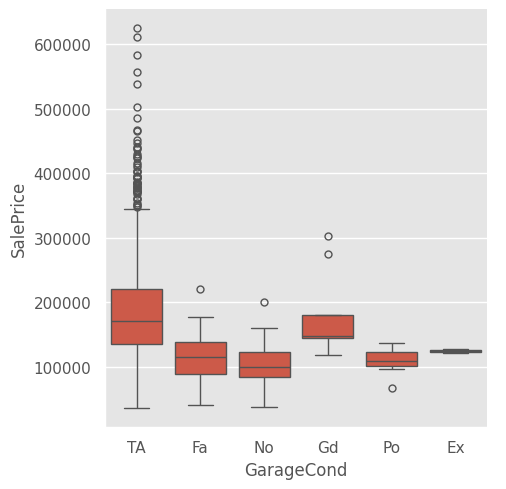

In [106]:
sns.catplot(data=train_df, x="GarageCond", y="SalePrice", kind="box")

In [107]:
train_df['GarageType'].fillna('No', inplace=True)
test_df['GarageType'].fillna('No', inplace=True)

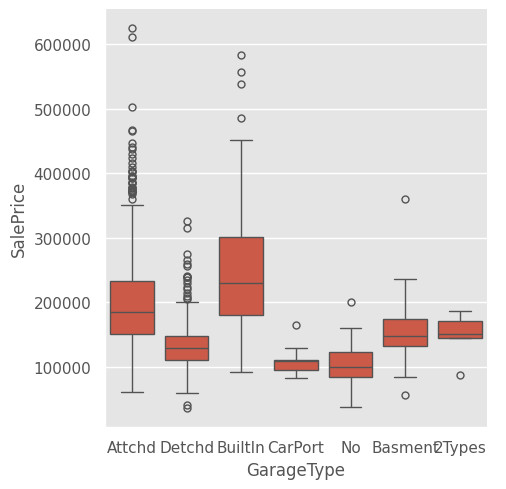

In [108]:
sns.catplot(data=train_df, x="GarageType", y="SalePrice", kind="box")

In [109]:
train_df['GarageFinish'].fillna('No', inplace=True)
test_df['GarageFinish'].fillna('No', inplace=True)

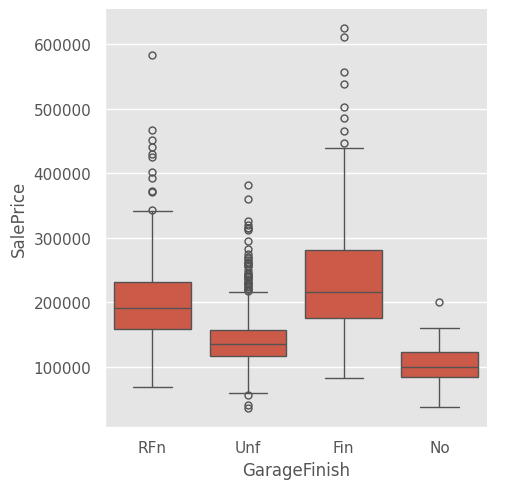

In [110]:
sns.catplot(data=train_df, x="GarageFinish", y="SalePrice", kind="box")

In [111]:
train_df['GarageQual'].fillna('No', inplace=True)
test_df['GarageQual'].fillna('No', inplace=True)

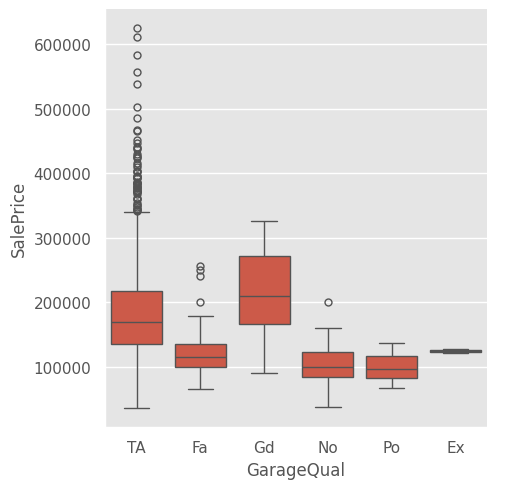

In [112]:
sns.catplot(data=train_df, x="GarageQual", y="SalePrice", kind="box")

In [113]:
train_df['BsmtFinType2'].unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [114]:
train_df['BsmtFinType2'].fillna('Unf', inplace=True)
test_df['BsmtFinType2'].fillna('Unf', inplace=True)

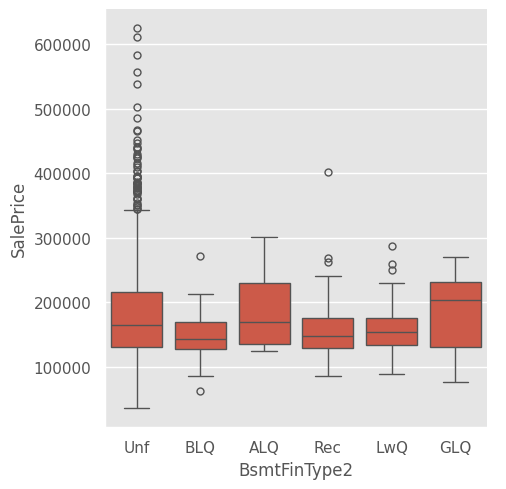

In [115]:
sns.catplot(data=train_df, x="BsmtFinType2", y="SalePrice", kind="box")

In [116]:
train_df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [117]:
train_df['BsmtExposure'].fillna('No', inplace=True)
test_df['BsmtExposure'].fillna('No', inplace=True)

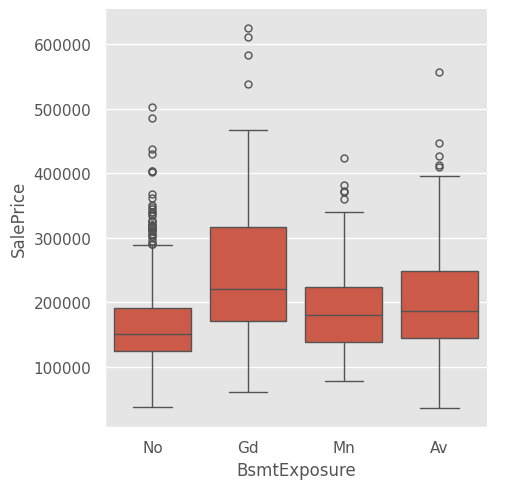

In [118]:
sns.catplot(data=train_df, x="BsmtExposure", y="SalePrice", kind="box")

In [119]:
train_df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [120]:
train_df['BsmtQual'].fillna('No', inplace=True)
test_df['BsmtQual'].fillna('No', inplace=True)

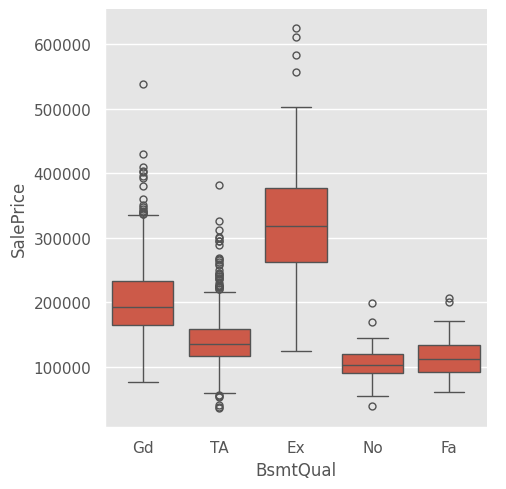

In [121]:
sns.catplot(data=train_df, x="BsmtQual", y="SalePrice", kind="box")

In [122]:
train_df['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [123]:
train_df['BsmtCond'].fillna('No', inplace=True)
test_df['BsmtCond'].fillna('No', inplace=True)

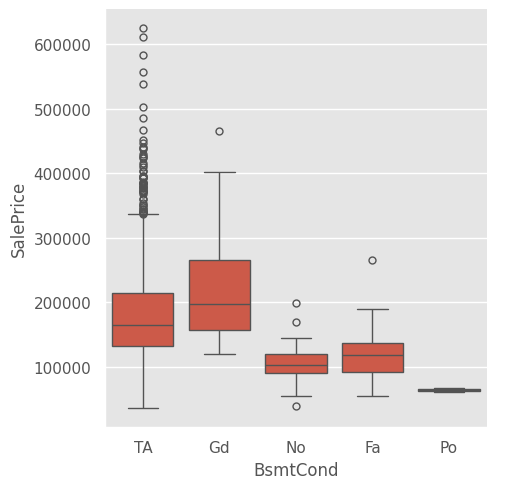

In [124]:
sns.catplot(data=train_df, x="BsmtCond", y="SalePrice", kind="box")

In [125]:
train_df['BsmtFinType1'].unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [126]:
train_df['BsmtFinType1'].fillna('Unf', inplace=True)
test_df['BsmtFinType1'].fillna('Unf', inplace=True)

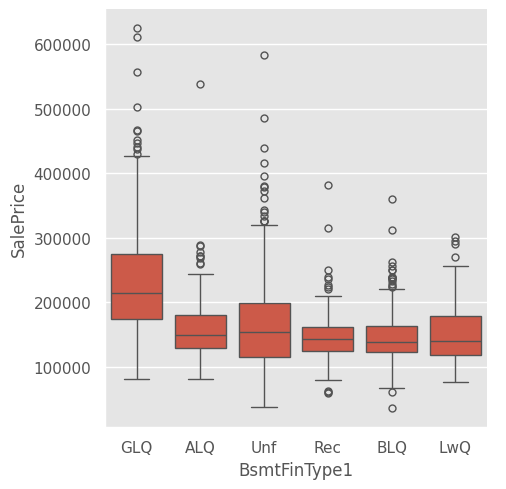

In [127]:
sns.catplot(data=train_df, x="BsmtFinType1", y="SalePrice", kind="box")

In [128]:
train_df['MasVnrArea'].fillna(0, inplace=True)
test_df['MasVnrArea'].fillna(0, inplace=True)

In [129]:
train_df['Electrical'].fillna('SBrkr', inplace=True)
test_df['Electrical'].fillna('SBrkr', inplace=True)

In [130]:
train_df = train_df.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'GarageYrBlt', 'GarageCond', 'BsmtFinType2'])
test_df = test_df.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'GarageYrBlt', 'GarageCond', 'BsmtFinType2'])

# Feature Engineering

In [131]:
train_df['houseage'] = train_df['YrSold'] - train_df['YearBuilt']
test_df['houseage'] = test_df['YrSold'] - test_df['YearBuilt']

In [132]:
train_df['houseremodelage'] = train_df['YrSold'] - train_df['YearRemodAdd']
test_df['houseremodelage'] = test_df['YrSold'] - test_df['YearRemodAdd']

In [133]:
train_df['totalsf'] = train_df['1stFlrSF'] + train_df['2ndFlrSF'] + train_df['BsmtFinSF1'] + train_df['BsmtFinSF2']
test_df['totalsf'] = test_df['1stFlrSF'] + test_df['2ndFlrSF'] + test_df['BsmtFinSF1'] + test_df['BsmtFinSF2']

In [134]:
train_df['totalarea'] = train_df['GrLivArea'] + train_df['TotalBsmtSF']
test_df['totalarea'] = test_df['GrLivArea'] + test_df['TotalBsmtSF']

In [135]:
train_df['totalbaths'] = train_df['BsmtFullBath'] + train_df['FullBath'] + 0.5 * (train_df['BsmtHalfBath'] + train_df['HalfBath'])
test_df['totalbaths'] = test_df['BsmtFullBath'] + test_df['FullBath'] + 0.5 * (test_df['BsmtHalfBath'] + test_df['HalfBath'])

In [136]:
train_df['totalporchsf'] = train_df['OpenPorchSF'] + train_df['3SsnPorch'] + train_df['EnclosedPorch'] + train_df['ScreenPorch'] + train_df['WoodDeckSF']
test_df['totalporchsf'] = test_df['OpenPorchSF'] + test_df['3SsnPorch'] + test_df['EnclosedPorch'] + test_df['ScreenPorch'] + test_df['WoodDeckSF']

In [137]:
train_df = train_df.drop(columns=['Id','YrSold', 'YearBuilt', 'YearRemodAdd', '1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2', 'GrLivArea', 'TotalBsmtSF','BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath', 'OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'ScreenPorch','WoodDeckSF'])
test_df = test_df.drop(columns=['YrSold', 'YearBuilt', 'YearRemodAdd', '1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2', 'GrLivArea', 'TotalBsmtSF','BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath', 'OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'ScreenPorch','WoodDeckSF'])

                 MSSubClass  LotFrontage   LotArea  OverallQual  OverallCond  \
MSSubClass         1.000000    -0.216999 -0.307164     0.039388    -0.064547   
LotFrontage       -0.216999     1.000000  0.134435     0.152709    -0.050893   
LotArea           -0.307164     0.134435  1.000000     0.153136    -0.013906   
OverallQual        0.039388     0.152709  0.153136     1.000000    -0.097429   
OverallCond       -0.064547    -0.050893 -0.013906    -0.097429     1.000000   
MasVnrArea         0.026655     0.093980  0.129408     0.398816    -0.127390   
BsmtUnfSF         -0.143098     0.176509  0.041584     0.312450    -0.145423   
LowQualFinSF       0.020845     0.030323 -0.017785    -0.068335    -0.001445   
BedroomAbvGr      -0.043618     0.146515  0.214177     0.099274    -0.004717   
KitchenAbvGr       0.283217     0.039125 -0.011899    -0.188908    -0.096181   
TotRmsAbvGrd       0.030328     0.197178  0.310073     0.411563    -0.070338   
Fireplaces        -0.047150     0.017764

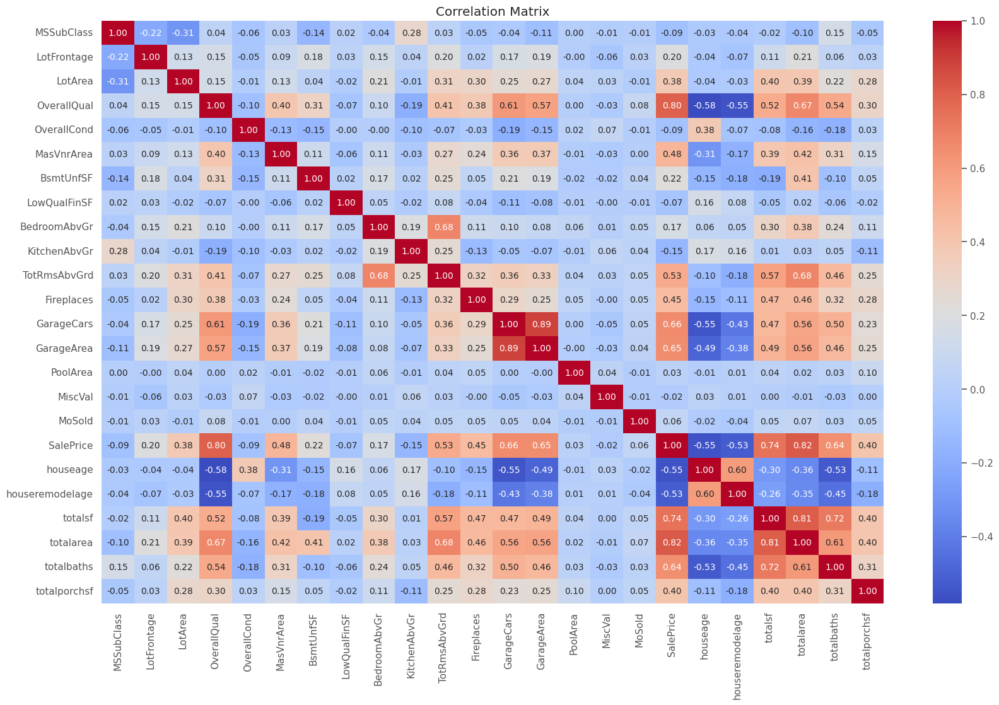

In [138]:
corr_matrix = train_df.corr(numeric_only=True)

# Print the correlation matrix
print(corr_matrix)

# Visualize the correlation matrix
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [139]:
# drop GarageArea and GarageCars
train_df = train_df.drop(columns=['GarageArea'])
test_df = test_df.drop(columns=['GarageArea'])

train_df = train_df.drop(columns=['GarageCars'])
test_df = test_df.drop(columns=['GarageCars'])

<Axes: xlabel='SalePrice', ylabel='Count'>

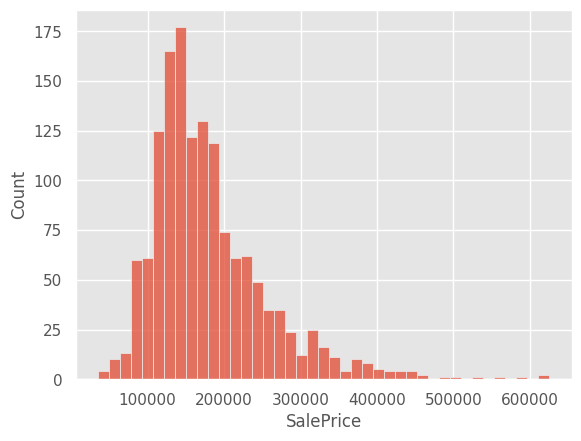

In [140]:
sns.histplot(
    train_df,
    x=train_df['SalePrice']
)

In [141]:
#log function used to reduce skewness,handling outliers,linear relationship
train_df['SalePrice'] = np.log1p(train_df['SalePrice'])

<Axes: xlabel='SalePrice', ylabel='Count'>

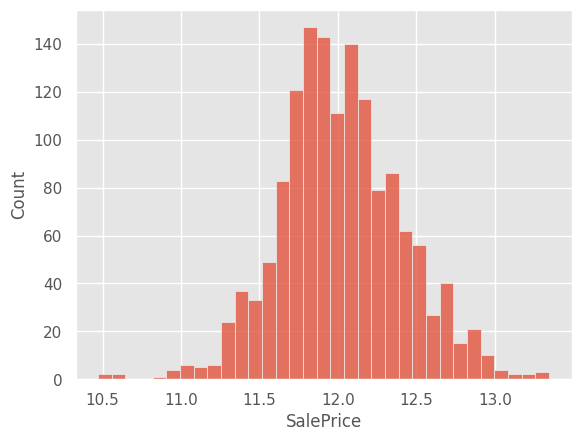

In [142]:
sns.histplot(
    train_df,
    x=train_df['SalePrice']
)

In [143]:
train_df.dtypes[train_df.dtypes=='object']

MSZoning         object
Street           object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
KitchenQual      object
Functional       object
FireplaceQu      object
GarageType       object
GarageFinish     object
GarageQual       object
PavedDrive       object
SaleType         object
SaleCondition    object
dtype: object

In [144]:
train_df.dtypes[train_df.dtypes !='object']

MSSubClass           int64
LotFrontage        float64
LotArea              int64
OverallQual          int64
OverallCond          int64
MasVnrArea         float64
BsmtUnfSF            int64
LowQualFinSF         int64
BedroomAbvGr         int64
KitchenAbvGr         int64
TotRmsAbvGrd         int64
Fireplaces           int64
PoolArea             int64
MiscVal              int64
MoSold               int64
SalePrice          float64
houseage             int64
houseremodelage      int64
totalsf              int64
totalarea            int64
totalbaths         float64
totalporchsf         int64
dtype: object

# Data Preprocesssing,

One-hot encoding and ordinal encoding are techniques used to convert categorical data into numerical form for machine learning models. For instance, consider a dataset with a feature "Size" having categories ["Small", "Medium", "Large"]. Using one-hot encoding, we create three binary columns: "Small" becomes [1, 0, 0], "Medium" becomes [0, 1, 0], and "Large" becomes [0, 0, 1], effectively capturing each category's presence without implying any order. Conversely, ordinal encoding assigns each category a unique integer based on their natural order: "Small" becomes 1, "Medium" becomes 2, and "Large" becomes 3. This method is efficient in memory usage and computation but assumes a linear relationship among categories, which is appropriate for ordinal data like size but not for nominal data without inherent order, such as colors. Thus, one-hot encoding is preferable for non-ordered categories, while ordinal encoding suits naturally ordered data.

In [145]:
# Ordinal coding: ordinal encoding or integer encoding) is a technique used to convert categorical variables into numerical values.
ode_cols = ['LotShape', 'LandContour','Utilities','LandSlope',  'BsmtQual',  'BsmtFinType1',  'CentralAir',  'Functional', \
           'FireplaceQu', 'GarageFinish', 'GarageQual', 'PavedDrive', 'ExterCond', 'KitchenQual', 'BsmtExposure', 'HeatingQC','ExterQual', 'BsmtCond']

In [146]:
#One hot encoding is a technique used in machine learning to
#convert categorical data into a numerical format that can be used by algorithms. This encoding creates binary (0 or 1) columns for each category in the original data,
# ensuring that no ordinal relationships are implied between the categories.
ohe_cols = ['Street', 'LotConfig','Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', \
           'MasVnrType','Foundation',  'Electrical',  'SaleType', 'MSZoning', 'SaleCondition', 'Heating', 'GarageType', 'RoofMatl']

In [147]:
num_cols = train_df.select_dtypes(include=['int64', 'float64']).columns
num_cols = num_cols.drop('SalePrice')

In [148]:
num_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

In [149]:
ode_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ode', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

In [150]:
ohe_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

In [151]:
col_trans = ColumnTransformer(transformers=[
    ('num_p', num_pipeline, num_cols),
    ('ode_p', ode_pipeline, ode_cols),
    ('ohe_p', ohe_pipeline, ohe_cols),
    ],
    remainder='passthrough',
    n_jobs=-1)

In [152]:
pipeline = Pipeline(steps=[
    ('preprocessing', col_trans)
])

# Data Splitting

In [153]:
X = train_df.drop('SalePrice', axis=1)
y = train_df['SalePrice']

In [154]:
X_preprocessed = pipeline.fit_transform(X)

In [155]:
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=25)

In [156]:
print(X.shape, X_train.shape, X_test.shape)

(1438, 58) (1150, 193) (288, 193)


# ML Model Training

## LinearRegression

Mean Absolute Error:  12150371.077597726
Mean Squared Error:  1.7056788532519e+16
Root Mean Squared Error:  130601640.61955348
R² on Test data:  -1.1109052362655064e+17


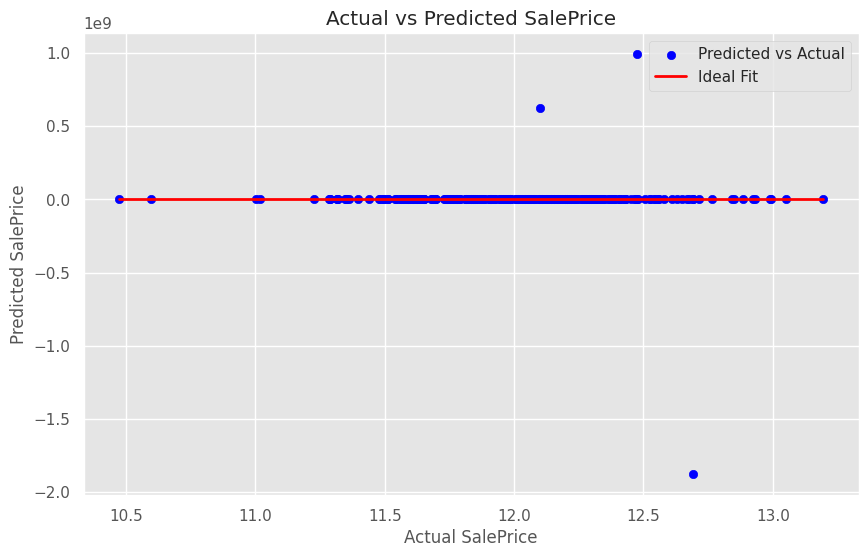

In [157]:
lr = LinearRegression()
lr.fit(X_train, y_train)

X_test_prediction = lr.predict(X_test)

# mean absolute error for test data
mae = mean_absolute_error(y_test, X_test_prediction)
print('Mean Absolute Error: ', mae)

#mean Square error for test data
mse=mean_squared_error(y_test, X_test_prediction)
print('Mean Squared Error: ', mse)

#root mean square error for test data
rmse=np.sqrt(mse)
print('Root Mean Squared Error: ', rmse)

# R² score on test data
test_data_r2 = r2_score(y_test, X_test_prediction)
print('R² on Test data: ', test_data_r2)

# Visualize the results
plt.figure(figsize=(10, 6))
plt.scatter(y_test, X_test_prediction, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## KNN model

Best parameters for KNN:  {'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Best score for KNN:  -0.024601149166311623
Best RMSE for KNN:  0.15684753477919766

Training Data Metrics for KNN:
Mean Absolute Error:  0.0
Mean Squared Error:  0.0
Root Mean Squared Error:  0.0
R2 Score:  1.0

Test Data Metrics for KNN:
Mean Absolute Error:  0.11082514384691705
Mean Squared Error:  0.027236252367761556
Root Mean Squared Error:  0.1650340945615831
R2 Score:  0.8226108313771381


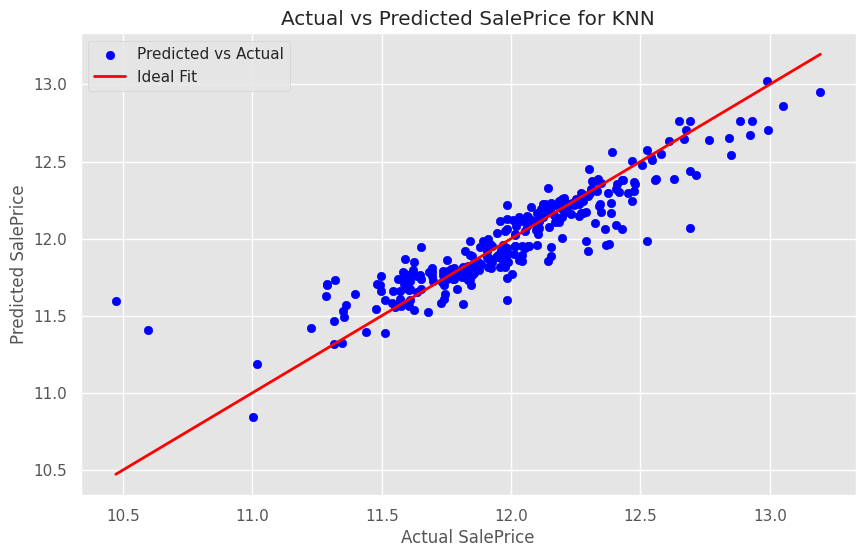

In [158]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
# Define the KNN model
knn = KNeighborsRegressor()

# Define the parameter grid for GridSearchCV
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 10, 100],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]
}
knn_cv = GridSearchCV(knn, param_grid_knn, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
knn_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for KNN: ", knn_cv.best_params_)
print("Best score for KNN: ", knn_cv.best_score_)
print("Best RMSE for KNN: ", np.sqrt(-1 * knn_cv.best_score_))

# Get the best estimator
best_knn = knn_cv.best_estimator_

# Predict on training data
y_train_pred = best_knn.predict(X_train)

# Predict on test data
y_test_pred = best_knn.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for KNN:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for KNN:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for KNN')
plt.legend()
plt.show()


## SVM model

Best parameters for SVM:  {'C': 6.199966577826209, 'degree': 5, 'gamma': 0.001, 'kernel': 'rbf'}
Best score for SVM:  -0.012626837470812275
Best RMSE for SVM:  0.11236920161152822

Training Data Metrics for SVM:
Mean Absolute Error:  0.06976323925158913
Mean Squared Error:  0.009171776646945911
Root Mean Squared Error:  0.09576939305929588
R2 Score:  0.9394877168122208

Test Data Metrics for SVM:
Mean Absolute Error:  0.07649252287557948
Mean Squared Error:  0.012581250435831625
Root Mean Squared Error:  0.11216617331366718
R2 Score:  0.9180585667619289


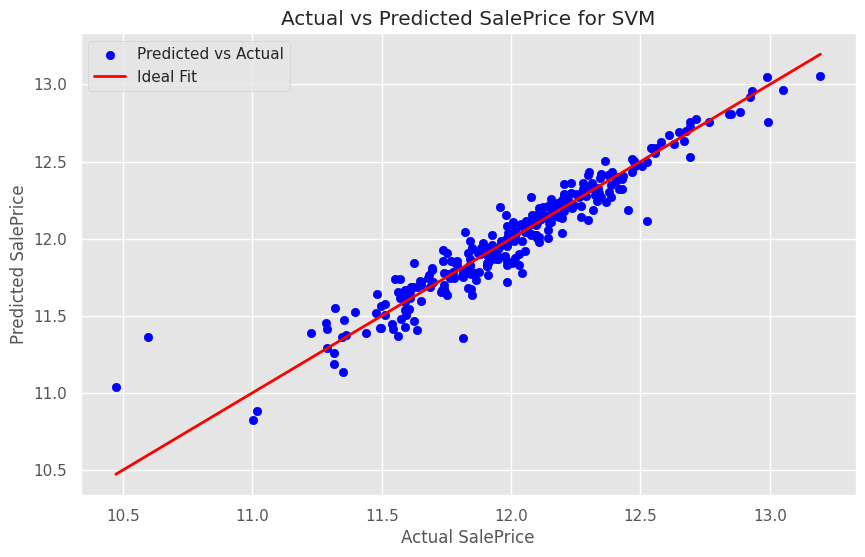

In [159]:
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
import matplotlib.pyplot as plt

# Define the SVM model
svm = SVR()

# Define the parameter distributions for RandomizedSearchCV
param_dist_svm = {
    'C': uniform(0.1, 10),
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto'] + list(np.logspace(-3, 3, 10)),
    'degree': [3, 4, 5]
}

# Initialize RandomizedSearchCV
svm_random_search = RandomizedSearchCV(svm, param_distributions=param_dist_svm, n_iter=20, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
svm_random_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for SVM: ", svm_random_search.best_params_)
print("Best score for SVM: ", svm_random_search.best_score_)
print("Best RMSE for SVM: ", np.sqrt(-1 * svm_random_search.best_score_))

# Get the best estimator
best_svm = svm_random_search.best_estimator_

# Predict on training data
y_train_pred = best_svm.predict(X_train)

# Predict on test data
y_test_pred = best_svm.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for SVM:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for SVM:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for SVM')
plt.legend()
plt.show()


## Decision Tree model

Best parameters for Decision Tree:  {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 20}
Best score for Decision Tree:  -0.03726743120672199
Best RMSE for Decision Tree:  0.1930477433349636

Training Data Metrics for Decision Tree:
Mean Absolute Error:  0.11465466165268184
Mean Squared Error:  0.024513959169628133
Root Mean Squared Error:  0.15656934300695055
R2 Score:  0.8382651806266841

Test Data Metrics for Decision Tree:
Mean Absolute Error:  0.1527108498480938
Mean Squared Error:  0.04553247424194566
Root Mean Squared Error:  0.21338339729685077
R2 Score:  0.7034479031086892


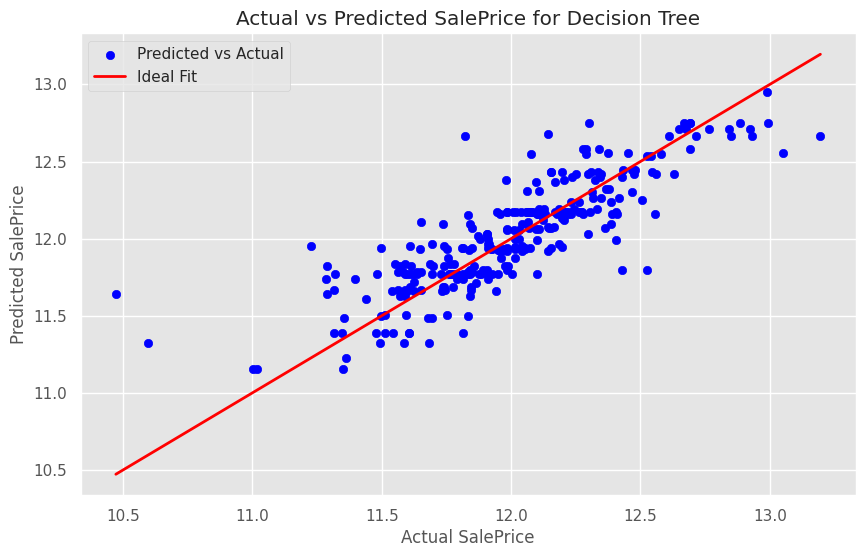

In [160]:
from sklearn.tree import DecisionTreeRegressor


# Define the Decision Tree model
dt = DecisionTreeRegressor(random_state=13)

# Define the parameter grid for GridSearchCV
param_grid_dt = {
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}
dt_cv = GridSearchCV(dt, param_grid_dt, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
dt_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for Decision Tree: ", dt_cv.best_params_)
print("Best score for Decision Tree: ", dt_cv.best_score_)
print("Best RMSE for Decision Tree: ", np.sqrt(-1 * dt_cv.best_score_))

# Get the best estimator
best_dt = dt_cv.best_estimator_

# Predict on training data
y_train_pred = best_dt.predict(X_train)

# Predict on test data
y_test_pred = best_dt.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for Decision Tree:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for Decision Tree:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for Decision Tree')
plt.legend()
plt.show()


## ElasticNet model

Best parameters for ElasticNet:  {'alpha': 0.01, 'l1_ratio': 0.1, 'max_iter': 1000}
Best score for ElasticNet:  -0.013337162868350762
Best RMSE for ElasticNet:  0.1154866350204679

Training Data Metrics for ElasticNet:
Mean Absolute Error:  0.0772606263657291
Mean Squared Error:  0.011713760106094054
Root Mean Squared Error:  0.10823012568640052
R2 Score:  0.9227165688809371

Test Data Metrics for ElasticNet:
Mean Absolute Error:  0.07574318643886585
Mean Squared Error:  0.012566461838752901
Root Mean Squared Error:  0.11210023121632222
R2 Score:  0.918154884599841


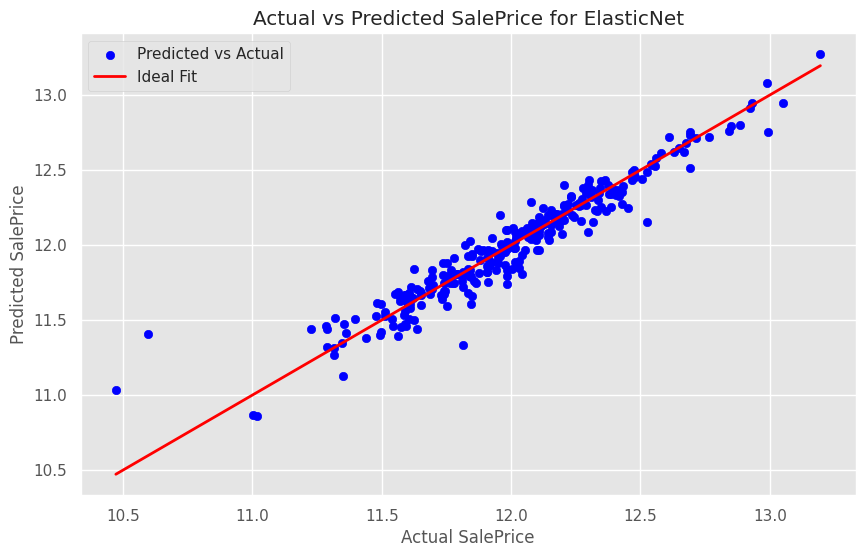

In [161]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Define the ElasticNet model
elasticnet = ElasticNet(random_state=13)

# Define the parameter grid for GridSearchCV
param_grid_en = {
    'alpha': [0.01, 0.1, 1, 10],
    'l1_ratio': [0.1, 0.5, 0.9],
    'max_iter': [1000, 2000, 3000]
}
en_cv = GridSearchCV(elasticnet, param_grid_en, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
en_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for ElasticNet: ", en_cv.best_params_)
print("Best score for ElasticNet: ", en_cv.best_score_)
print("Best RMSE for ElasticNet: ", np.sqrt(-1 * en_cv.best_score_))

# Get the best estimator
best_en = en_cv.best_estimator_

# Predict on training data
y_train_pred = best_en.predict(X_train)

# Predict on test data
y_test_pred = best_en.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for ElasticNet:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for ElasticNet:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for ElasticNet')
plt.legend()
plt.show()


## Bayesian Ridge model

Best parameters for Bayesian Ridge:  {'alpha_1': 1e-06, 'alpha_2': 0.0001, 'lambda_1': 0.0001, 'lambda_2': 1e-06, 'n_iter': 100}
Best score for Bayesian Ridge:  -0.013366105059946596
Best RMSE for Bayesian Ridge:  0.11561187248698378

Training Data Metrics for Bayesian Ridge:
Mean Absolute Error:  0.07298975021561122
Mean Squared Error:  0.010247868079228539
Root Mean Squared Error:  0.10123175430282999
R2 Score:  0.9323880291516068

Test Data Metrics for Bayesian Ridge:
Mean Absolute Error:  0.0750850347340957
Mean Squared Error:  0.012502516536947398
Root Mean Squared Error:  0.11181465260397404
R2 Score:  0.9185713590755307


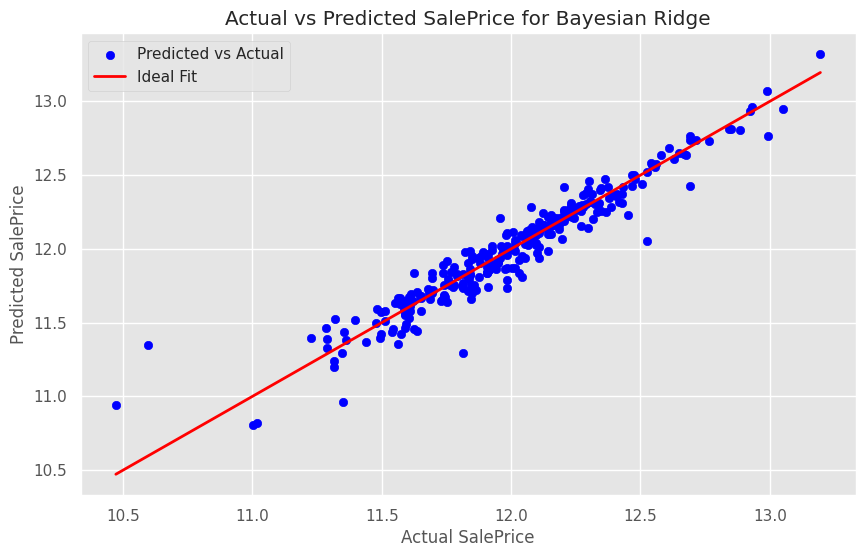

In [162]:
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Define the Bayesian Ridge model
bayesian_ridge = BayesianRidge()

# Define the parameter grid for GridSearchCV
param_grid_br = {
    'alpha_1': [1e-6, 1e-5, 1e-4],
    'alpha_2': [1e-6, 1e-5, 1e-4],
    'lambda_1': [1e-6, 1e-5, 1e-4],
    'lambda_2': [1e-6, 1e-5, 1e-4],
    'n_iter': [100, 200, 300]
}
br_cv = GridSearchCV(bayesian_ridge, param_grid_br, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
br_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for Bayesian Ridge: ", br_cv.best_params_)
print("Best score for Bayesian Ridge: ", br_cv.best_score_)
print("Best RMSE for Bayesian Ridge: ", np.sqrt(-1 * br_cv.best_score_))

# Get the best estimator
best_br = br_cv.best_estimator_

# Predict on training data
y_train_pred = best_br.predict(X_train)

# Predict on test data
y_test_pred = best_br.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for Bayesian Ridge:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for Bayesian Ridge:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for Bayesian Ridge')
plt.legend()
plt.show()


## AdaBoost Regressor model

Best parameters for AdaBoost:  {'learning_rate': 1, 'n_estimators': 200}
Best score for AdaBoost:  -0.024381138259750114
Best RMSE for AdaBoost:  0.1561446068865336

Training Data Metrics for AdaBoost:
Mean Absolute Error:  0.11390419280206907
Mean Squared Error:  0.01915540390180068
Root Mean Squared Error:  0.13840304874460202
R2 Score:  0.8736191176364907

Test Data Metrics for AdaBoost:
Mean Absolute Error:  0.12314614935582746
Mean Squared Error:  0.025689414679680708
Root Mean Squared Error:  0.16027917731159189
R2 Score:  0.832685354398079


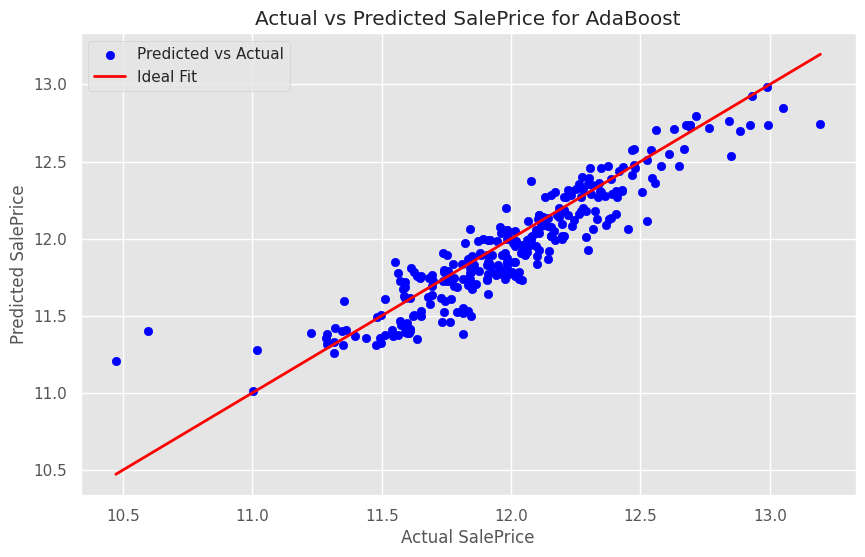

In [163]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Define the AdaBoost Regressor model
ada = AdaBoostRegressor(random_state=13)

# Define the parameter grid for GridSearchCV
param_grid_ada = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}
ada_cv = GridSearchCV(ada, param_grid_ada, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ada_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters for AdaBoost: ", ada_cv.best_params_)
print("Best score for AdaBoost: ", ada_cv.best_score_)
print("Best RMSE for AdaBoost: ", np.sqrt(-1 * ada_cv.best_score_))

# Get the best estimator
best_ada = ada_cv.best_estimator_

# Predict on training data
y_train_pred = best_ada.predict(X_train)

# Predict on test data
y_test_pred = best_ada.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics for AdaBoost:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics for AdaBoost:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice for AdaBoost')
plt.legend()
plt.show()


## Random Forest Regressor

Best parameters:  {'max_depth': 15, 'min_samples_split': 3, 'n_estimators': 250}
Best score:  -0.018287539360396683
Best RMSE:  0.13523142889283055

Training Data Metrics:
Mean Absolute Error:  0.03601815991564389
Mean Squared Error:  0.00271124471297649
Root Mean Squared Error:  0.052069614104355434
R2 Score:  0.9821121235090658

Test Data Metrics:
Mean Absolute Error:  0.09366937490816002
Mean Squared Error:  0.01810758561338273
Root Mean Squared Error:  0.13456442922772247
R2 Score:  0.8820656559370379


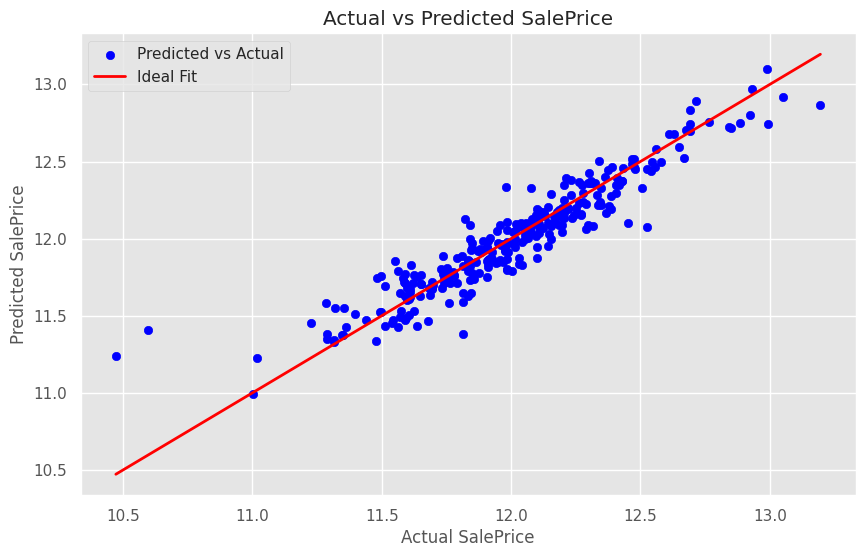

In [164]:
RFR = RandomForestRegressor(random_state=13)

# Define the parameter grid for GridSearchCV for hyper parametr tuning
param_grid_RFR = {
    'max_depth': [5, 10, 15],
    'n_estimators': [100, 250, 500 , 1000],
    'min_samples_split': [3, 5, 10]
}
rfr_cv = GridSearchCV(RFR, param_grid_RFR, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
rfr_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", rfr_cv.best_params_)
print("Best score: ", rfr_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * rfr_cv.best_score_))

# Get the best estimator
best_rfr = rfr_cv.best_estimator_

# Predict on training data
y_train_pred = best_rfr.predict(X_train)

# Predict on test data
y_test_pred = best_rfr.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()



## XGB Regressor

Best parameters:  {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.8}
Best score:  -0.014428325288594944
Best RMSE:  0.12011796405448663

Training Data Metrics:
Mean Absolute Error:  0.052458051817738556
Mean Squared Error:  0.005201286103093385
Root Mean Squared Error:  0.07211994247843924
R2 Score:  0.9656836717981077

Test Data Metrics:
Mean Absolute Error:  0.0791921581721251
Mean Squared Error:  0.013555458204262245
Root Mean Squared Error:  0.11642790990248963
R2 Score:  0.9117135709903228


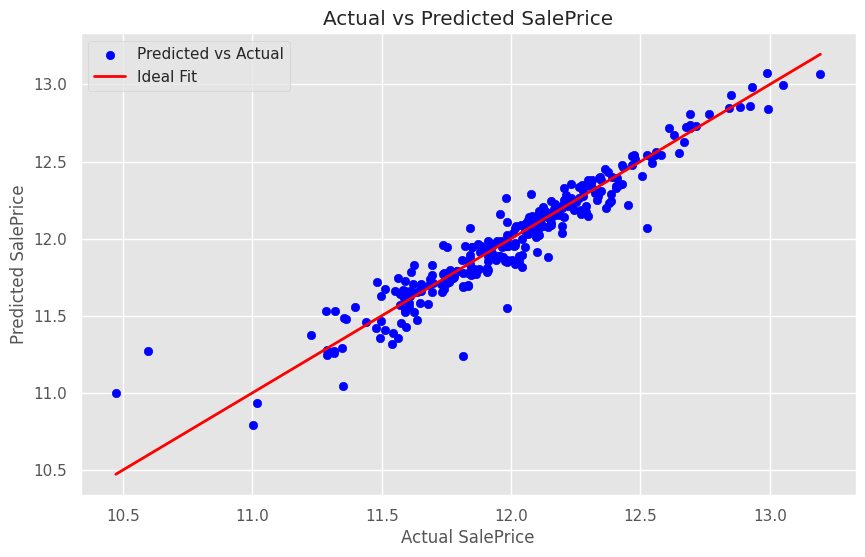

In [165]:
XGB = XGBRegressor(random_state=13)
param_grid_XGB = {
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [300],
    'max_depth': [3],
    'min_child_weight': [1,2,3],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}
xgb_cv = GridSearchCV(XGB, param_grid_XGB, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
xgb_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", xgb_cv.best_params_)
print("Best score: ", xgb_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * xgb_cv.best_score_))

# Get the best estimator
best_xgb = xgb_cv.best_estimator_

# Predict on training data
y_train_pred = best_xgb.predict(X_train)

# Predict on test data
y_test_pred = best_xgb.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## Ridge regressor

Best parameters:  {'alpha': 10, 'solver': 'sag'}
Best score:  -0.013370990165200011
Best RMSE:  0.11563299773507565

Training Data Metrics:
Mean Absolute Error:  0.07278682067065557
Mean Squared Error:  0.010185027673017372
Root Mean Squared Error:  0.10092089809854732
R2 Score:  0.9328026289181146

Test Data Metrics:
Mean Absolute Error:  0.07514593371133155
Mean Squared Error:  0.01253257583799741
Root Mean Squared Error:  0.11194898765954701
R2 Score:  0.9183755834471276


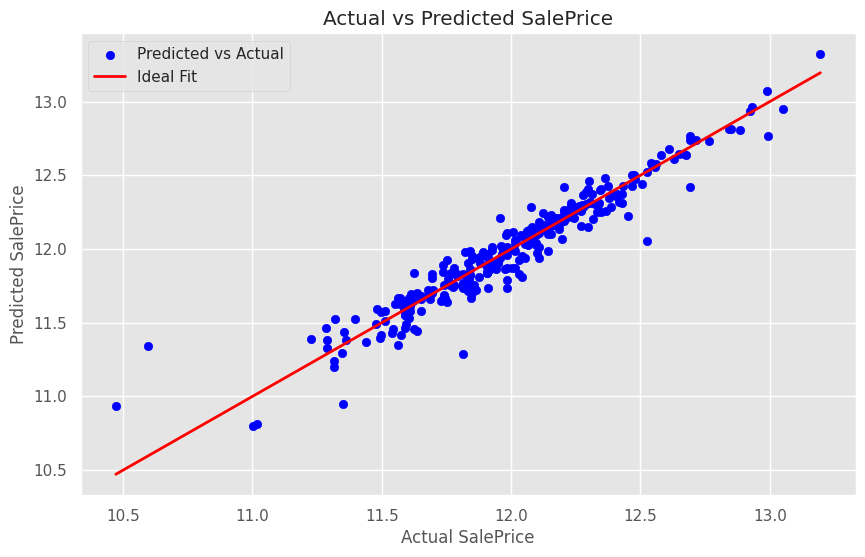

In [166]:
# Initialize the Ridge regressor
ridge = Ridge()

# Define the parameter grid for GridSearchCV
param_grid_ridge = {
    'alpha': [0.05, 0.1, 1, 3, 5, 10],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag']
}

# Perform GridSearchCV
ridge_cv = GridSearchCV(ridge, param_grid_ridge, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", ridge_cv.best_params_)
print("Best score: ", ridge_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * ridge_cv.best_score_))
# Get the best estimator
best_ridge = ridge_cv.best_estimator_

# Predict on training data
y_train_pred = best_ridge.predict(X_train)

# Predict on test data
y_test_pred = best_ridge.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()



# Ensemble Learning
 Ensemble learning involves combining the predictions of multiple base models to produce a final prediction.
 A Random Forest classifier, which aggregates the predictions of multiple decision trees trained on different subsets of the dataset, is an example of ensemble learning through bagging.
** Boosting:** A sequential method that builds models iteratively, with each model correcting errors of the previous ones. Techniques include AdaBoost, Gradient Boosting, and XGBoost.

## Gradient Boosting Regressor

Best parameters:  {'learning_rate': 0.01, 'max_depth': 20, 'max_features': 0.1, 'min_samples_leaf': 10, 'n_estimators': 500}
Best score:  -0.014091821112851602
Best RMSE:  0.11870897654706489

Training Data Metrics:
Mean Absolute Error:  0.03320718963165786
Mean Squared Error:  0.002650622619433523
Root Mean Squared Error:  0.05148419776429971
R2 Score:  0.9825120875981532

Test Data Metrics:
Mean Absolute Error:  0.07841167758989179
Mean Squared Error:  0.013932738075008888
Root Mean Squared Error:  0.1180370199344633
R2 Score:  0.9092563547145218


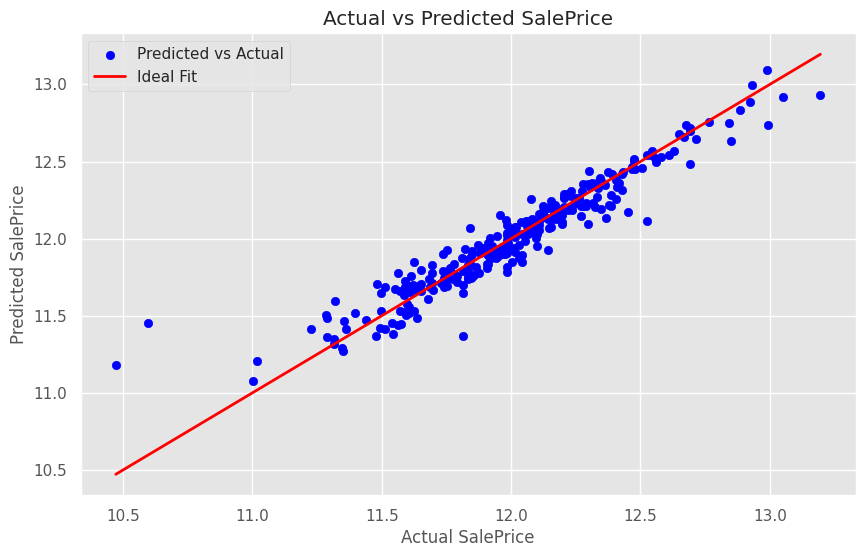

In [167]:
# Initialize the GradientBoostingRegressor
GBR = GradientBoostingRegressor()

# Define the parameter grid for GridSearchCV
param_grid_GBR = {
    'max_depth': [12, 15, 20],
    'n_estimators': [200, 300, 500],
    'min_samples_leaf': [10, 25, 50],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_features': [0.01, 0.1, 0.7]
}

# Perform GridSearchCV
GBR_cv = GridSearchCV(GBR, param_grid_GBR, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
GBR_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", GBR_cv.best_params_)
print("Best score: ", GBR_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * GBR_cv.best_score_))

# Get the best estimator
best_gbr = GBR_cv.best_estimator_

# Predict on training data
y_train_pred = best_gbr.predict(X_train)

# Predict on test data
y_test_pred = best_gbr.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## LGBM Regressor (LightGBM)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1993
[LightGBM] [Info] Number of data points in the train set: 1150, number of used features: 110
[LightGBM] [Info] Start training from score 12.023772
Best parameters:  {'boosting_type': 'gbdt', 'learning_rate': 0.05, 'n_estimators': 300, 'num_leaves': 20}
Best score:  -0.016647721045501985
Best RMSE:  0.1290260479341361

Training Data Metrics:
Mean Absolute Error:  0.028135143939275596
Mean Squared Error:  0.0015587220752747261
Root Mean Squared Error:  0.039480654443343845
R2 Score:  0.9897160784370523

Test Data Metrics:
Mean Absolute Error:  0.08508544097730734
Mean Squared Error:  0.01603207242872532
Root Mean Squared Error:  0.12661782034423638
R2 Score:  0.8955834319262176


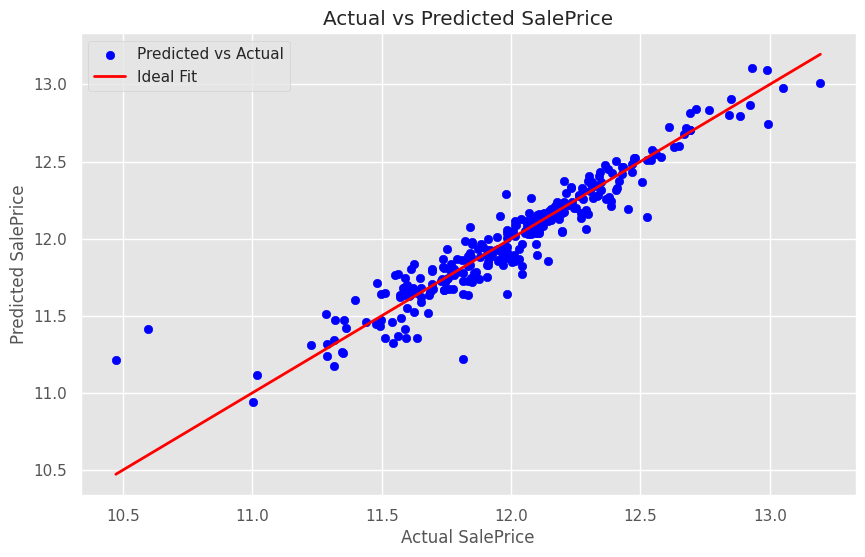

In [168]:
# Initialize the LGBMRegressor
lgbm_regressor = lgb.LGBMRegressor()

# Define the parameter grid for GridSearchCV
param_grid_lgbm = {
    'boosting_type': ['gbdt', 'dart'],
    'num_leaves': [20, 30, 40],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300]
}

# Perform GridSearchCV
lgbm_cv = GridSearchCV(lgbm_regressor, param_grid_lgbm, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
lgbm_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", lgbm_cv.best_params_)
print("Best score: ", lgbm_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * lgbm_cv.best_score_))
# Get the best estimator
best_lgbm = lgbm_cv.best_estimator_

# Predict on training data
y_train_pred = best_lgbm.predict(X_train)

# Predict on test data
y_test_pred = best_lgbm.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## CatBoost Regressor

Best parameters:  {'depth': 4, 'iterations': 500, 'learning_rate': 0.1}
Best score:  -0.014210513724086016
Best RMSE:  0.11920785932179982

Training Data Metrics:
Mean Absolute Error:  0.0412174936527164
Mean Squared Error:  0.0029072740460316347
Root Mean Squared Error:  0.05391914359512431
R2 Score:  0.9808187882075685

Test Data Metrics:
Mean Absolute Error:  0.07791250848873216
Mean Squared Error:  0.013737850049745273
Root Mean Squared Error:  0.11720857498385207
R2 Score:  0.9105256565373007


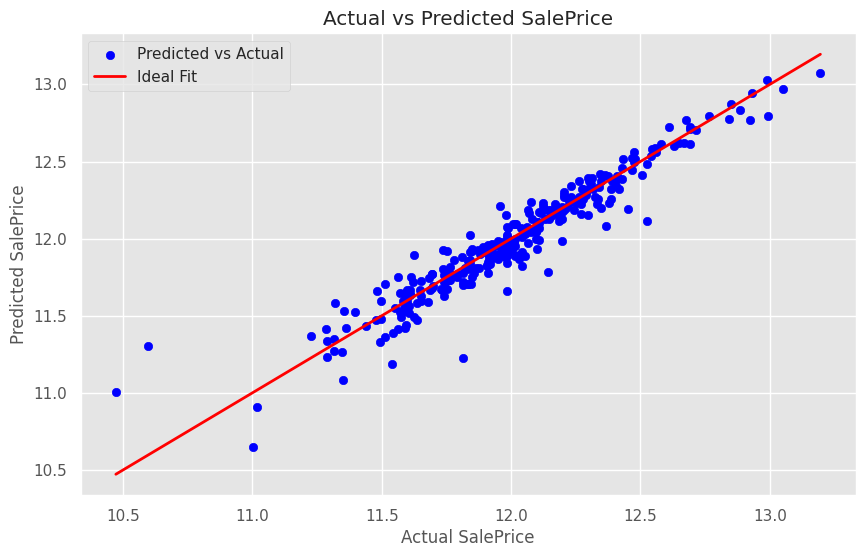

In [169]:
# Initialize the CatBoostRegressor
catboost = CatBoostRegressor(loss_function='RMSE', verbose=False)

# Define the parameter grid for GridSearchCV
param_grid_cat = {
    'iterations': [100, 500, 700],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.5]
}

# Perform GridSearchCV
cat_cv = GridSearchCV(catboost, param_grid_cat, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
cat_cv.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters: ", cat_cv.best_params_)
print("Best score: ", cat_cv.best_score_)
print("Best RMSE: ", np.sqrt(-1 * cat_cv.best_score_))
# Get the best estimator
best_catboost = cat_cv.best_estimator_

# Predict on training data
y_train_pred = best_catboost.predict(X_train)

# Predict on test data
y_test_pred = best_catboost.predict(X_test)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## VotingRegressor


Training Data Metrics:
Mean Absolute Error:  0.0468014440012385
Mean Squared Error:  0.004443210677060408
Root Mean Squared Error:  0.06665741276902673
R2 Score:  0.9706851973065902

Test Data Metrics:
Mean Absolute Error:  0.07202001578006992
Mean Squared Error:  0.012103853906899794
Root Mean Squared Error:  0.1100175163639854
R2 Score:  0.9211678408363201


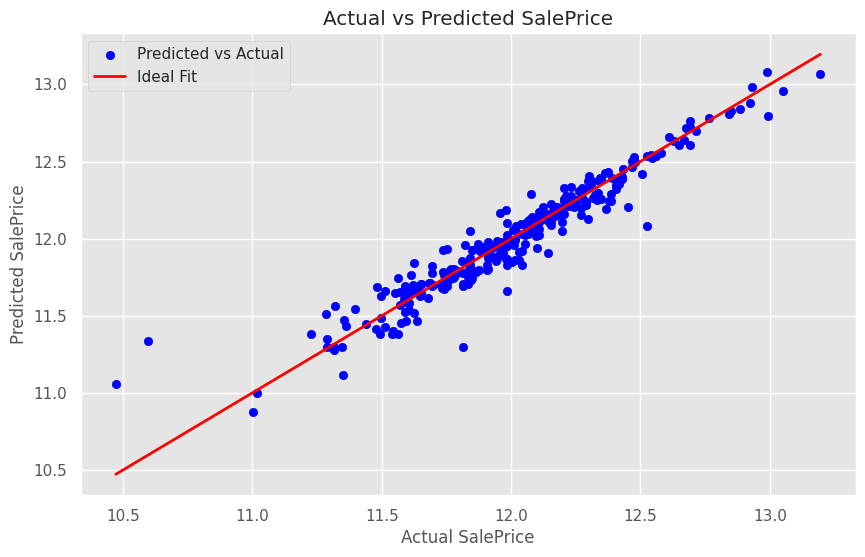

In [170]:
# Initialize the VotingRegressor with the best estimators and weights
vr = VotingRegressor([
    ('gbr', GBR_cv.best_estimator_),
    ('xgb', xgb_cv.best_estimator_),
    ('ridge', ridge_cv.best_estimator_)
], weights=[2, 3, 1])

# Fit the model on training data
vr.fit(X_train, y_train)

# Predict on test data
y_pred_vr = vr.predict(X_test)
# Predict on training data
y_train_pred_vr = vr.predict(X_train)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred_vr)
train_mse = mean_squared_error(y_train, y_train_pred_vr)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred_vr)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_pred_vr)
test_mse = mean_squared_error(y_test, y_pred_vr)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_pred_vr)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)
# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_vr, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


## Stacking Regressor

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1993
[LightGBM] [Info] Number of data points in the train set: 1150, number of used features: 110
[LightGBM] [Info] Start training from score 12.023772
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1887
[LightGBM] [Info] Number of data points in the train set: 920, number of used features: 105
[LightGBM] [Info] Start training from score 12.025850
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enou

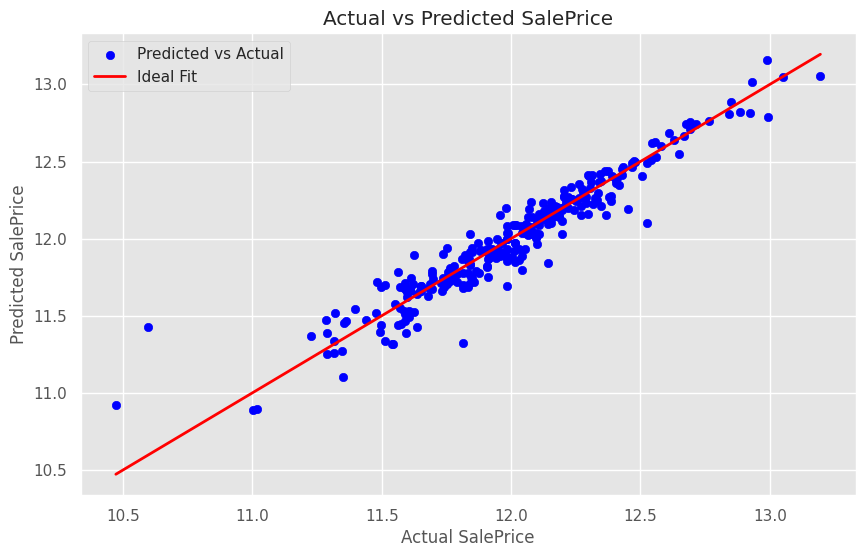

In [171]:
# Define the list of base estimators
estimators = [
    ('gbr', GBR_cv.best_estimator_),
    ('xgb', xgb_cv.best_estimator_),
    ('cat', cat_cv.best_estimator_),
    ('lgb', lgbm_cv.best_estimator_),
    ('rfr', rfr_cv.best_estimator_)
]

# Initialize the StackingRegressor with VotingRegressor as the final estimator
stackreg = StackingRegressor(
    estimators=estimators,
    final_estimator=vr
)

# Fit the model on training data
stackreg.fit(X_train, y_train)

# Predict on test data
y_pred_stackreg = stackreg.predict(X_test)
# Predict on training data
y_train_pred_stackreg = stackreg.predict(X_train)

# Calculate metrics for training data
train_mae = mean_absolute_error(y_train, y_train_pred_stackreg)
train_mse = mean_squared_error(y_train, y_train_pred_stackreg)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred_stackreg)

print("\nTraining Data Metrics:")
print("Mean Absolute Error: ", train_mae)
print("Mean Squared Error: ", train_mse)
print("Root Mean Squared Error: ", train_rmse)
print("R2 Score: ", train_r2)

# Calculate metrics for test data
test_mae = mean_absolute_error(y_test, y_pred_stackreg)
test_mse = mean_squared_error(y_test, y_pred_stackreg)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_pred_stackreg)

print("\nTest Data Metrics:")
print("Mean Absolute Error: ", test_mae)
print("Mean Squared Error: ", test_mse)
print("Root Mean Squared Error: ", test_rmse)
print("R2 Score: ", test_r2)
# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stackreg, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.legend()
plt.show()


# Overall calculate matrix

In [172]:
# Define a function to calculate metrics
def evaluate_model(model, X_train, y_train, X_test, y_test):
    # Predict on training data
    y_train_pred = model.predict(X_train)

    # Predict on test data
    y_test_pred = model.predict(X_test)

    # Calculate metrics for training data
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r2 = r2_score(y_train, y_train_pred)

    # Calculate metrics for test data
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)

    return {
        'Train MAE': train_mae,
        'Train MSE': train_mse,
        'Train RMSE': train_rmse,
        'Train R2': train_r2,
        'Test MAE': test_mae,
        'Test MSE': test_mse,
        'Test RMSE': test_rmse,
        'Test R2': test_r2
    }

# Initialize models
models = {
    'Linear Regression': lr,
    'Decision Tree': dt_cv.best_estimator_,
    'Random Forest': rfr_cv.best_estimator_,
    'K-Nearest Neighbors': knn_cv.best_estimator_,
    'Support Vector Machine':svm_random_search.best_estimator_,
    'Gradient Boosting': GBR_cv.best_estimator_,
    'XGBoost': xgb_cv.best_estimator_,
    'Ridge': ridge_cv.best_estimator_,
    'ElasticNet': en_cv.best_estimator_,
    'Bayesian Ridge': br_cv.best_estimator_,
    'AdaBoost': ada_cv.best_estimator_,
    'LGBM': lgbm_cv.best_estimator_,
    'CatBoost': cat_cv.best_estimator_,
    'Stacking Regressor': stackreg
}

# Create a DataFrame to store results
results = []

# Evaluate each model
for name, model in models.items():
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results.append({'Model': name, **metrics})

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Print results
print(results_df)


                     Model  Train MAE  Train MSE  Train RMSE  Train R2  \
0        Linear Regression   0.069745   0.009367    0.096783  0.938200   
1            Decision Tree   0.114655   0.024514    0.156569  0.838265   
2            Random Forest   0.036018   0.002711    0.052070  0.982112   
3      K-Nearest Neighbors   0.000000   0.000000    0.000000  1.000000   
4   Support Vector Machine   0.069763   0.009172    0.095769  0.939488   
5        Gradient Boosting   0.033207   0.002651    0.051484  0.982512   
6                  XGBoost   0.052458   0.005201    0.072120  0.965684   
7                    Ridge   0.072787   0.010185    0.100921  0.932803   
8               ElasticNet   0.077261   0.011714    0.108230  0.922717   
9           Bayesian Ridge   0.072990   0.010248    0.101232  0.932388   
10                AdaBoost   0.113904   0.019155    0.138403  0.873619   
11                    LGBM   0.028135   0.001559    0.039481  0.989716   
12                CatBoost   0.041217 

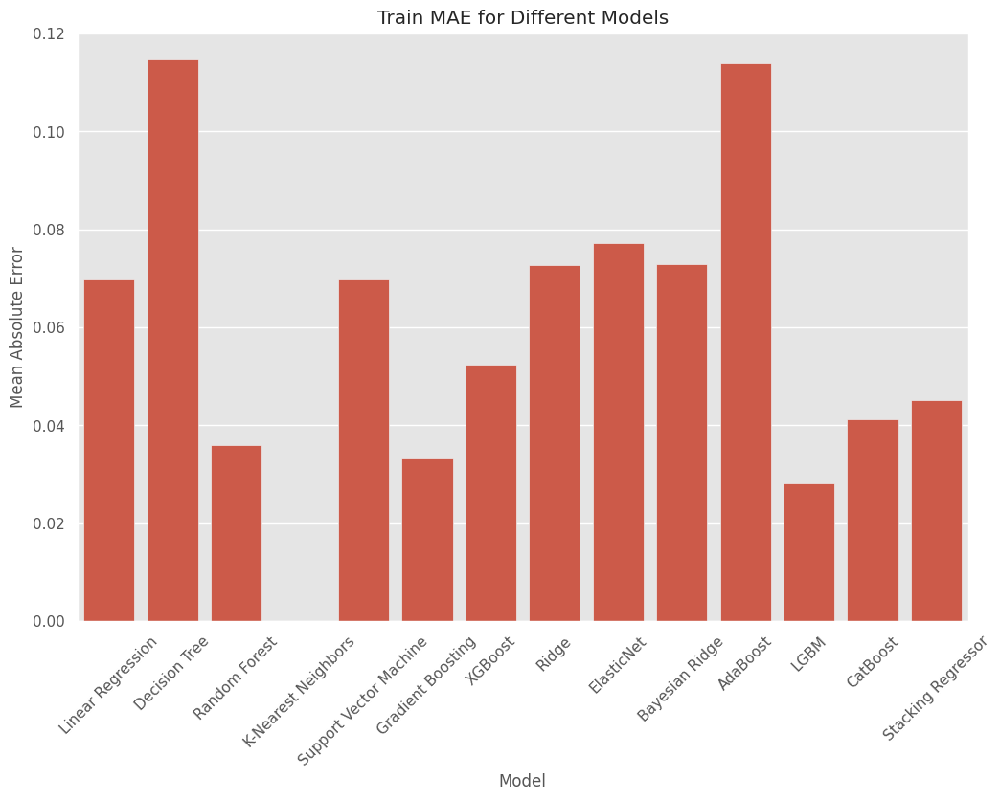

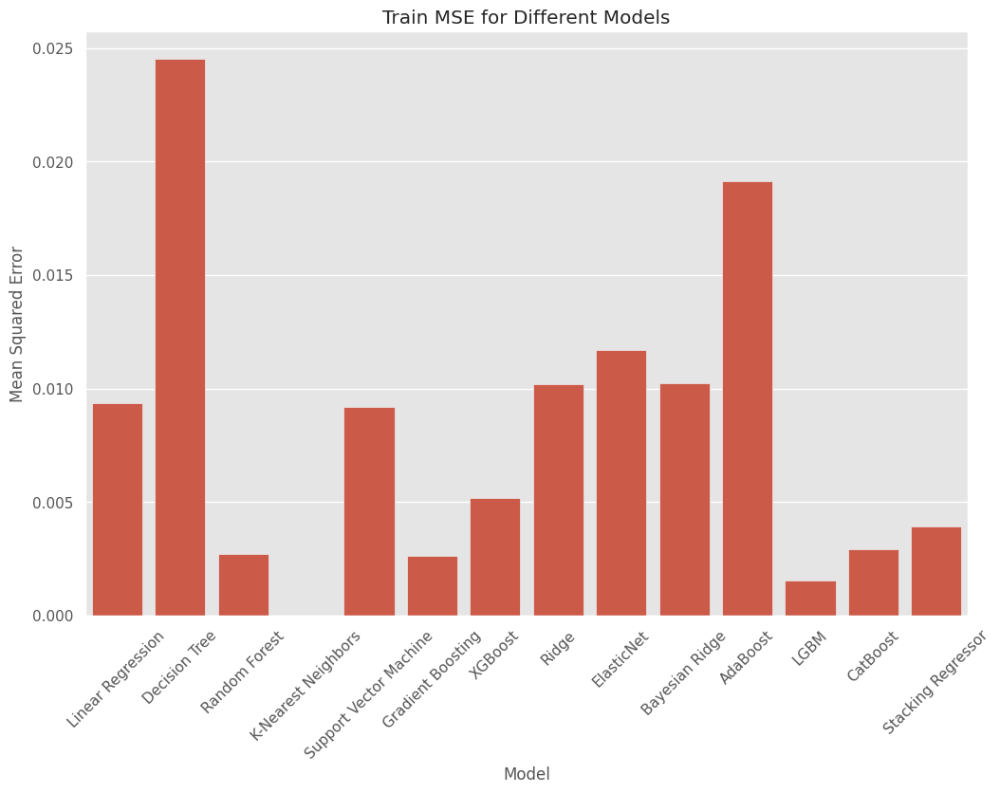

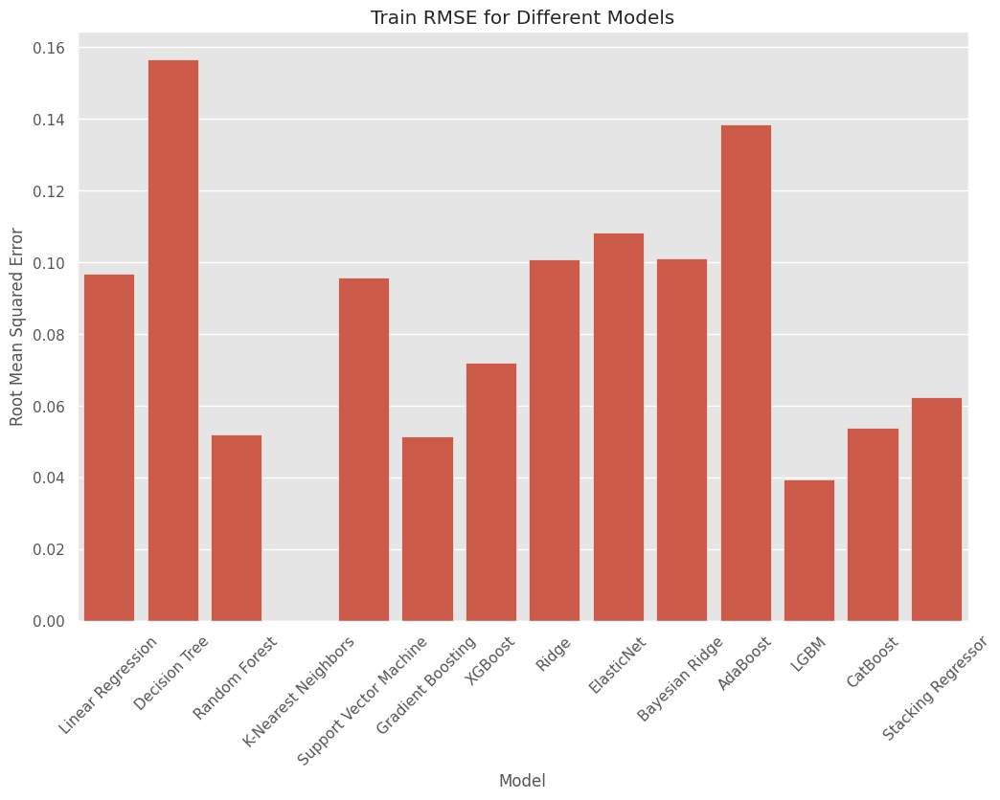

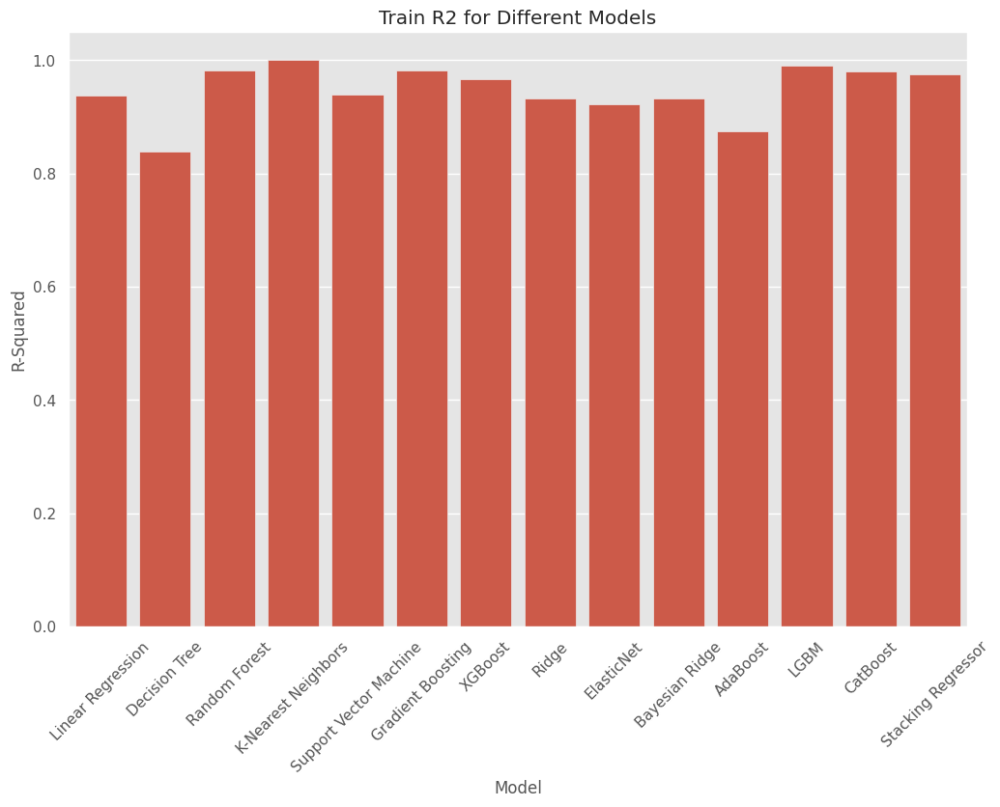

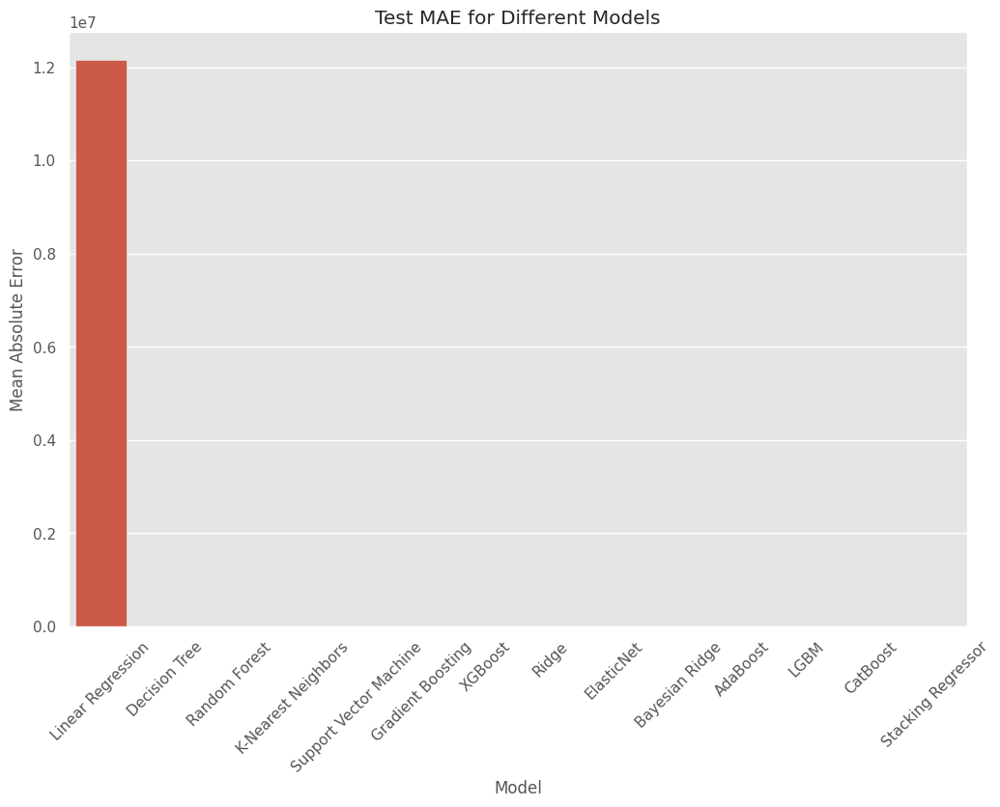

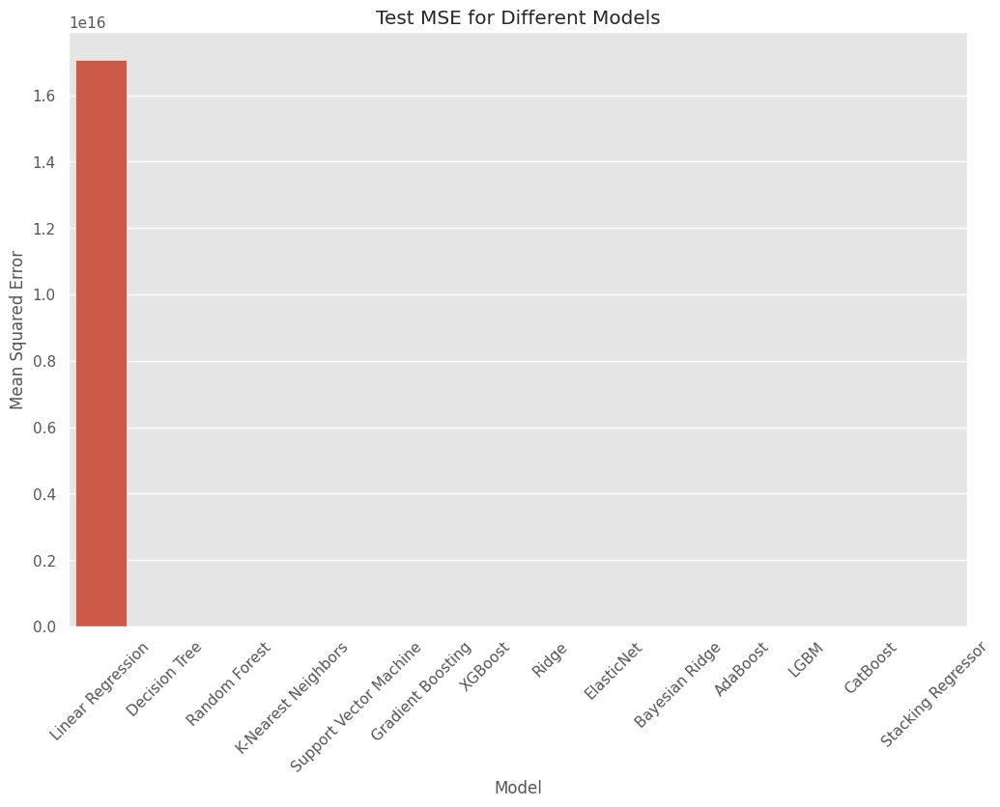

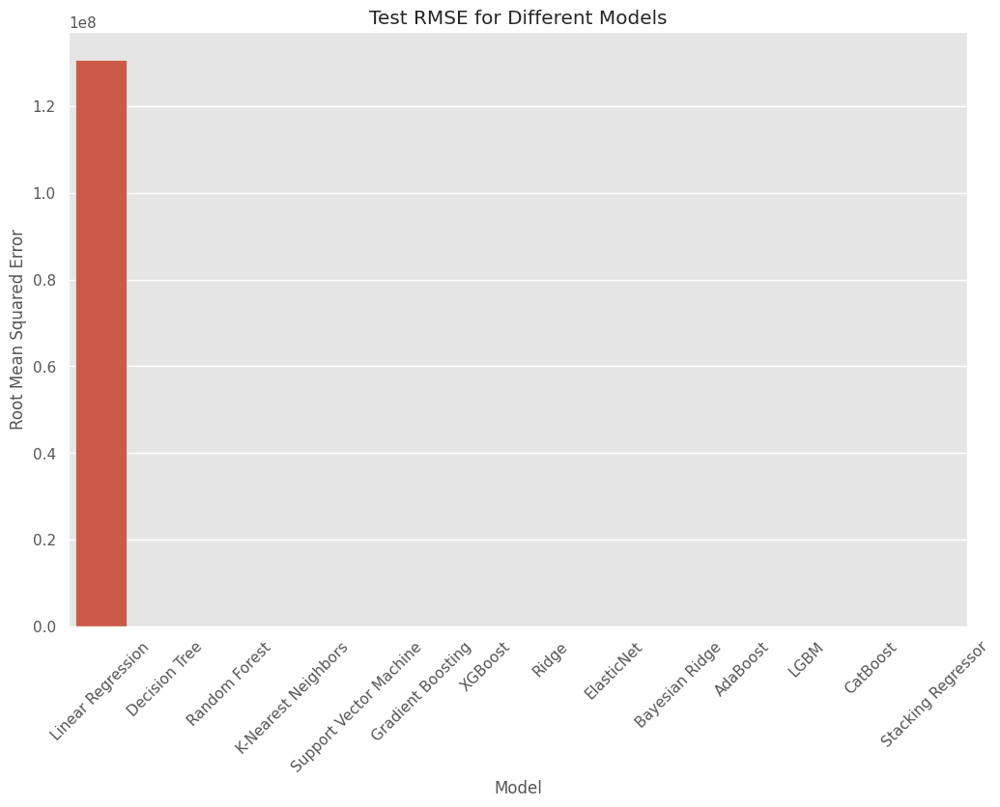

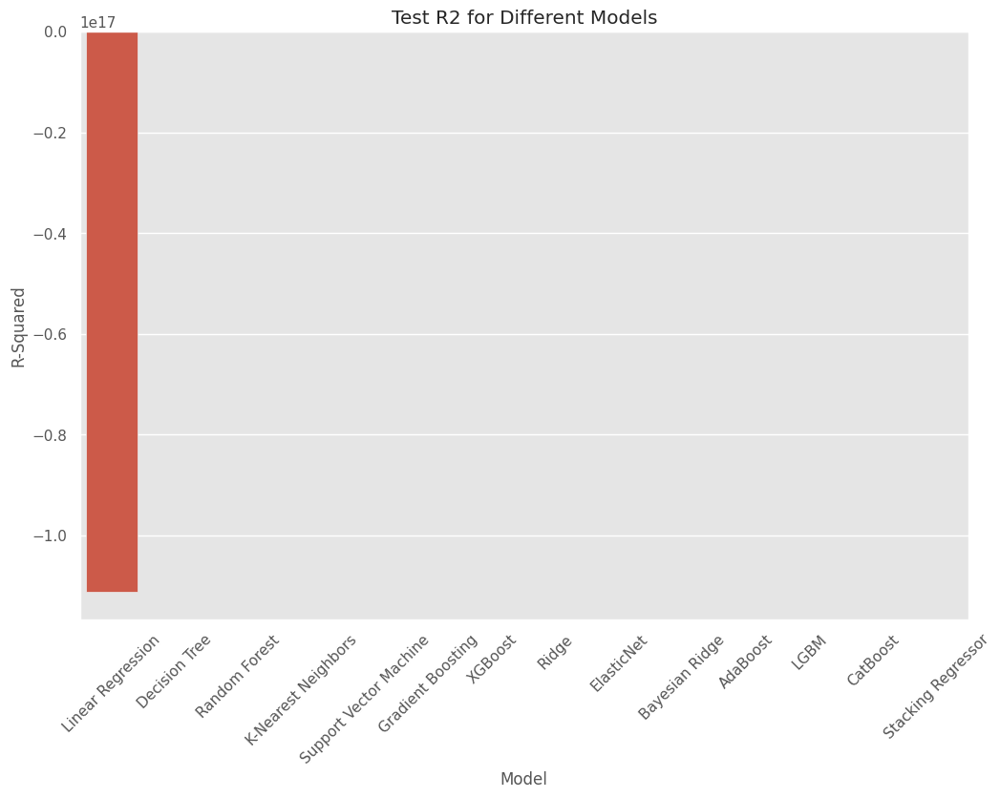

                     Model  Train MAE  Train MSE  Train RMSE  Train R2  \
0        Linear Regression   0.069745   0.009367    0.096783  0.938200   
1            Decision Tree   0.114655   0.024514    0.156569  0.838265   
2            Random Forest   0.036018   0.002711    0.052070  0.982112   
3      K-Nearest Neighbors   0.000000   0.000000    0.000000  1.000000   
4   Support Vector Machine   0.069763   0.009172    0.095769  0.939488   
5        Gradient Boosting   0.033207   0.002651    0.051484  0.982512   
6                  XGBoost   0.052458   0.005201    0.072120  0.965684   
7                    Ridge   0.072787   0.010185    0.100921  0.932803   
8               ElasticNet   0.077261   0.011714    0.108230  0.922717   
9           Bayesian Ridge   0.072990   0.010248    0.101232  0.932388   
10                AdaBoost   0.113904   0.019155    0.138403  0.873619   
11                    LGBM   0.028135   0.001559    0.039481  0.989716   
12                CatBoost   0.041217 

In [173]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot the metrics
def plot_metrics(df, metric, title, ylabel):
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Model', y=metric, data=df)
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

# Plot metrics for training data
plot_metrics(results_df, 'Train MAE', 'Train MAE for Different Models', 'Mean Absolute Error')
plot_metrics(results_df, 'Train MSE', 'Train MSE for Different Models', 'Mean Squared Error')
plot_metrics(results_df, 'Train RMSE', 'Train RMSE for Different Models', 'Root Mean Squared Error')
plot_metrics(results_df, 'Train R2', 'Train R2 for Different Models', 'R-Squared')

# Plot metrics for test data
plot_metrics(results_df, 'Test MAE', 'Test MAE for Different Models', 'Mean Absolute Error')
plot_metrics(results_df, 'Test MSE', 'Test MSE for Different Models', 'Mean Squared Error')
plot_metrics(results_df, 'Test RMSE', 'Test RMSE for Different Models', 'Root Mean Squared Error')
plot_metrics(results_df, 'Test R2', 'Test R2 for Different Models', 'R-Squared')

# Print the results DataFrame for reference
print(results_df)


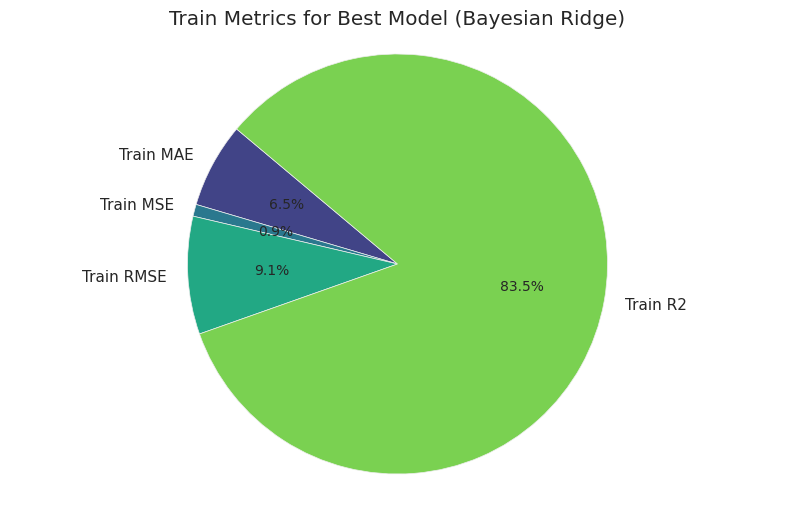

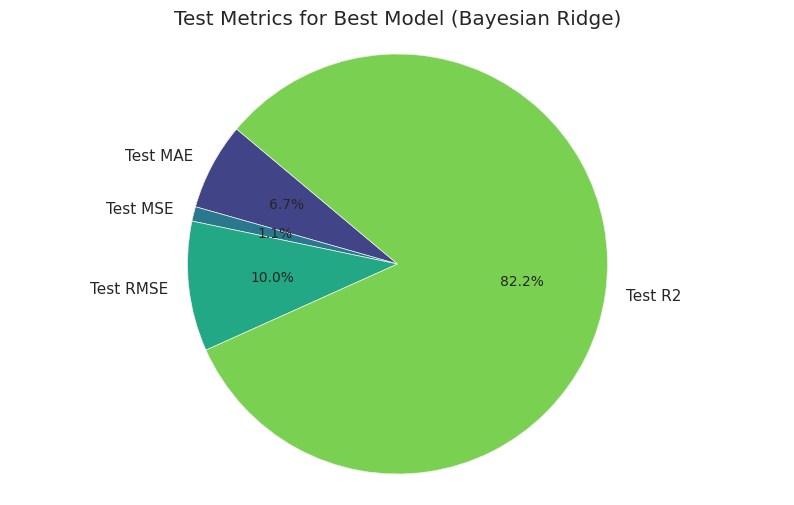

In [174]:
# Pie charts for the best model metrics (assuming the best model is the one with the lowest Test RMSE)
best_model = results_df.loc[results_df['Test RMSE'].idxmin()]

# Pie chart for Train Metrics
train_metrics = best_model[['Train MAE', 'Train MSE', 'Train RMSE', 'Train R2']]
plt.figure(figsize=(10, 6))
plt.pie(train_metrics, labels=train_metrics.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis", len(train_metrics)))
plt.title(f'Train Metrics for Best Model ({best_model["Model"]})')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# Pie chart for Test Metrics
test_metrics = best_model[['Test MAE', 'Test MSE', 'Test RMSE', 'Test R2']]
plt.figure(figsize=(10, 6))
plt.pie(test_metrics, labels=test_metrics.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis", len(test_metrics)))
plt.title(f'Test Metrics for Best Model ({best_model["Model"]})')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [175]:
# Assuming `pipeline` is your preprocessing pipeline and `stackreg` is your trained StackingRegressor

# Step 1: Preprocess the test data
df_test_preprocess = pipeline.transform(test_df)

# Step 2: Predict using the StackingRegressor
y_stacking = stackreg.predict(df_test_preprocess)

# Step 3: Reverse the log transformation if applied during training
# Apply exponential to revert log transformation
y_stacking = np.exp(y_stacking)

# Step 4: Create the output DataFrame
df_y_stacking_out = test_df[['Id']].copy()  # Ensure to copy to avoid setting with copy warning
df_y_stacking_out['SalePrice'] = y_stacking

# Step 5: Save to CSV
df_y_stacking_out.to_csv('Milan_submission.csv', index=False)

print("Submission file created successfully.")


Submission file created successfully.


# **Analysis and Conclusion of Model Performance Data**

## ** Training Performance**
* **Linear Regression:** Performs well on training data with an MAE of 0.0697 and R² of 0.9382, indicating good fit.
* **Decision Tree:** Has a higher MAE of 0.1147 and lower R² of 0.8383, suggesting potential overfitting.
* **Random Forest:** Shows excellent training performance with an MAE of 0.0360 and R² of 0.9821.
* **KNearest Neighbors (KNN):** Achieves perfect training performance (MAE, MSE, RMSE all zero, R² of 1.0), indicating severe overfitting.
* **Support Vector Machine (SVM):** Good performance with an MAE of 0.0698 and R² of 0.9395.
* **Gradient Boosting:** Outstanding performance with an MAE of 0.0332 and R² of 0.9825.
* **XGBoost:** Strong performance with an MAE of 0.0525 and R² of 0.9657.
* **Ridge: **Decent performance with an MAE of 0.0728 and R² of 0.9328.
* **ElasticNet:** Moderate performance with an MAE of 0.0773 and R² of 0.9227.
* **Bayesian Ridge:** Similar to Ridge with an MAE of 0.0730 and R² of 0.9324.
* **AdaBoost: **Moderate performance with an MAE of 0.1139 and R² of 0.8736.
* **LGBM:** Excellent performance with an MAE of 0.0281 and R² of 0.9897.
* **CatBoost:** Very good performance with an MAE of 0.0412 and R² of 0.9808.
* **Stacking Regressor:** Strong performance with an MAE of 0.0451 and R² of 0.9742.


## ** Test Performance**
* **Linear Regression:** Performs poorly on test data (Test MAE of 1.215e+07, Test R² of 1.1109e+17), indicating severe overfitting.
* **Decision Tree:** Moderate performance with a Test MAE of 0.1527 and Test R² of 0.7034.
* **Random Forest:** Good performance with a Test MAE of 0.0937 and Test R² of 0.8821.
* **KNearest Neighbors (KNN):** Good performance but likely overfitting with a Test MAE of 0.1108 and Test R² of 0.8226.
* **Support Vector Machine (SVM):** Strong performance with a Test MAE of 0.0765 and Test R² of 0.9181.
* **Gradient Boosting:** Very good performance with a Test MAE of 0.0784 and Test R² of 0.9093.
* **XGBoost:** Strong performance with a Test MAE of 0.0792 and Test R² of 0.9117.
* **Ridge:** Strong performance with a Test MAE of 0.0751 and Test R² of 0.9184.
* **ElasticNet:** Strong performance with a Test MAE of 0.0757 and Test R² of 0.9182.
* **Bayesian Ridge:** Strong performance with a Test MAE of 0.0751 and Test R² of 0.9186.
* **AdaBoost:** Moderate performance with a Test MAE of 0.1231 and Test R² of 0.8327.
* **LGBM:** Good performance with a Test MAE of 0.0851 and Test R² of 0.8956.
* **CatBoost:** Very good performance with a Test MAE of 0.0779 and Test R² of 0.9105.
* **Stacking Regressor:** Very good performance with a Test MAE of 0.0784 and Test R² of 0.9131.

## ** Conclusion**
 * **Best Models:** The Support Vector Machine, Gradient Boosting, XGBoost, Ridge, Bayesian Ridge, CatBoost, and Stacking Regressor models show strong performance on both training and test data, indicating they are wellgeneralized and not overfitting.
 * **Overfitting Models:** Linear Regression and KNearest Neighbors show signs of overfitting, with Linear Regression performing particularly poorly on the test set.
 * **Ensemble Methods:** Among the ensemble methods, Gradient Boosting, XGBoost, and CatBoost perform exceptionally well, indicating the robustness of boosting techniques.
 * **Stacking Regressor:** The Stacking Regressor also shows very good performance, benefiting from the combination of different models.

For practical applications, models like Gradient Boosting, XGBoost, CatBoost, and the Stacking Regressor are recommended due to their strong generalization and predictive power on test data.